In [1]:
install.packages("igraph")
install.packages("pracma", repos="http://R-Forge.R-project.org")



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [2]:
install.packages("matrixStats")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [3]:
library('igraph')
library('Matrix')
library('pracma')
library('matrixStats')
set.seed(1)
options(warn=-1)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union



Attaching package: ‘pracma’


The following objects are masked from ‘package:Matrix’:

    expm, lu, tril, triu




**Question 1A**

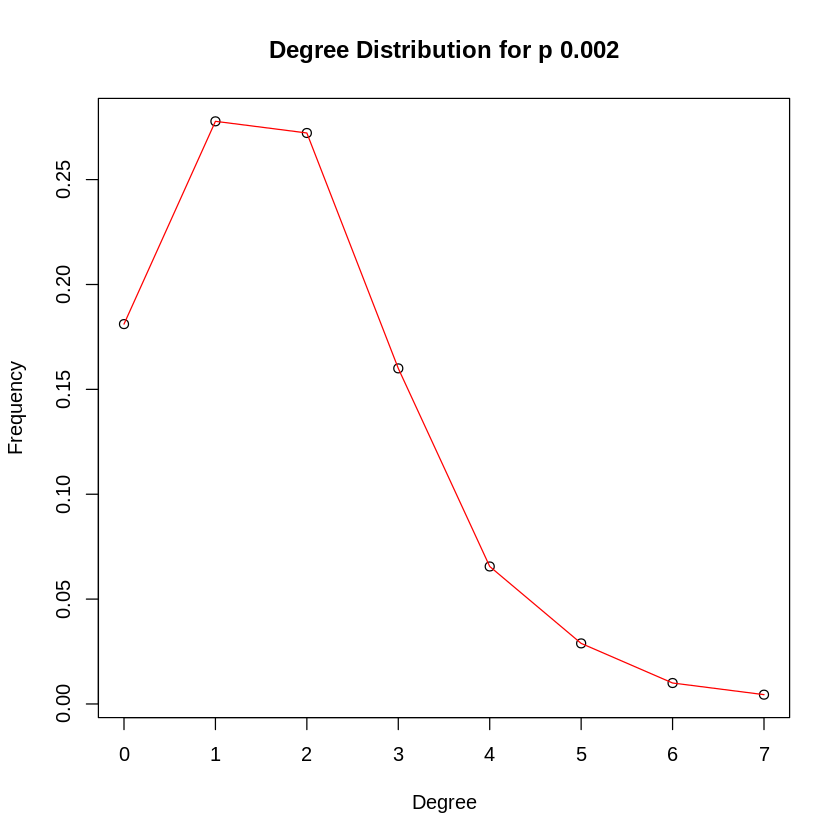

[1] "p is 0.002, mean is 1.800 and variance is 1.918 "


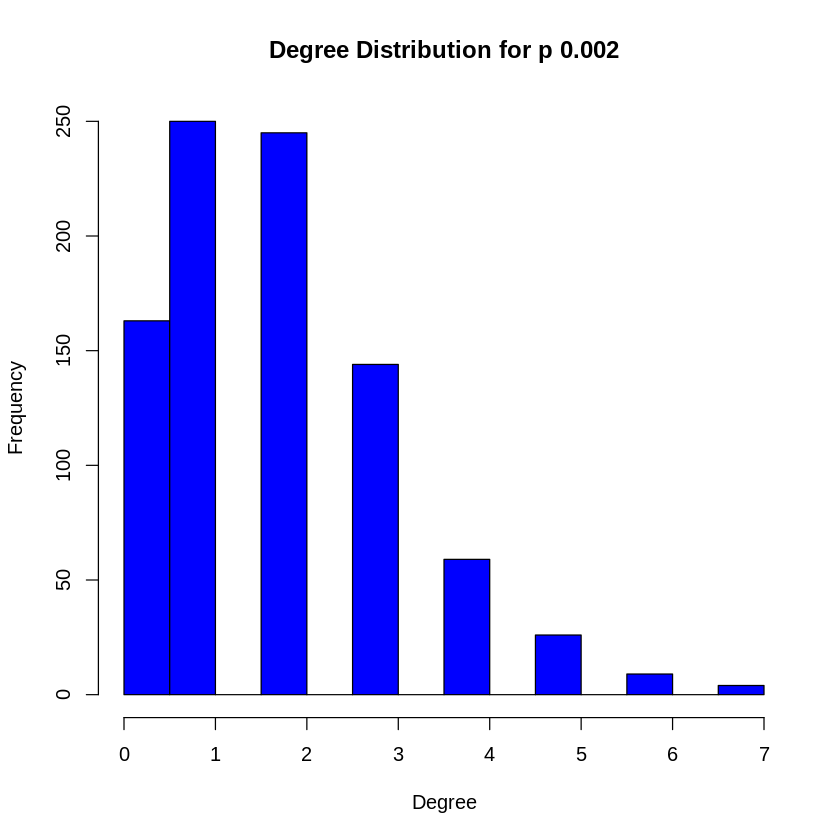

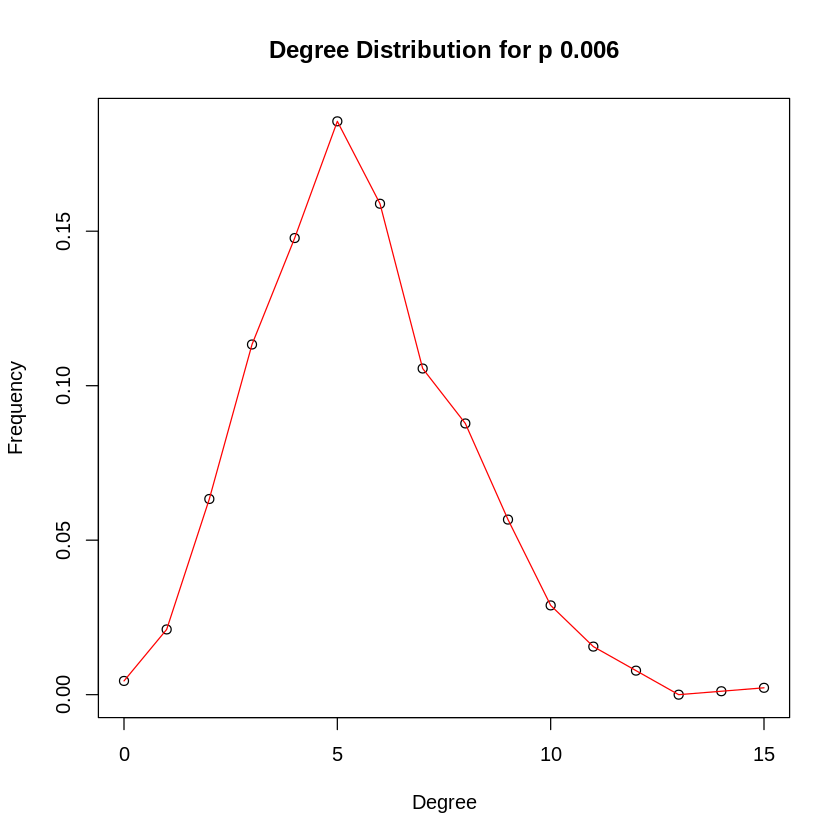

[1] "p is 0.006, mean is 5.513 and variance is 5.616 "


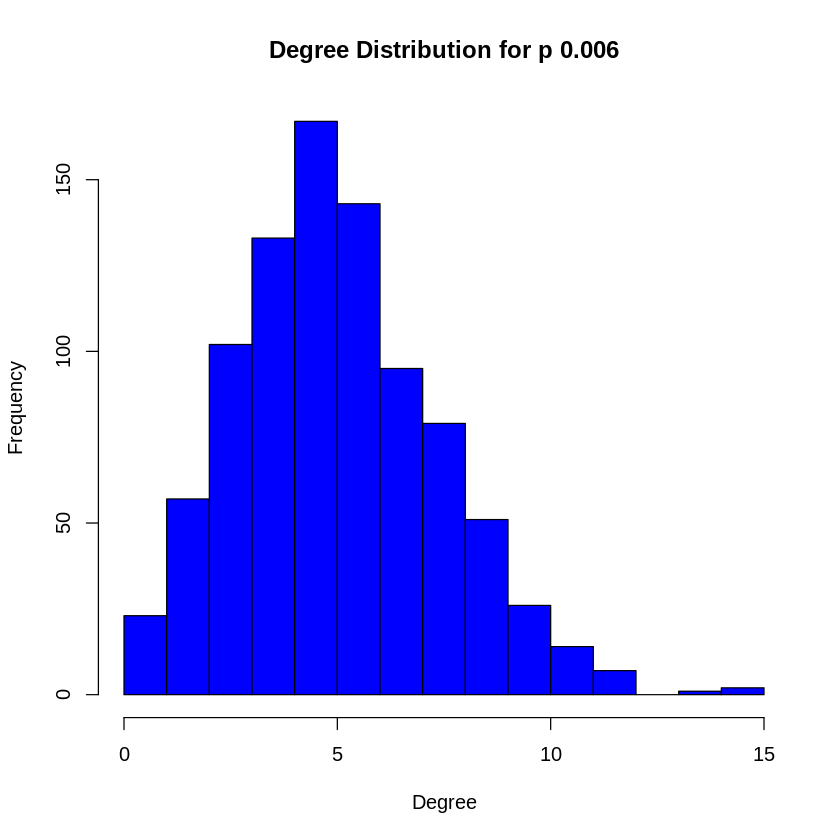

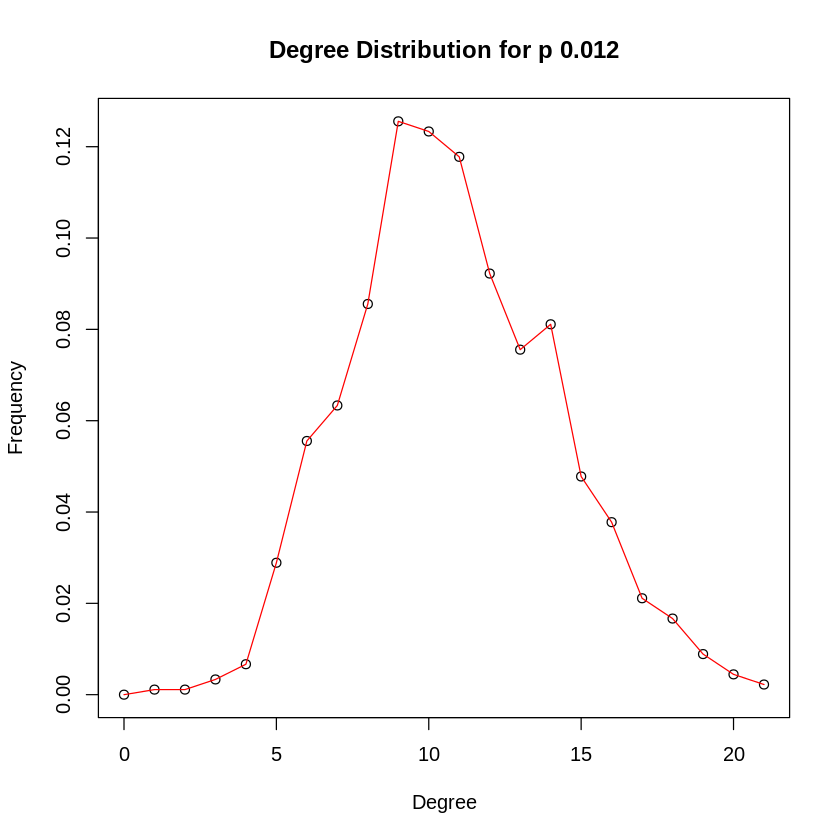

[1] "p is 0.012, mean is 10.813 and variance is 11.118 "


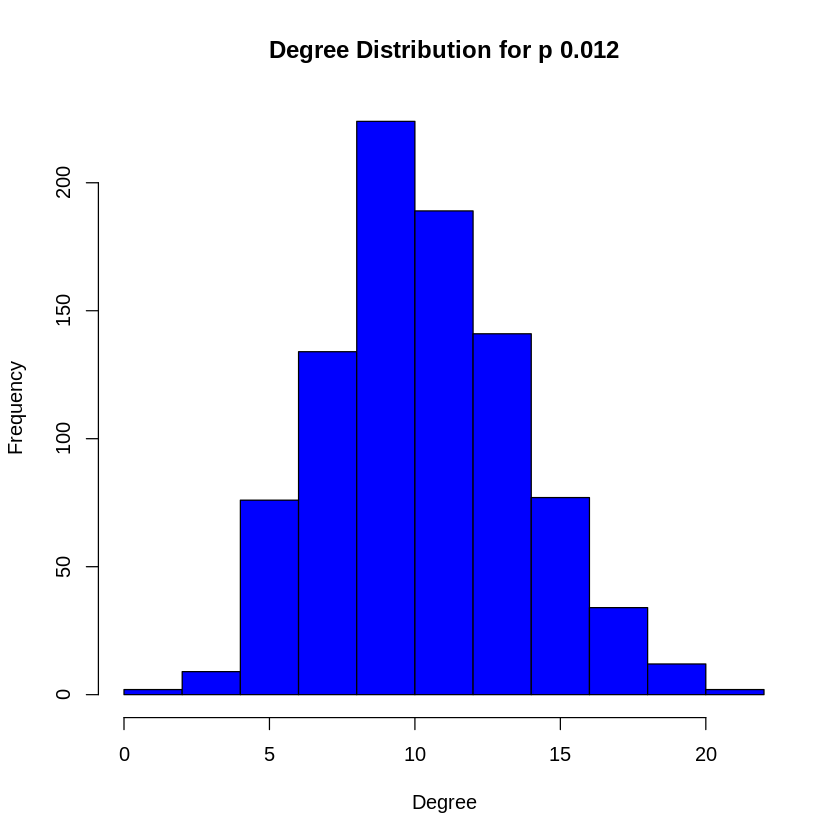

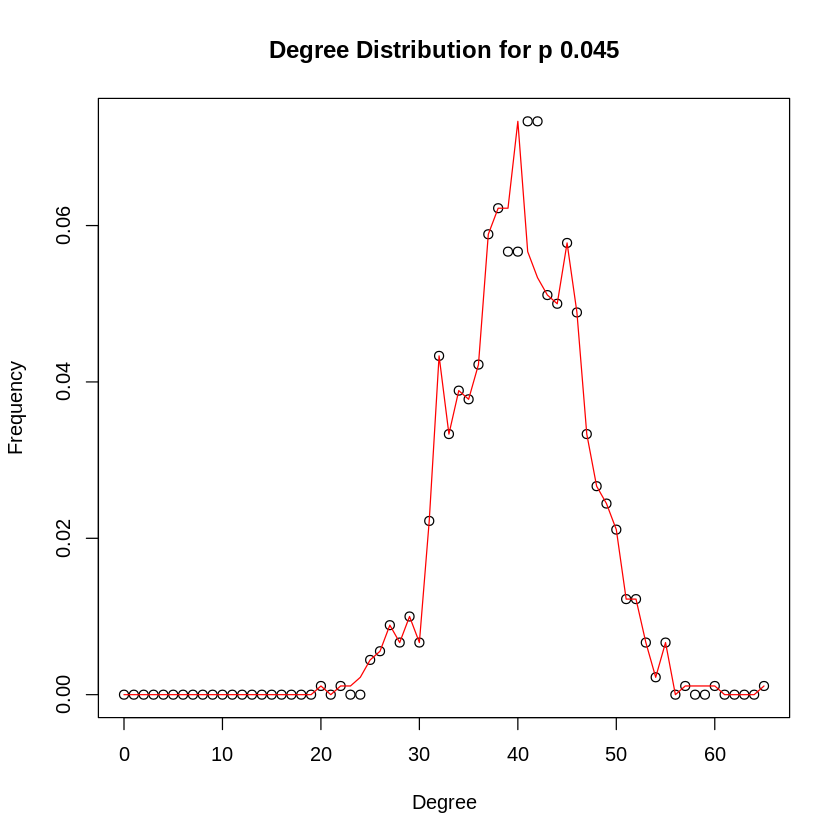

[1] "p is 0.045, mean is 40.313 and variance is 37.261 "


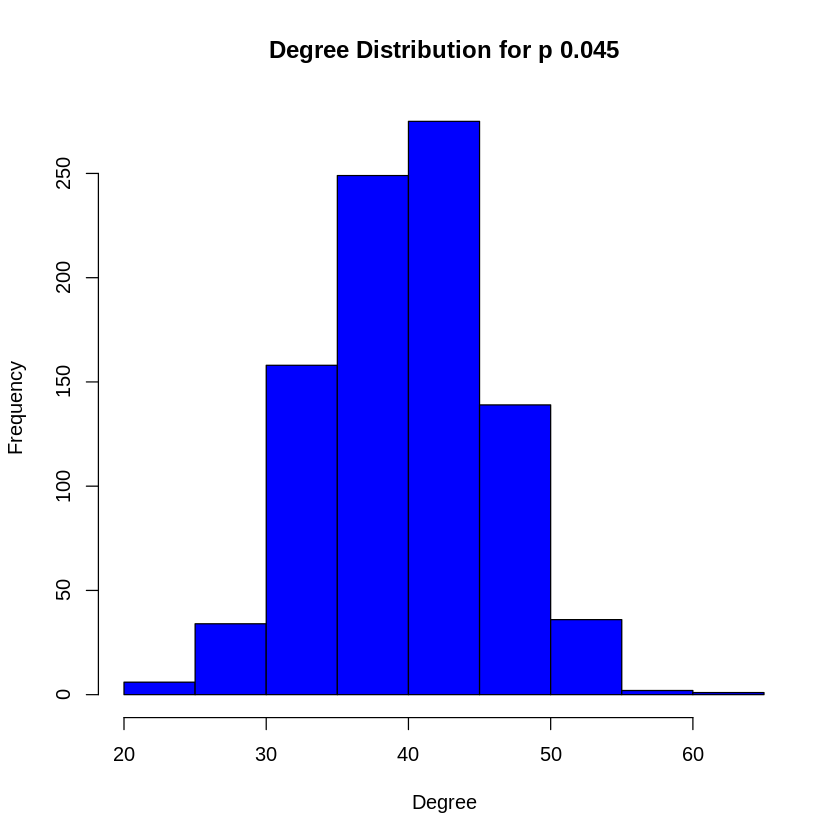

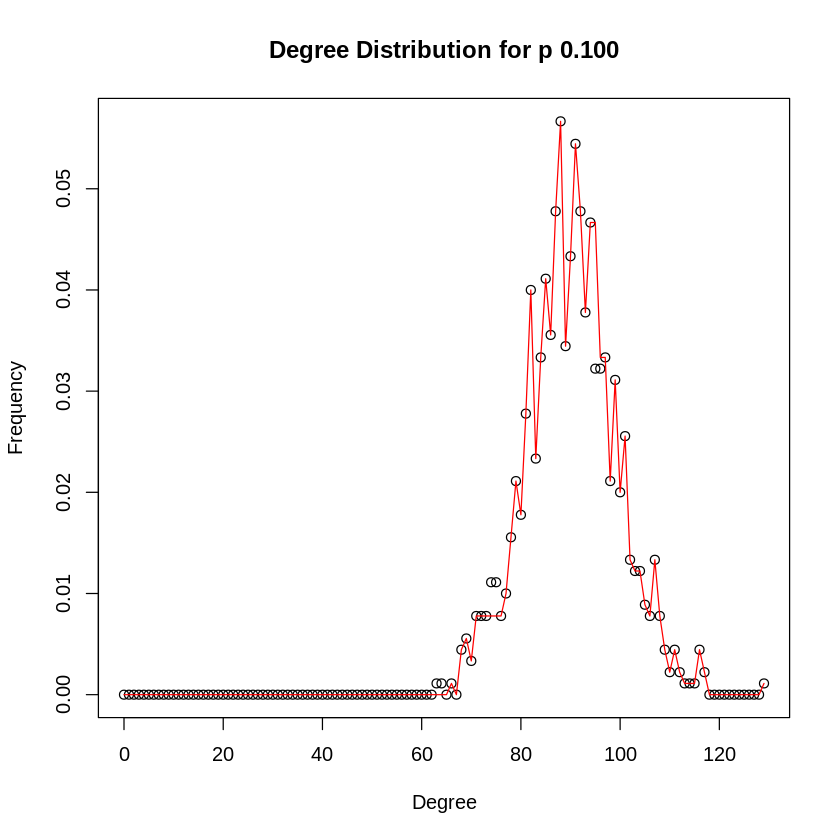

[1] "p is 0.100, mean is 90.113 and variance is 84.770 "


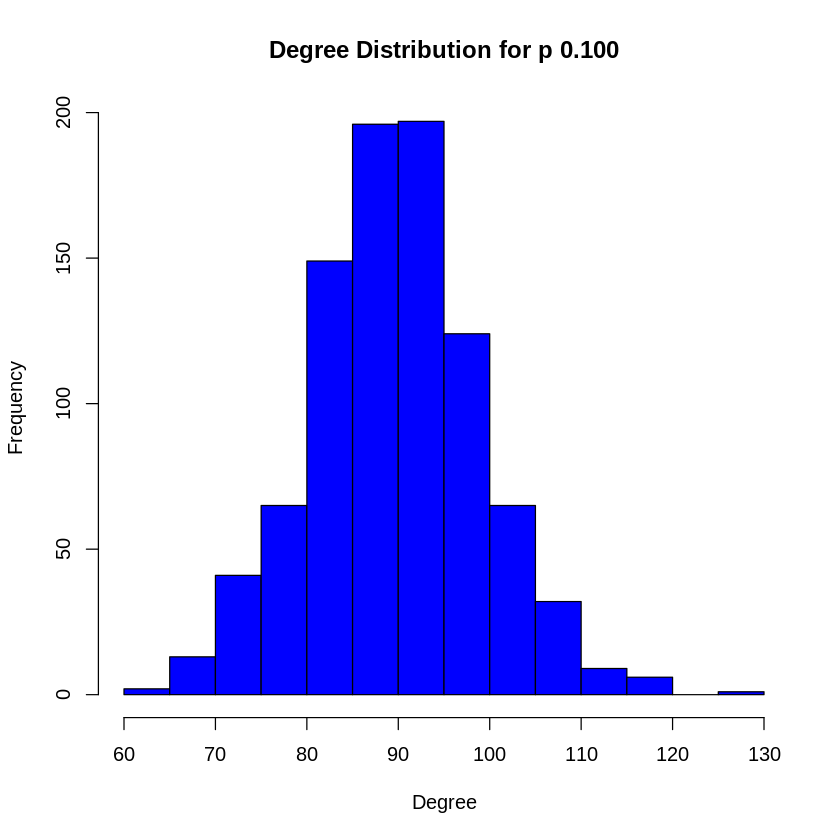

In [4]:
n<- 900
probability_list = list(0.002,0.006,0.012,0.045,0.1)
for(i in probability_list)
{
  g<-sample_gnp(n,i,directed=FALSE)
  plot(seq_along(degree.distribution(g))-1,degree.distribution(g),main=sprintf("Degree Distribution for p %0.3f",i),xlab="Degree",ylab="Frequency")
  lines(seq_along(degree.distribution(g))-1,smooth(degree.distribution(g),kind='S'),col='red',lty=1)
  hist(degree(g),main=sprintf("Degree Distribution for p %0.3f",i),xlab="Degree",ylab="Frequency",col='blue')
  print(sprintf("p is %0.3f, mean is %0.3f and variance is %0.3f ",i,mean(degree(g)),var(degree(g))))
}

**Question 1B** 

In [5]:
n_trials<-100
sample_count = matrix(data=0,nrow=length(probability_list),ncol=n_trials)
done_flag <-1
diameter_data = matrix(data=0,nrow=length(probability_list))
for(i in (1:length(probability_list)))
{
  done_flag=1
  for(j in (1:n_trials))
  {
    g<-sample_gnp(n,probability_list[i],directed=FALSE)
    if(is.connected(g))
    {
      sample_count[i,j]=1
    }
    else
    {
      if(done_flag)
      {
      g_clusters<-clusters(g)
      biggest_cluster_id <- which.max(g_clusters$csize)
      vert_ids <- V(g)[g_clusters$membership == biggest_cluster_id] 
      gcc_graph = induced_subgraph(g, vert_ids)
      diameter_data[i] = diameter(gcc_graph)
      done_flag<-0
      }
    }
  }
}
mean_data = rowSums(sample_count)/n_trials
for(i in 1:length(probability_list))
{
  print("**********************************************************")
  print(sprintf("Probability used for graph is %f",probability_list[i]))
  print(sprintf("Probability of the graph being connected is %f",mean_data[i]*100))
  print(sprintf("Diameter is %d",diameter_data[i]))
}

[1] "**********************************************************"
[1] "Probability used for graph is 0.002000"
[1] "Probability of the graph being connected is 0.000000"
[1] "Diameter is 25"
[1] "**********************************************************"
[1] "Probability used for graph is 0.006000"
[1] "Probability of the graph being connected is 4.000000"
[1] "Diameter is 9"
[1] "**********************************************************"
[1] "Probability used for graph is 0.012000"
[1] "Probability of the graph being connected is 99.000000"
[1] "Diameter is 5"
[1] "**********************************************************"
[1] "Probability used for graph is 0.045000"
[1] "Probability of the graph being connected is 100.000000"
[1] "Diameter is 0"
[1] "**********************************************************"
[1] "Probability used for graph is 0.100000"
[1] "Probability of the graph being connected is 100.000000"
[1] "Diameter is 0"


**Question 1C**

[1] "Emergence of GCC happens at p 0.001200"
[1] "When GCC takes up 99 percent of the network is 0.007600"


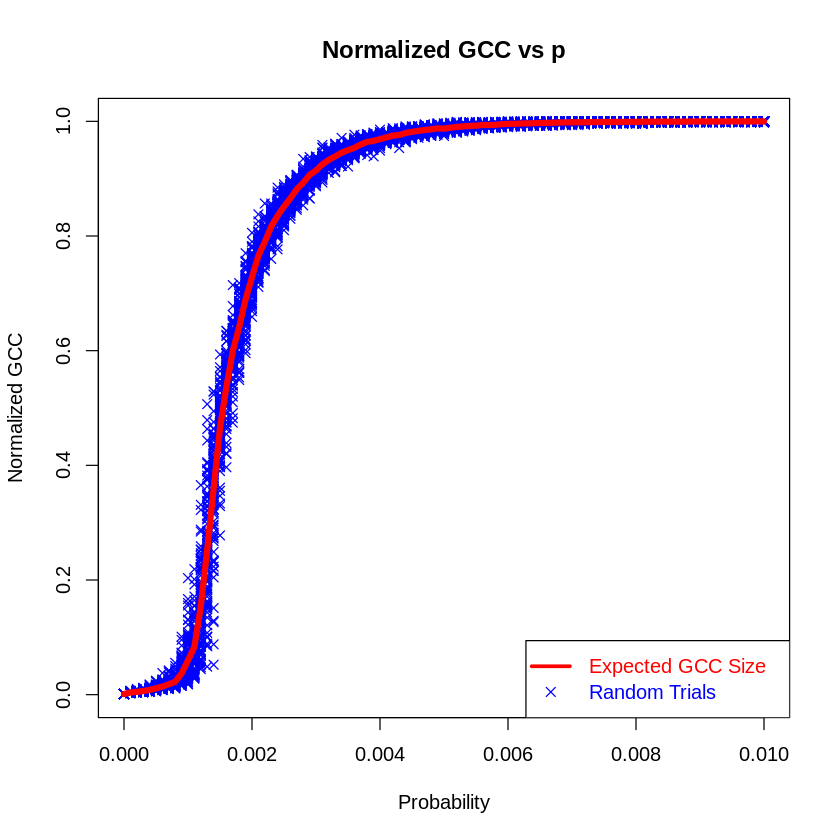

In [6]:

probability_sweep <-seq(0,0.01,0.0001)
gcc_size_matrix = matrix(data=0,nrow=length(probability_sweep),ncol=n_trials)
for(i in 1:length(probability_sweep))
{
  for(j in 1:n_trials)
  {
    g<-sample_gnp(n,probability_sweep[i])
    graph_clusters<-max(clusters(g)$csize)
    gcc_size_matrix[i,j]=graph_clusters/n
  }
}
mean_matrix = rowSums(gcc_size_matrix)/n_trials
plot(rep(probability_sweep[1],n_trials),gcc_size_matrix[1,],xlim=c(0,0.01),ylim=c(0,1),xlab="Probability",ylab="Normalized GCC",main="Normalized GCC vs p",col='blue',pch=4)

for(i in 2:length(probability_sweep))
{
  points(rep(probability_sweep[i],n_trials),gcc_size_matrix[i,],pch=4,col='blue')
}
lines(probability_sweep,mean_matrix,lty=1,lwd=5,col='red')
legend('bottomright', legend = c("Expected GCC Size", "Random Trials"), pch = c(NA, 4), lty = c(1, NA), lwd = c(3,NA), col = c('red','blue'), text.col = c('red','blue'))

print(sprintf("Emergence of GCC happens at p %f",probability_sweep[min(which(mean_matrix>0.1))]))
print(sprintf("When GCC takes up 99 percent of the network is %f",probability_sweep[mean(which(mean_matrix>0.99))]))

**Question 1D**

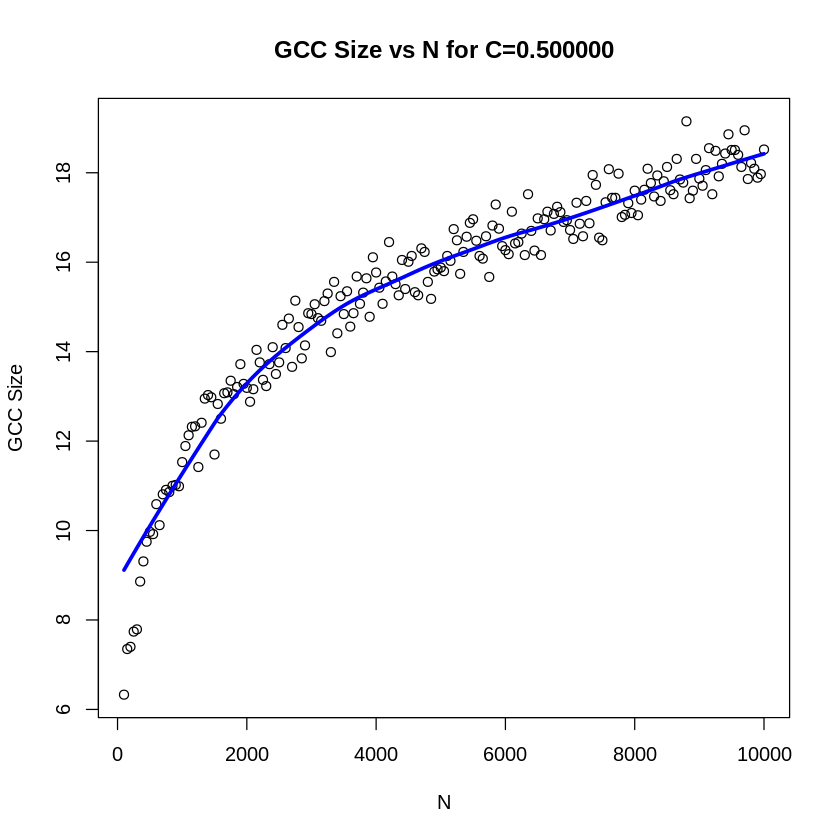

In [7]:
c<-0.5
sweep_n<-seq(100,10000,50)
n_trials=100
get_gcc=function(graph)
{
   graph_clusters<-max(clusters(graph)$csize)
  return(graph_clusters)
}
calc_p=function(c,n)
{
  return (c/n)
}

graph_gcc_count = matrix(data=0,nrow=length(sweep_n),ncol=n_trials)
for(i in 1:length(sweep_n))
{
  for(j in 1:n_trials)
  {
    g<-sample_gnp(sweep_n[i],calc_p(c,sweep_n[i]),directed=FALSE)
    graph_gcc_count[i,j] = get_gcc(g)
  }
}
expected_count = rowSums(graph_gcc_count)/n_trials
plot(sweep_n,expected_count,xlab='N',ylab="GCC Size",main=sprintf("GCC Size vs N for C=%f",c))
lines(lowess(sweep_n,expected_count,f=0.3),col='blue',lty=1,lwd=3)

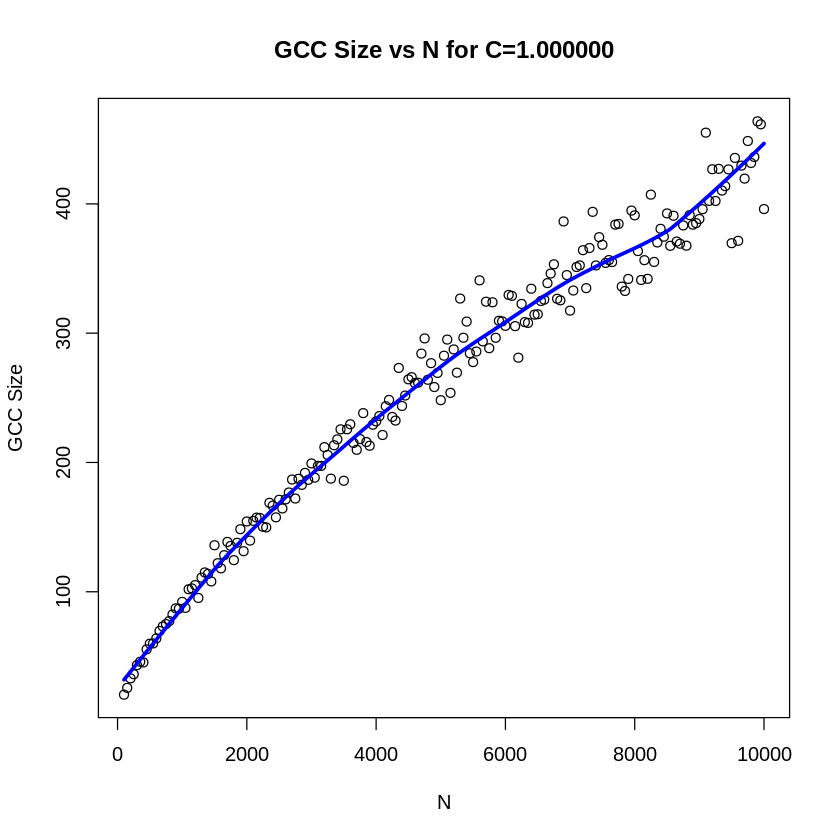

In [8]:
c<-1
sweep_n<-seq(100,10000,50)
n_trials=100
get_gcc=function(graph)
{
   graph_clusters<-max(clusters(graph)$csize)
  return(graph_clusters)
}
calc_p=function(c,n)
{
  return (c/n)
}

graph_gcc_count = matrix(data=0,nrow=length(sweep_n),ncol=n_trials)
for(i in 1:length(sweep_n))
{
  for(j in 1:n_trials)
  {
    g<-sample_gnp(sweep_n[i],calc_p(c,sweep_n[i]),directed=FALSE)
    graph_gcc_count[i,j] = get_gcc(g)
  }
}
expected_count = rowSums(graph_gcc_count)/n_trials
plot(sweep_n,expected_count,xlab='N',ylab="GCC Size",main=sprintf("GCC Size vs N for C=%f",c))
lines(lowess(sweep_n,expected_count,f=0.3),col='blue',lty=1,lwd=3)

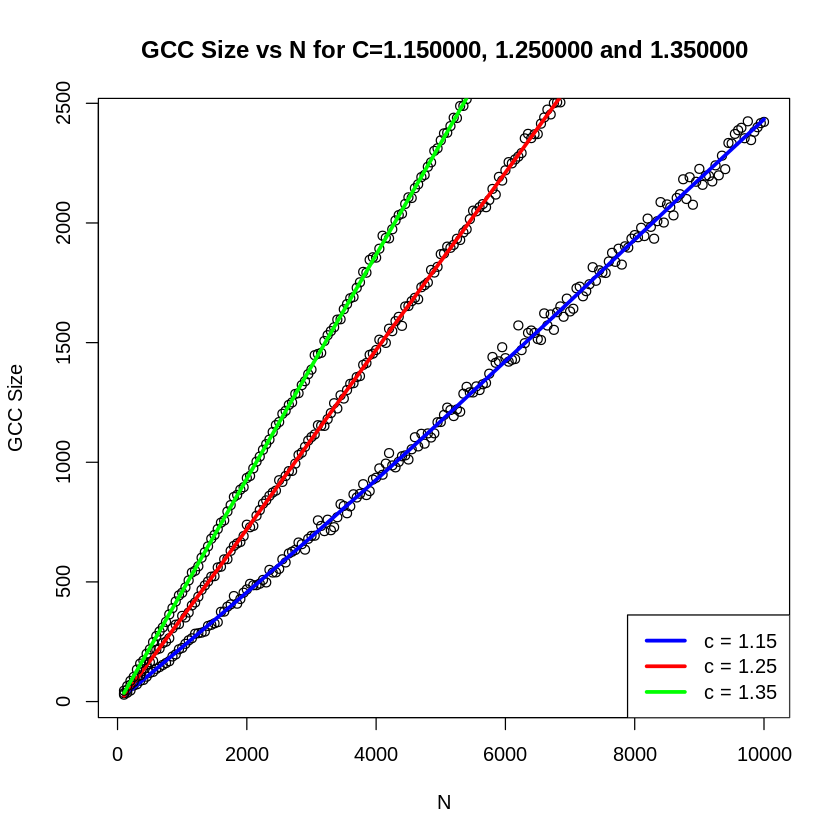

In [9]:

sweep_n<-seq(100,10000,50)
n_trials=100
get_gcc=function(graph)
{
   graph_clusters<-max(clusters(graph)$csize)
  return(graph_clusters)
}
calc_p=function(c,n)
{
  return (c/n)
}

graph_gcc_count_115 = matrix(data=0,nrow=length(sweep_n),ncol=n_trials)
graph_gcc_count_125 = matrix(data=0,nrow=length(sweep_n),ncol=n_trials)
graph_gcc_count_135 = matrix(data=0,nrow=length(sweep_n),ncol=n_trials)
for(i in 1:length(sweep_n))
{
  for(j in 1:n_trials)
  {
    g<-sample_gnp(sweep_n[i],calc_p(1.15,sweep_n[i]),directed=FALSE)
    graph_gcc_count_115[i,j] = get_gcc(g)
    g<-sample_gnp(sweep_n[i],calc_p(1.25,sweep_n[i]),directed=FALSE)
    graph_gcc_count_125[i,j] = get_gcc(g)
    g<-sample_gnp(sweep_n[i],calc_p(1.35,sweep_n[i]),directed=FALSE)
    graph_gcc_count_135[i,j] = get_gcc(g)
  }
}
expected_count_115 = rowSums(graph_gcc_count_115)/n_trials
expected_count_125 = rowSums(graph_gcc_count_125)/n_trials
expected_count_135 = rowSums(graph_gcc_count_135)/n_trials
plot(sweep_n,expected_count_115,xlab='N',ylab="GCC Size",main=sprintf("GCC Size vs N for C=%f, %f and %f",1.15,1.25,1.35))
lines(lowess(sweep_n,expected_count_115,f=0.3),col='blue',lty=1,lwd=3)
points(sweep_n,expected_count_125,xlab='N',ylab="GCC Size")
lines(lowess(sweep_n,expected_count_125,f=0.3),col='red',lty=1,lwd=3)
points(sweep_n,expected_count_135,xlab='N',ylab="GCC Size")
lines(lowess(sweep_n,expected_count_135,f=0.3),col='green',lty=1,lwd=3)
legend('bottomright', legend = c("c = 1.15", "c = 1.25", "c = 1.35"),lty = c(1, 1, 1), lwd = c(3,3,3),col = c('blue','red','green'))

**Question 2 (a)**

[1] "The probability of the graph being connected is 100.000000"


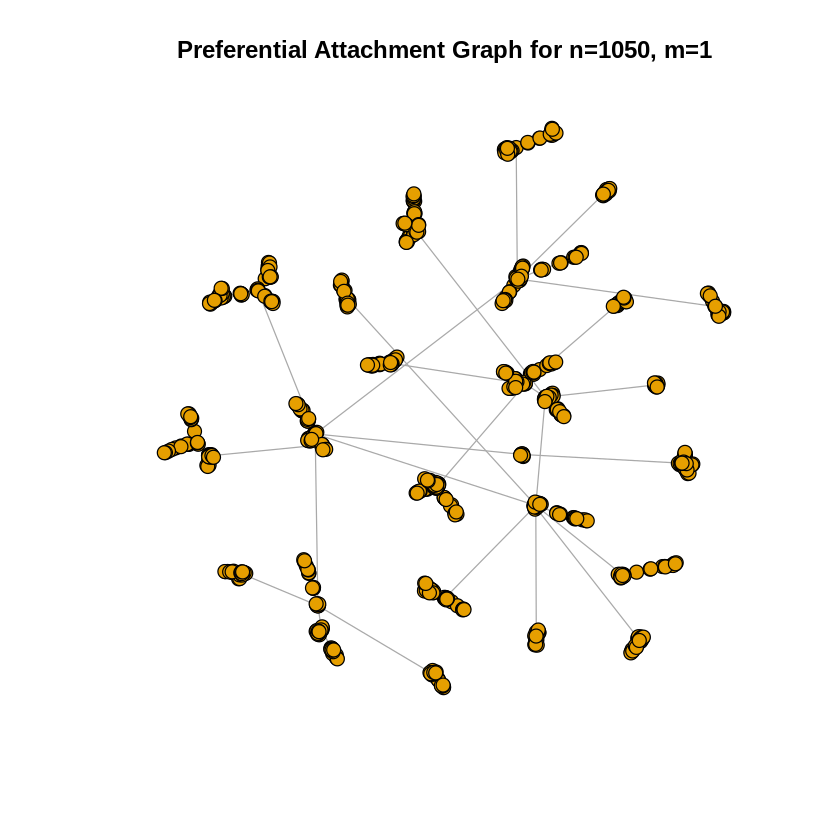

In [10]:
n<-1050
m<-1
connected_val = matrix(data=0,nrow=n_trials)
for(i in 1:n_trials)
{
  graph<-barabasi.game(n,m=m,,directed=FALSE)
  if(is.connected(graph))
  {
    connected_val[i]=1
  }
}


  
# plotting the points in plot window
print(sprintf("The probability of the graph being connected is %f",sum(connected_val)*100/n_trials))

plot(graph,vertex.label="",vertex.size=5)
title(main ="Preferential Attachment Graph for n=1050, m=1")

**Question 2B**

[1] "The modularity of the Perferential Network Attachment Graph is 0.935065"
[1] "The assortativity of the Preferential Network Attachment Graph is -0.121060"


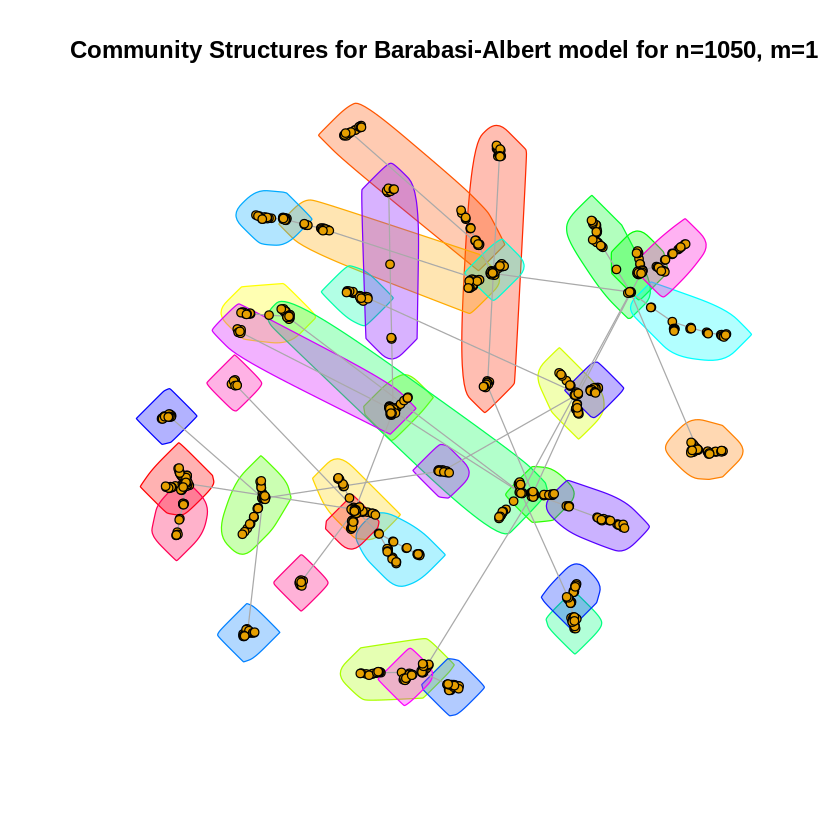

In [11]:
graph<-barabasi.game(n,m=m,directed=FALSE)
community_structure = cluster_fast_greedy(graph)
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title(main ="Community Structures for Barabasi-Albert model for n=1050, m=1")
print(sprintf("The modularity of the Perferential Network Attachment Graph is %f",modularity(community_structure)))
print(sprintf("The assortativity of the Preferential Network Attachment Graph is %f",assortativity_degree(graph,directed=FALSE)))

**Question 2C**

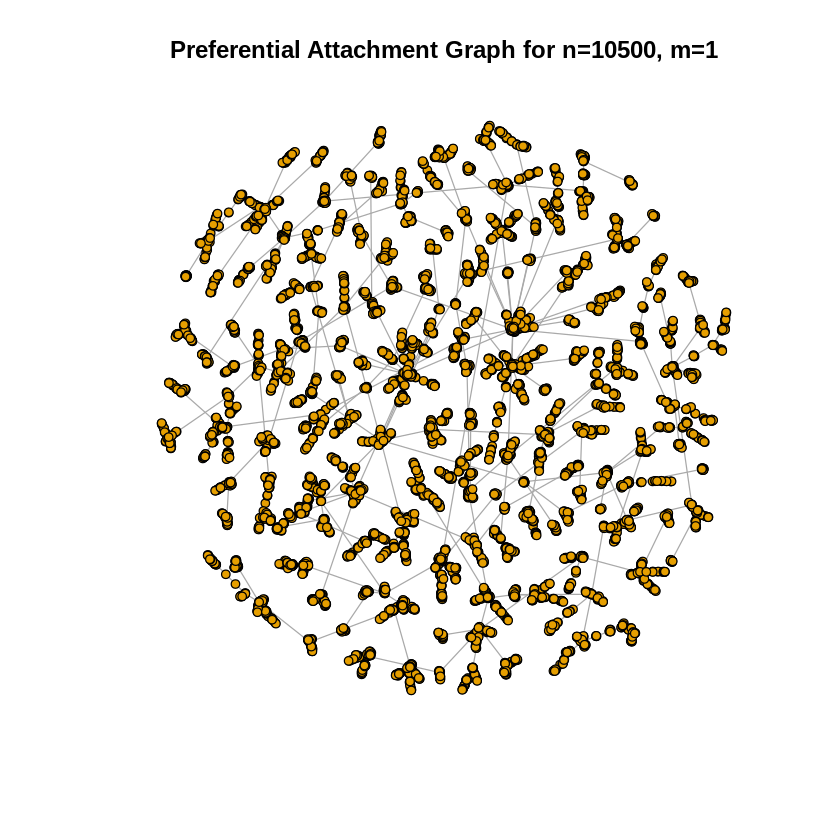

[1] "The modularity of the Perferential Network Attachment Graph is 0.978955"
[1] "The assortativity of the Preferential Network Attachment Graph is -0.033181"


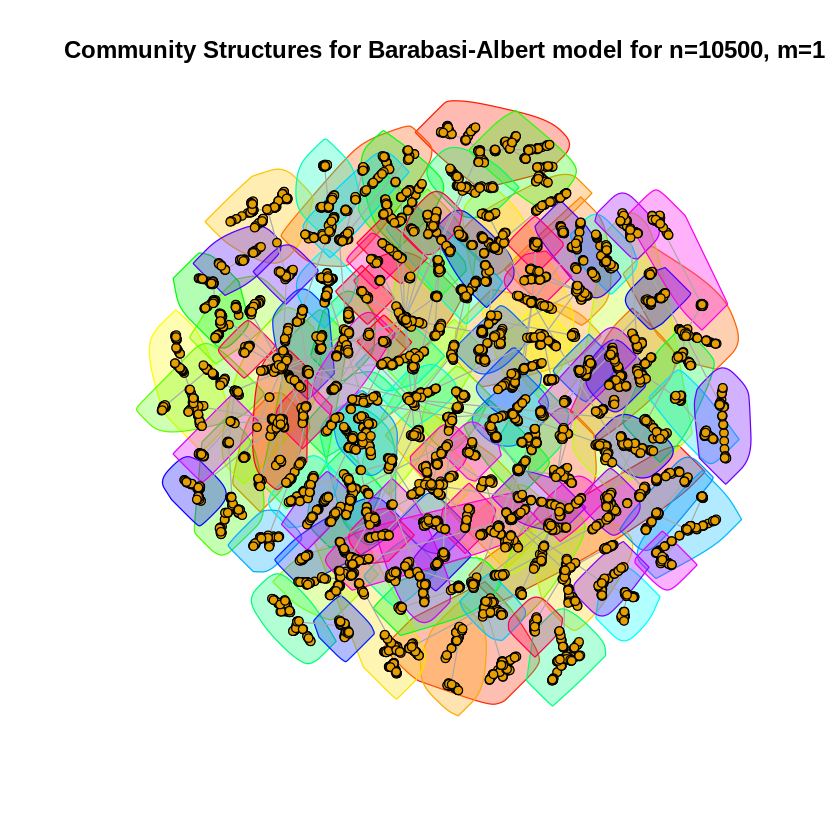

In [12]:
graph<-barabasi.game(10500,m=m,,directed=FALSE)
community_structure = cluster_fast_greedy(graph)

plot(graph,vertex.label="",vertex.size=3)
title(main ="Preferential Attachment Graph for n=10500, m=1")
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title(main ="Community Structures for Barabasi-Albert model for n=10500, m=1")
print(sprintf("The modularity of the Perferential Network Attachment Graph is %f",modularity(community_structure)))
print(sprintf("The assortativity of the Preferential Network Attachment Graph is %f",assortativity_degree(graph,directed=FALSE)))

**Question 2D**

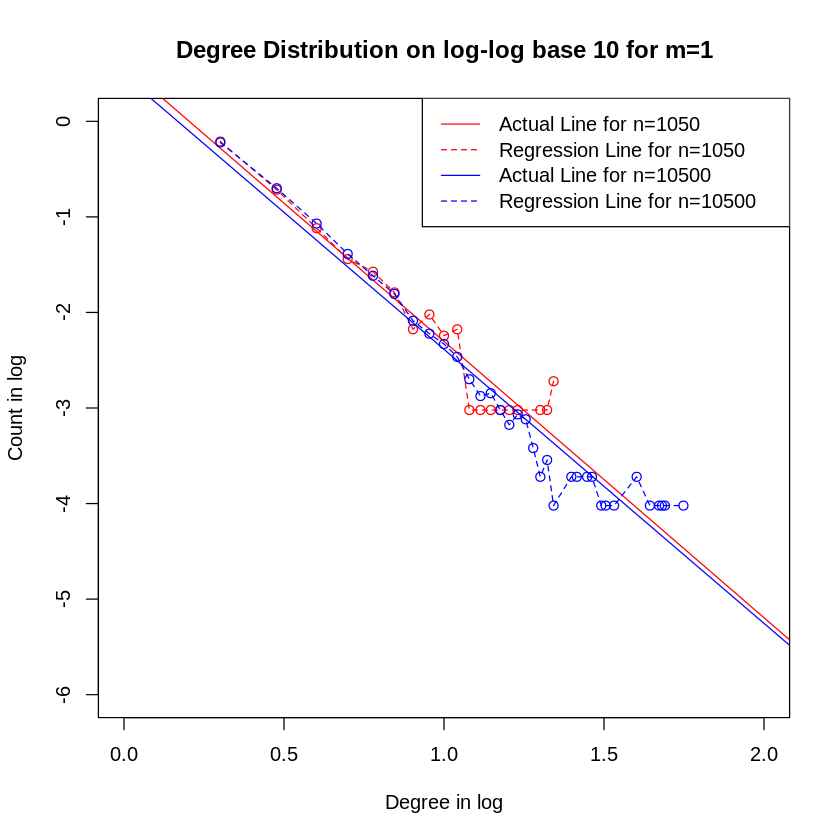

In [13]:
graph_1050 <- barabasi.game(1050,m=m,,directed=FALSE)
graph_10500 <- barabasi.game(10500,m=m,directed=FALSE)

degree_1050 <- degree.distribution(graph_1050)
degree_10500 <-degree.distribution(graph_10500)

degree_1050_for_log <-log10(degree_1050)[which(degree_1050!=0,arr.ind=TRUE)]
degree_10500_for_log <-log10(degree_10500)[which(degree_10500!=0,arr.ind=TRUE)]
x_axis_for_1050 <-c(1:length(degree_1050))[which(degree_1050!=0,arr.ind = TRUE)]
x_axis_for_10500 <-c(1:length(degree_10500))[which(degree_10500!=0,arr.ind = TRUE)]

plot(log10(x_axis_for_1050),degree_1050_for_log,ylim=c(-6,0),xlim=c(0,2),xlab="Degree in log",ylab="Count in log",main="Degree Distribution on log-log base 10 for m=1",col='red',lwd=1)
abline(lm(degree_1050_for_log~log10(x_axis_for_1050)),col='red',lty=1,lwd=1)
lines(log10(x_axis_for_1050),degree_1050_for_log,lty=2,lwd=1,col='red')

points(log10(x_axis_for_10500),degree_10500_for_log,col='blue',lwd=1)
abline(lm(degree_10500_for_log~log10(x_axis_for_10500)),col='blue',lty=1,lwd=1)
lines(log10(x_axis_for_10500),degree_10500_for_log,lty=2,lwd=1,col='blue')
legend('topright', legend = c("Actual Line for n=1050","Regression Line for n=1050","Actual Line for n=10500","Regression Line for n=10500"),lty = c(1, 2,1, 2), lwd = c(1,1,1,1),col = c('red','red','blue','blue'))

In [14]:
model_1050<-lm(degree_1050_for_log~log10(x_axis_for_1050))
model_10500<-lm(degree_10500_for_log~log10(x_axis_for_10500))

print(model_1050)

print(model_10500)


Call:
lm(formula = degree_1050_for_log ~ log10(x_axis_for_1050))

Coefficients:
           (Intercept)  log10(x_axis_for_1050)  
                0.5891                 -2.8921  


Call:
lm(formula = degree_10500_for_log ~ log10(x_axis_for_10500))

Coefficients:
            (Intercept)  log10(x_axis_for_10500)  
                 0.4814                  -2.8678  



**Question 2e**

In [15]:
n_trials<-1050
degree_distribution_1050 = matrix(data=0,nrow=n_trials)
degree_distribution_10500 = matrix(data=0,nrow=n_trials)
for(i in 1:n_trials)
{
  graph_1050 <- barabasi.game(1050,m=m,,directed=FALSE)
  random_starting_node_1050 = sample(vcount(graph_1050),1)
  neighbours_1050 = sample(neighbors(graph_1050,random_starting_node_1050),1)
  degree_distribution_1050[i] = degree(graph_1050,neighbours_1050)
 
}
n_trials<-10500
for(i in 1:n_trials)
{
  graph_10500 <- barabasi.game(10500,m=m,directed=FALSE)
  random_starting_node_10500 = sample(vcount(graph_10500),1)
  neighbours_10500 = sample(neighbors(graph_10500,random_starting_node_10500),1)
  degree_distribution_10500[i] = degree(graph_10500,neighbours_10500)
}

frequency_table_1050 <-table(degree_distribution_1050)
frequency_table_10500 <-table(degree_distribution_10500)

log_frequencies <-log10(as.vector(frequency_table_1050)/1050)
x_axis_for_1050 <-log10(as.numeric(names(frequency_table_1050))) 

log_frequencies_10500 <-log10(as.vector(frequency_table_10500)/10500)
x_axis_for_10500 <-log10(as.numeric(names(frequency_table_10500))) 



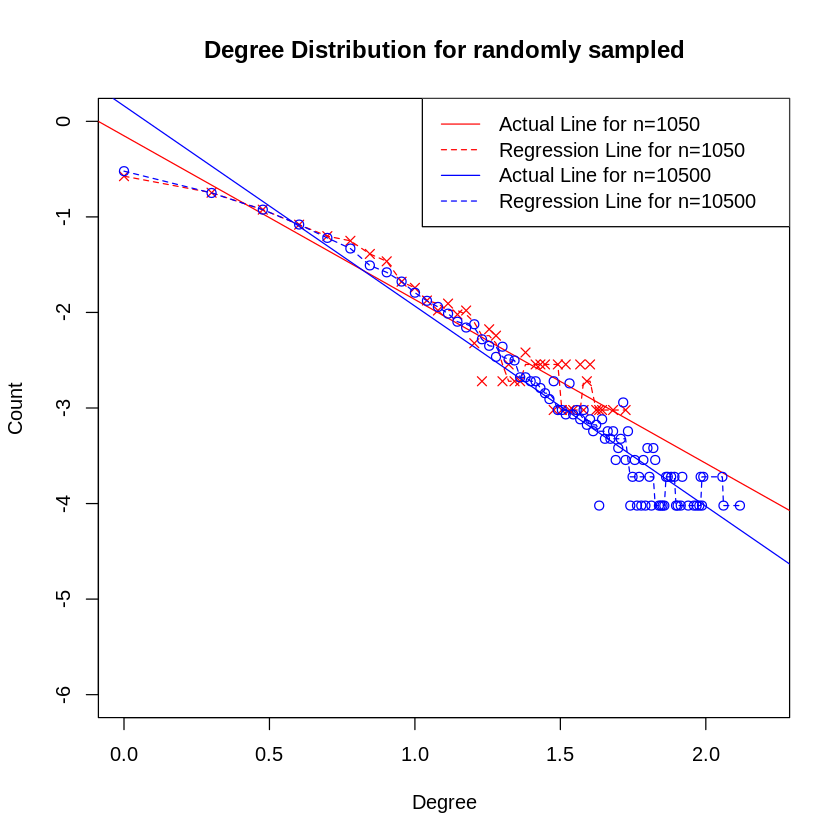

In [16]:
plot(x_axis_for_1050,log_frequencies,xlab="Degree",ylab="Count",main="Degree Distribution for randomly sampled",col='red',pch=4,lwd=1,ylim=c(-6,0),xlim=c(0,2.2))
abline(lm(log_frequencies~x_axis_for_1050),col='red',lty=1,lwd=1)
lines(x_axis_for_1050,smooth(log_frequencies,kind='3RSR'),lty=2,lwd=1,col='red')

points(x_axis_for_10500,log_frequencies_10500,col='blue',lwd=1)
abline(lm(log_frequencies_10500~x_axis_for_10500),col='blue',lty=1,lwd=1)
lines(x_axis_for_10500,smooth(log_frequencies_10500,kind='3RSR'),lty=2,lwd=1,col='blue')
legend('topright', legend = c("Actual Line for n=1050","Regression Line for n=1050","Actual Line for n=10500","Regression Line for n=10500"),lty = c(1, 2,1, 2), lwd = c(1,1,1,1),col = c('red','red','blue','blue'))

In [17]:
model_1050<-lm(log_frequencies~x_axis_for_1050)
model_10500<-lm(log_frequencies_10500~x_axis_for_10500)

print(model_1050)

print(model_10500)


Call:
lm(formula = log_frequencies ~ x_axis_for_1050)

Coefficients:
    (Intercept)  x_axis_for_1050  
        -0.1516          -1.7138  


Call:
lm(formula = log_frequencies_10500 ~ x_axis_for_10500)

Coefficients:
     (Intercept)  x_axis_for_10500  
          0.1616           -2.0954  



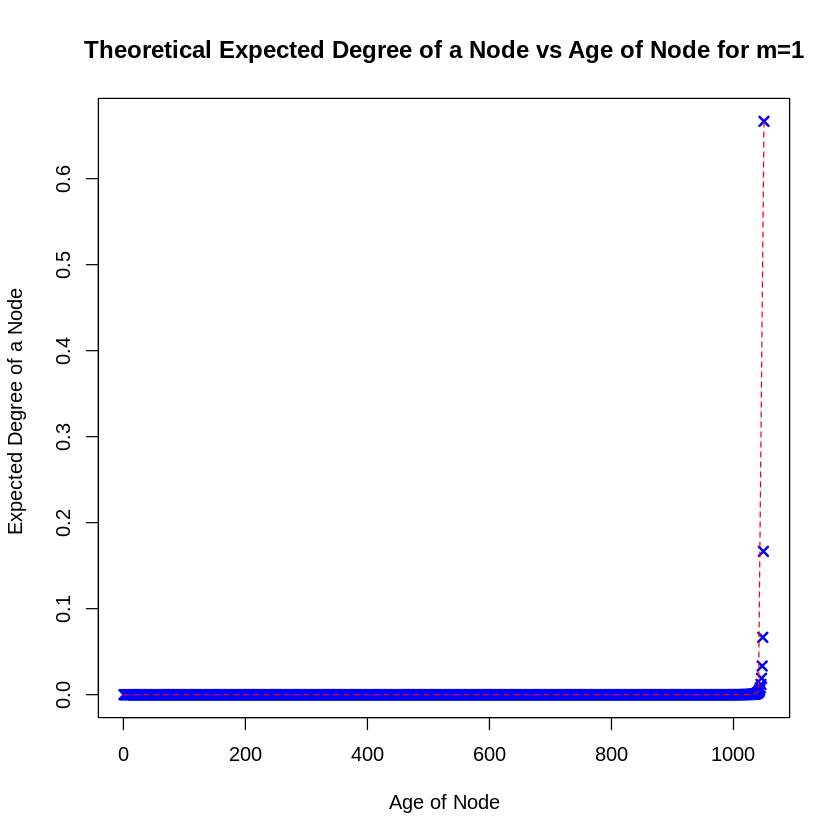

In [18]:
x_axis = c(1050:1)
calculate_degree = function(i,m)
{
  return(2*m*(m+1)/((i)*(i+1)*(i+2)))
}
results = matrix(data=0,nrow=1050,ncol=1)
for(i in x_axis)
{
  results[i]=calculate_degree(i,1)
}


plot(x_axis,results,col='blue',lwd=2,pch=4,xlab='Age of Node',ylab='Expected Degree of a Node ',main="Theoretical Expected Degree of a Node vs Age of Node for m=1")
lines(lowess(x_axis,results,f=0.2),col='red',lty=2,lwd=1)

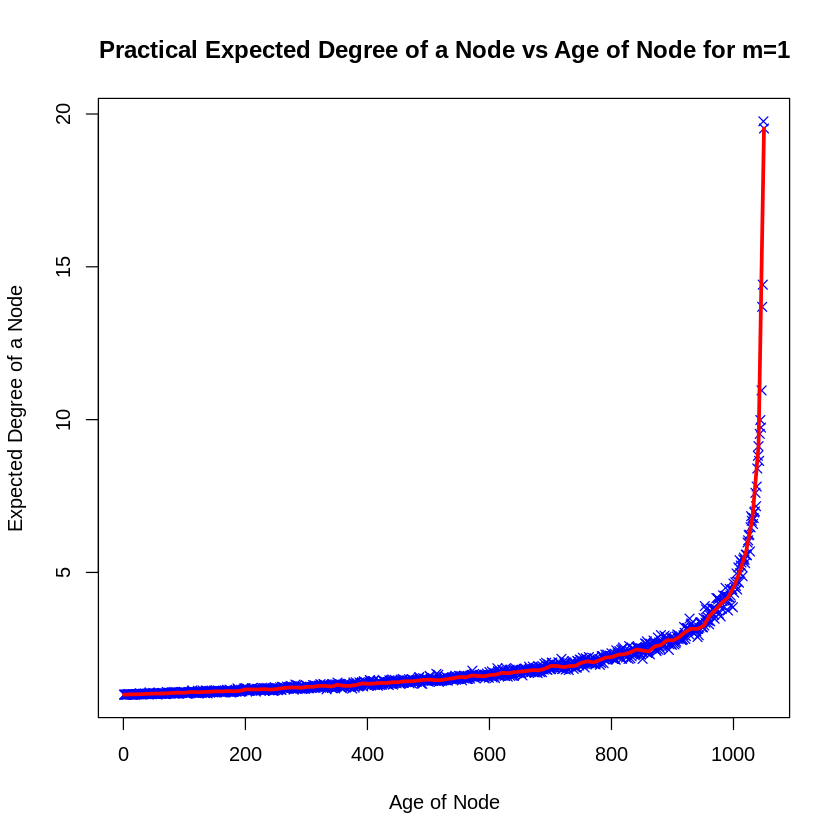

In [19]:
expected_degree = matrix(data=0,nrow=1050)
n_trials<-200
for(i in 1:n_trials)
{
  graph <-barabasi.game(n=1050,m=1,directed=FALSE)
  expected_degree<-expected_degree+degree(graph)
}
expected_degree<-expected_degree/n_trials
plot(c(1050:1),expected_degree,xlab='Age of Node',ylab='Expected Degree of a Node',main="Practical Expected Degree of a Node vs Age of Node for m=1",col='blue',pch=4,lwd=1)
lines(lowess(c(1050:1),expected_degree,f=0.01),col='red',lty=1,lwd=3)

**Question 2G** For m=2

[1] "The probability of the graph being connected is 100.000000"


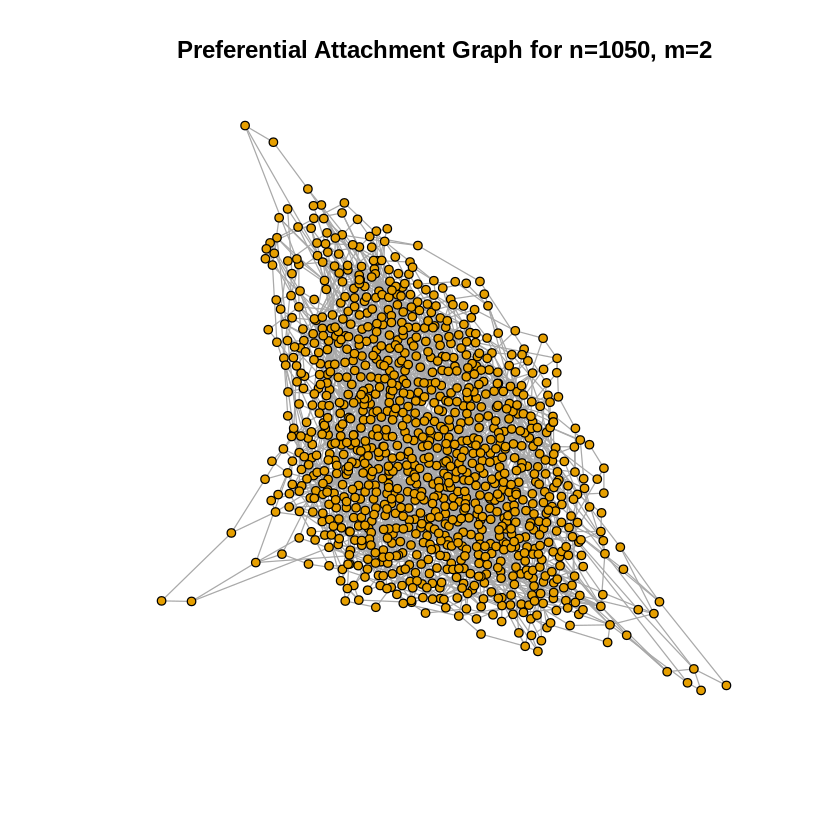

In [20]:
n<-1050
m<-2
connected_val = matrix(data=0,nrow=n_trials)
for(i in 1:n_trials)
{
  graph<-barabasi.game(n,m=m,,directed=FALSE)
  if(is.connected(graph))
  {
    connected_val[i]=1
  }
}


  
# plotting the points in plot window
print(sprintf("The probability of the graph being connected is %f",sum(connected_val)*100/n_trials))

plot(graph,vertex.label="",vertex.size=3)
title(main ="Preferential Attachment Graph for n=1050, m=2")

[1] "The modularity of the Perferential Network Attachment Graph is 0.525378"
[1] "The assortativity of the Preferential Network Attachment Graph is -0.061935"


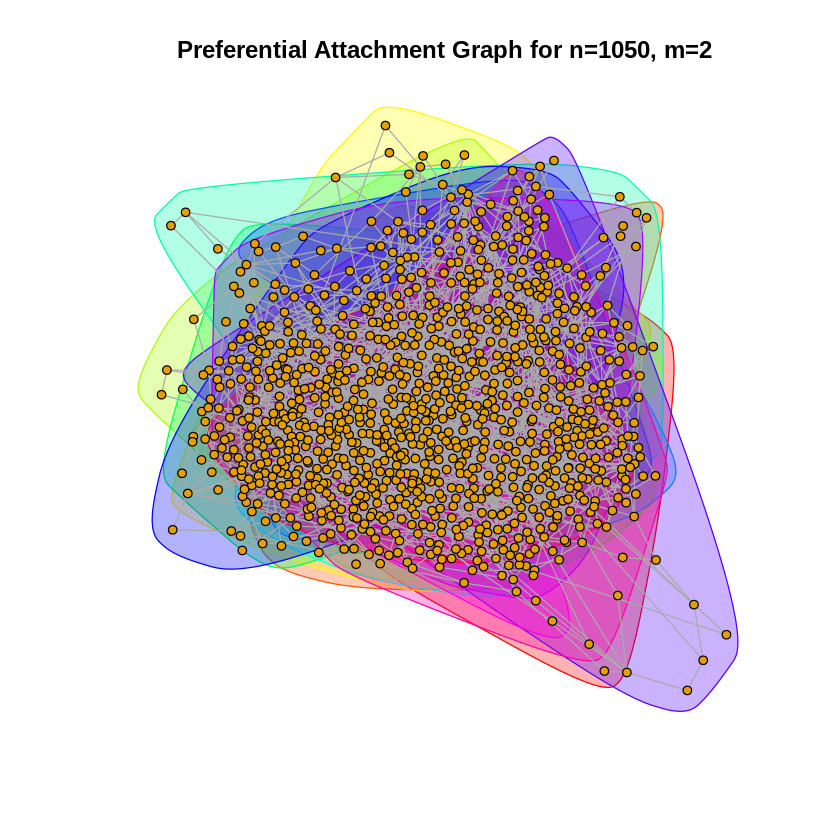

In [21]:
graph<-barabasi.game(n,m=m,,directed=FALSE)
community_structure = cluster_fast_greedy(graph)
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title(main ="Preferential Attachment Graph for n=1050, m=2")
print(sprintf("The modularity of the Perferential Network Attachment Graph is %f",modularity(community_structure)))
print(sprintf("The assortativity of the Preferential Network Attachment Graph is %f",assortativity_degree(graph,directed=FALSE)))

[1] "The modularity of the Perferential Network Attachment Graph is 0.528976"
[1] "The assortativity of the Preferential Network Attachment Graph is -0.009399"


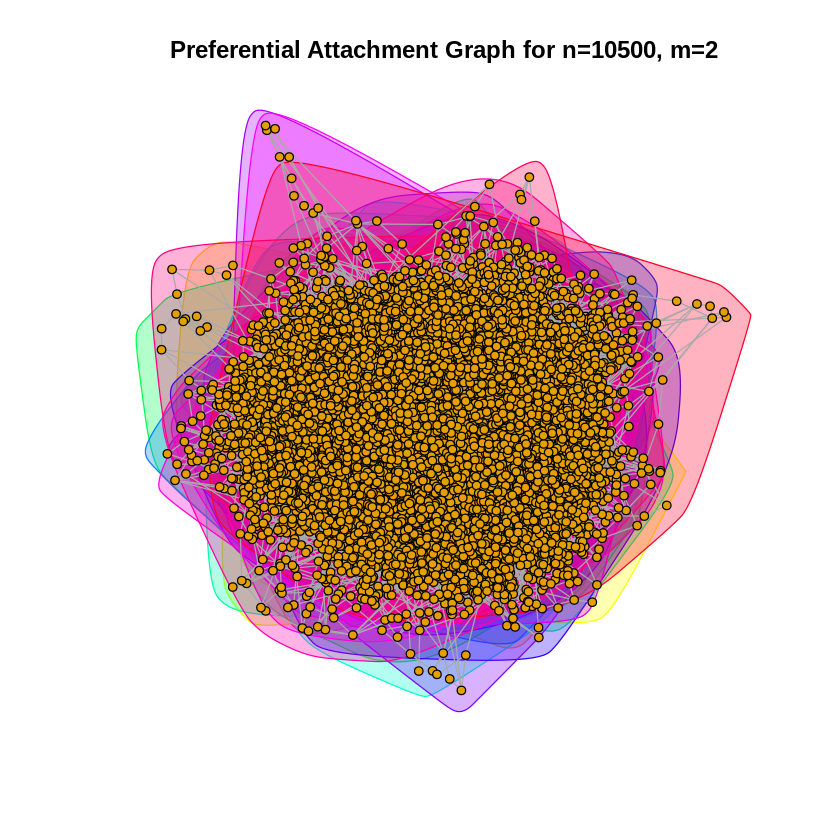

In [22]:
graph<-barabasi.game(10500,m=m,,directed=FALSE)
community_structure = cluster_fast_greedy(graph)
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title(main ="Preferential Attachment Graph for n=10500, m=2")
print(sprintf("The modularity of the Perferential Network Attachment Graph is %f",modularity(community_structure)))
print(sprintf("The assortativity of the Preferential Network Attachment Graph is %f",assortativity_degree(graph,directed=FALSE)))

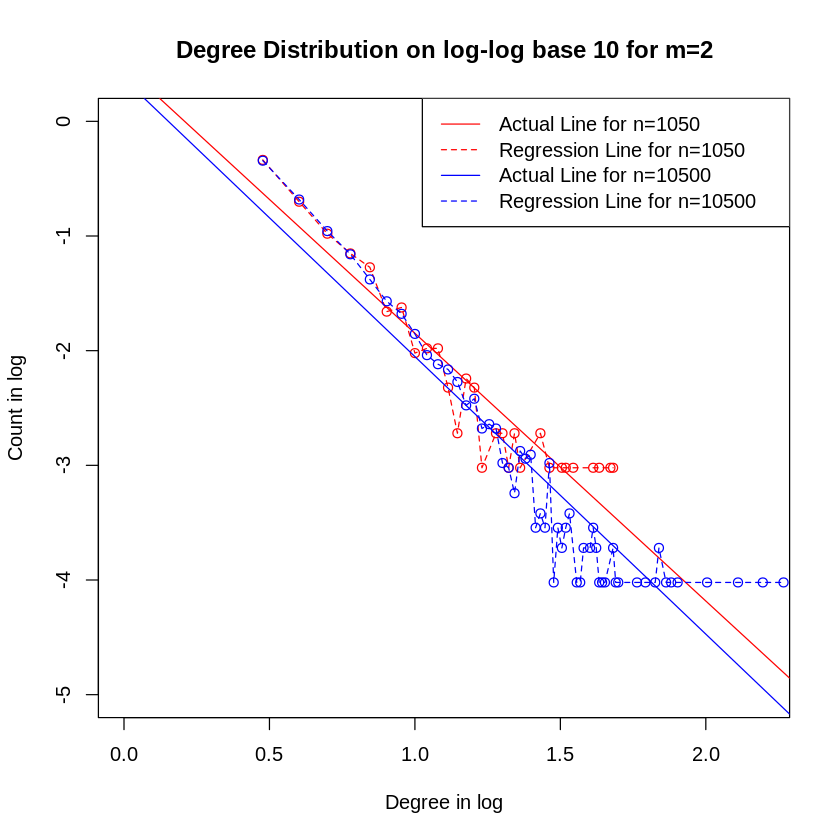

In [23]:
graph_1050 <- barabasi.game(1050,m=m,,directed=FALSE)
graph_10500 <- barabasi.game(10500,m=m,directed=FALSE)

degree_1050 <- degree.distribution(graph_1050)
degree_10500 <-degree.distribution(graph_10500)

degree_1050_for_log <-log10(degree_1050)[which(degree_1050!=0,arr.ind=TRUE)]
degree_10500_for_log <-log10(degree_10500)[which(degree_10500!=0,arr.ind=TRUE)]
x_axis_for_1050 <-c(1:length(degree_1050))[which(degree_1050!=0,arr.ind = TRUE)]
x_axis_for_10500 <-c(1:length(degree_10500))[which(degree_10500!=0,arr.ind = TRUE)]

plot(log10(x_axis_for_1050),degree_1050_for_log,ylim=c(-5,0),xlim=c(0,2.2),xlab="Degree in log",ylab="Count in log",main="Degree Distribution on log-log base 10 for m=2",col='red',lwd=1)
abline(lm(degree_1050_for_log~log10(x_axis_for_1050)),col='red',lty=1,lwd=1)
lines(log10(x_axis_for_1050),degree_1050_for_log,lty=2,lwd=1,col='red')

points(log10(x_axis_for_10500),degree_10500_for_log,col='blue',lwd=1)
abline(lm(degree_10500_for_log~log10(x_axis_for_10500)),col='blue',lty=1,lwd=1)
lines(log10(x_axis_for_10500),degree_10500_for_log,lty=2,lwd=1,col='blue')
legend('topright', legend = c("Actual Line for n=1050","Regression Line for n=1050","Actual Line for n=10500","Regression Line for n=10500"),lty = c(1, 2,1, 2), lwd = c(1,1,1,1),col = c('red','red','blue','blue'))

In [24]:
model_1050<-lm(degree_1050_for_log~log10(x_axis_for_1050))
model_10500<-lm(degree_10500_for_log~log10(x_axis_for_10500))

print(model_1050)

print(model_10500)


Call:
lm(formula = degree_1050_for_log ~ log10(x_axis_for_1050))

Coefficients:
           (Intercept)  log10(x_axis_for_1050)  
                0.4862                 -2.3348  


Call:
lm(formula = degree_10500_for_log ~ log10(x_axis_for_10500))

Coefficients:
            (Intercept)  log10(x_axis_for_10500)  
                 0.3689                  -2.4206  



In [25]:
n_trials<-1050
degree_distribution_1050 = matrix(data=0,nrow=n_trials)
degree_distribution_10500 = matrix(data=0,nrow=n_trials)
for(i in 1:n_trials)
{
  graph_1050 <- barabasi.game(1050,m=m,,directed=FALSE)
  random_starting_node_1050 = sample(vcount(graph_1050),1)
  neighbours_1050 = sample(neighbors(graph_1050,random_starting_node_1050),1)
  degree_distribution_1050[i] = degree(graph_1050,neighbours_1050)
 
}
n_trials<-10500
for(i in 1:n_trials)
{
  graph_10500 <- barabasi.game(10500,m=m,directed=FALSE)
  random_starting_node_10500 = sample(vcount(graph_10500),1)
  neighbours_10500 = sample(neighbors(graph_10500,random_starting_node_10500),1)
  degree_distribution_10500[i] = degree(graph_10500,neighbours_10500)
}

frequency_table_1050 <-table(degree_distribution_1050)
frequency_table_10500 <-table(degree_distribution_10500)

log_frequencies <-log10(as.vector(frequency_table_1050)/1050)
x_axis_for_1050 <-log10(as.numeric(names(frequency_table_1050))) 

log_frequencies_10500 <-log10(as.vector(frequency_table_10500)/10500)
x_axis_for_10500 <-log10(as.numeric(names(frequency_table_10500))) 



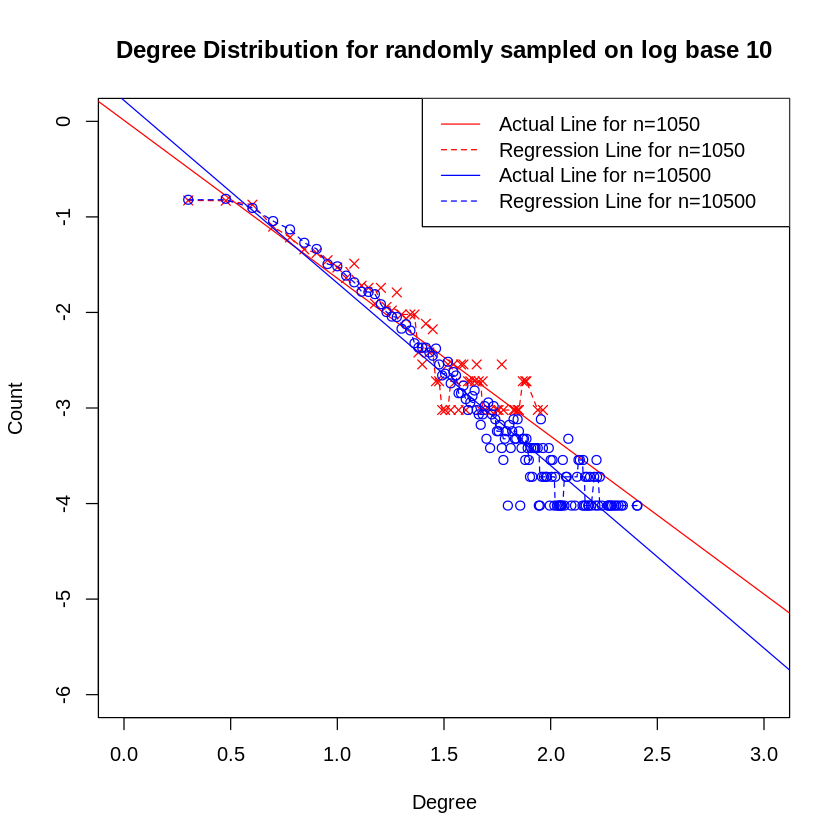

In [26]:
plot(x_axis_for_1050,log_frequencies,xlab="Degree",ylab="Count",main="Degree Distribution for randomly sampled on log base 10",col='red',pch=4,lwd=1,ylim=c(-6,0),xlim=c(0,3))
abline(lm(log_frequencies~x_axis_for_1050),col='red',lty=1,lwd=1)
lines(x_axis_for_1050,smooth(log_frequencies,kind='3RSR'),lty=2,lwd=1,col='red')

points(x_axis_for_10500,log_frequencies_10500,col='blue',lwd=1)
abline(lm(log_frequencies_10500~x_axis_for_10500),col='blue',lty=1,lwd=1)
lines(x_axis_for_10500,smooth(log_frequencies_10500,kind='3RSR'),lty=2,lwd=1,col='blue')
legend('topright', legend = c("Actual Line for n=1050","Regression Line for n=1050","Actual Line for n=10500","Regression Line for n=10500"),lty = c(1, 2,1, 2), lwd = c(1,1,1,1),col = c('red','red','blue','blue'))

In [27]:
model_1050<-lm(log_frequencies~x_axis_for_1050)
model_10500<-lm(log_frequencies_10500~x_axis_for_10500)

print(model_1050)

print(model_10500)


Call:
lm(formula = log_frequencies ~ x_axis_for_1050)

Coefficients:
    (Intercept)  x_axis_for_1050  
        0.01038         -1.65284  


Call:
lm(formula = log_frequencies_10500 ~ x_axis_for_10500)

Coefficients:
     (Intercept)  x_axis_for_10500  
          0.2182           -1.9106  



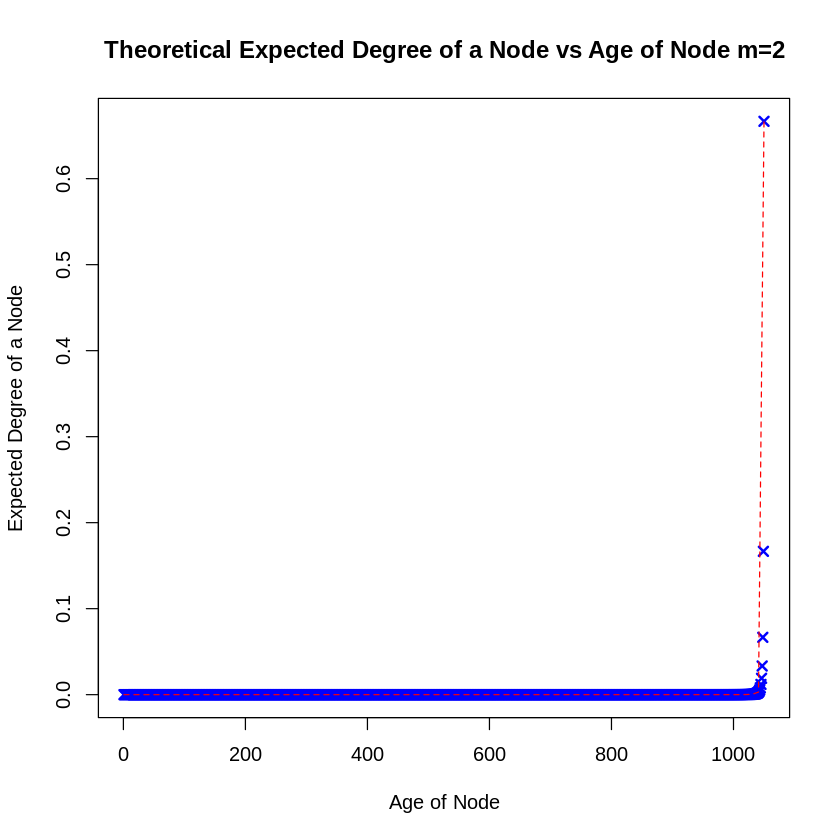

In [28]:
x_axis = c(1050:1)
results = matrix(data=0,nrow=1050,ncol=1)
for(i in x_axis)
{
  results[i]=calculate_degree(i,m=1)
}


plot(x_axis,results,col='blue',lwd=2,pch=4,xlab='Age of Node',ylab='Expected Degree of a Node',main="Theoretical Expected Degree of a Node vs Age of Node m=2")
lines(lowess(x_axis,results,f=0.2),col='red',lty=2,lwd=1)

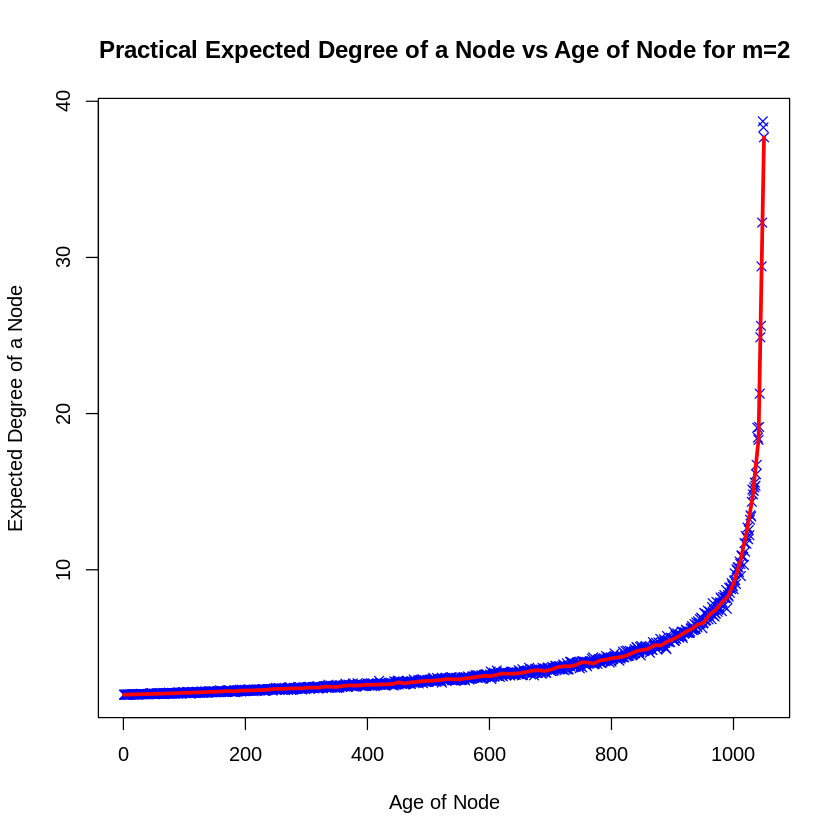

In [29]:
expected_degree = matrix(data=0,nrow=1050)
n_trials<-200
for(i in 1:n_trials)
{
  graph <-barabasi.game(n=1050,m=2,directed=FALSE)
  expected_degree<-expected_degree+degree(graph)
}
expected_degree<-expected_degree/n_trials
plot(c(1050:1),expected_degree,xlab='Age of Node',ylab='Expected Degree of a Node',main="Practical Expected Degree of a Node vs Age of Node for m=2",col='blue',pch=4,lwd=1)
lines(lowess(c(1050:1),expected_degree,f=0.01),col='red',lty=1,lwd=3)

**Question 2G** For m=6

[1] "The probability of the graph being connected is 100.000000"


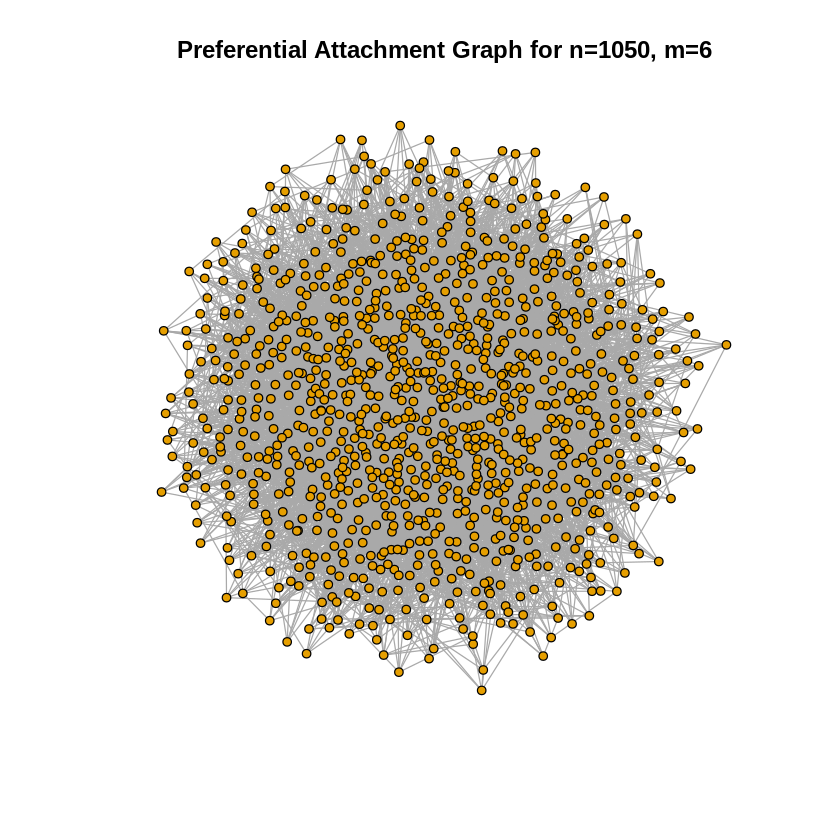

In [30]:
n<-1050
m<-6
connected_val = matrix(data=0,nrow=n_trials)
for(i in 1:n_trials)
{
  graph<-barabasi.game(n,m=m,,directed=FALSE)
  if(is.connected(graph))
  {
    connected_val[i]=1
  }
}


  
# plotting the points in plot window
print(sprintf("The probability of the graph being connected is %f",sum(connected_val)*100/n_trials))

plot(graph,vertex.label="",vertex.size=3)
title(main ="Preferential Attachment Graph for n=1050, m=6")

[1] "The modularity of the Perferential Network Attachment Graph is 0.242335"
[1] "The assortativity of the Preferential Network Attachment Graph is -0.029726"


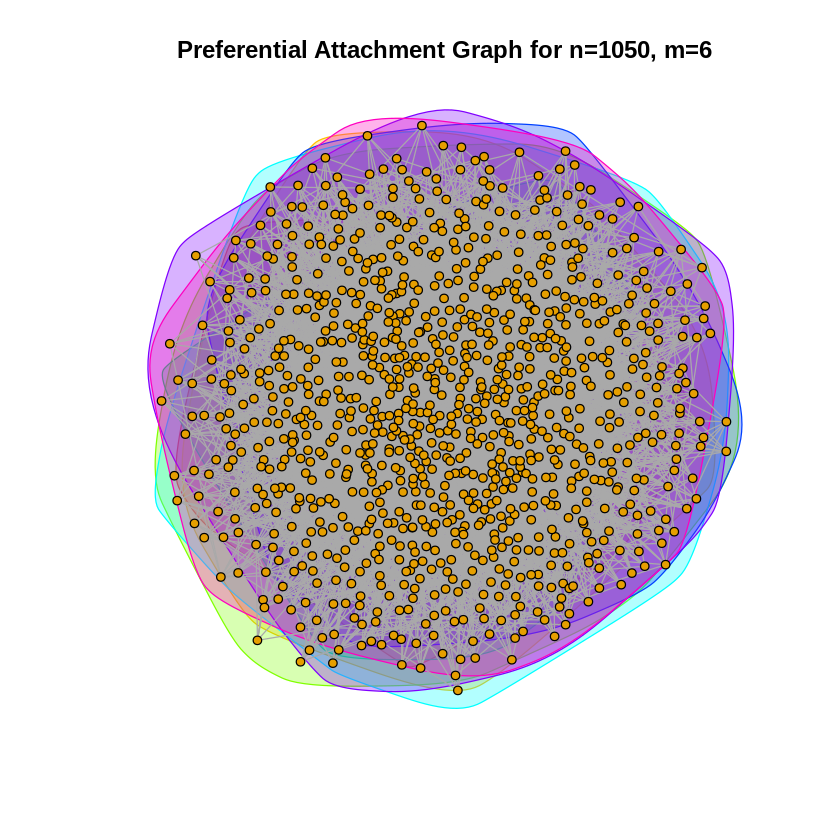

In [31]:
graph<-barabasi.game(n,m=m,,directed=FALSE)
community_structure = cluster_fast_greedy(graph)
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title(main ="Preferential Attachment Graph for n=1050, m=6")
print(sprintf("The modularity of the Perferential Network Attachment Graph is %f",modularity(community_structure)))
print(sprintf("The assortativity of the Preferential Network Attachment Graph is %f",assortativity_degree(graph,directed=FALSE)))

[1] "The modularity of the Perferential Network Attachment Graph is 0.245573"
[1] "The assortativity of the Preferential Network Attachment Graph is 0.000565"


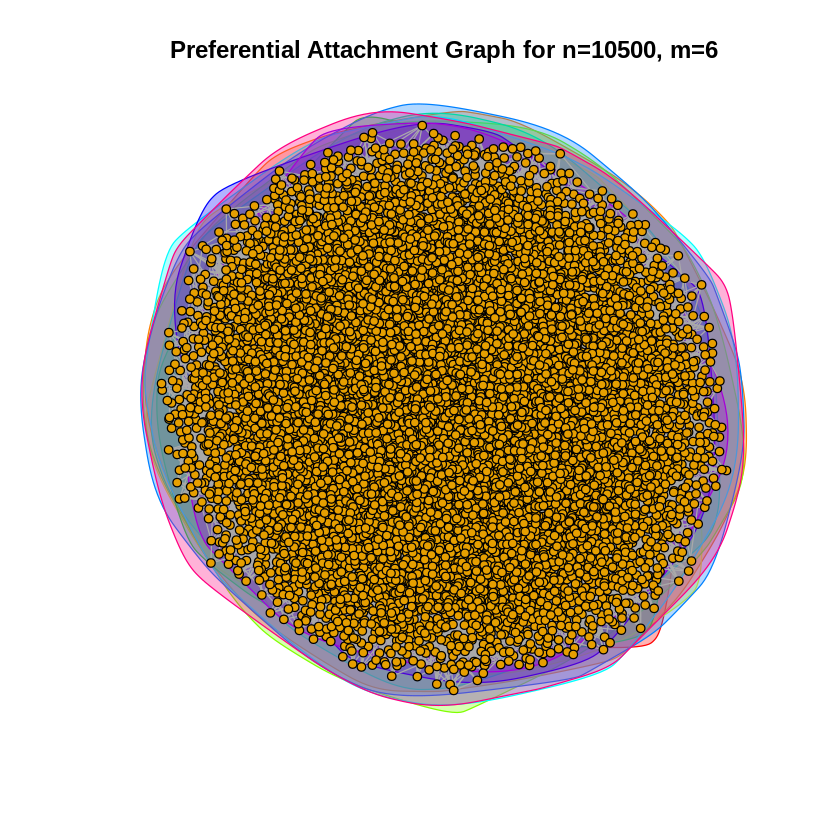

In [32]:
graph<-barabasi.game(10500,m=m,,directed=FALSE)
community_structure = cluster_fast_greedy(graph)
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title(main ="Preferential Attachment Graph for n=10500, m=6")
print(sprintf("The modularity of the Perferential Network Attachment Graph is %f",modularity(community_structure)))
print(sprintf("The assortativity of the Preferential Network Attachment Graph is %f",assortativity_degree(graph,directed=FALSE)))

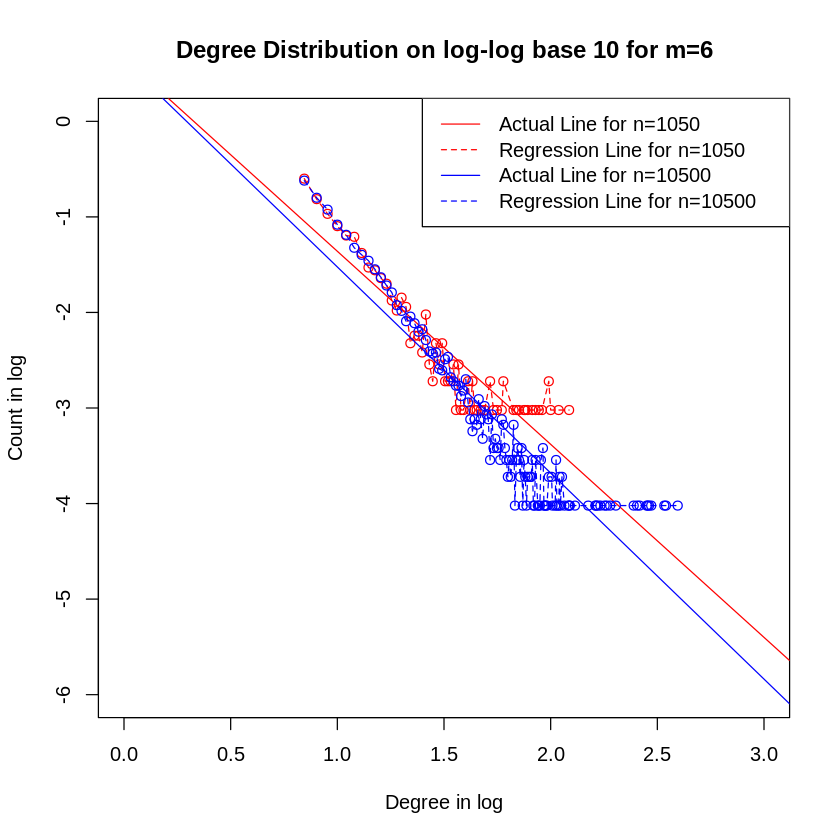

In [33]:
graph_1050 <- barabasi.game(1050,m=m,,directed=FALSE)
graph_10500 <- barabasi.game(10500,m=m,directed=FALSE)

degree_1050 <- degree.distribution(graph_1050)
degree_10500 <-degree.distribution(graph_10500)

degree_1050_for_log <-log10(degree_1050)[which(degree_1050!=0,arr.ind=TRUE)]
degree_10500_for_log <-log10(degree_10500)[which(degree_10500!=0,arr.ind=TRUE)]
x_axis_for_1050 <-c(1:length(degree_1050))[which(degree_1050!=0,arr.ind = TRUE)]
x_axis_for_10500 <-c(1:length(degree_10500))[which(degree_10500!=0,arr.ind = TRUE)]

plot(log10(x_axis_for_1050),degree_1050_for_log,ylim=c(-6,-0),xlim=c(0,3),xlab="Degree in log",ylab="Count in log",main="Degree Distribution on log-log base 10 for m=6",col='red',lwd=1)
abline(lm(degree_1050_for_log~log10(x_axis_for_1050)),col='red',lty=1,lwd=1)
lines(log10(x_axis_for_1050),degree_1050_for_log,lty=2,lwd=1,col='red')

points(log10(x_axis_for_10500),degree_10500_for_log,col='blue',lwd=1)
abline(lm(degree_10500_for_log~log10(x_axis_for_10500)),col='blue',lty=1,lwd=1)
lines(log10(x_axis_for_10500),degree_10500_for_log,lty=2,lwd=1,col='blue')
legend('topright', legend = c("Actual Line for n=1050","Regression Line for n=1050","Actual Line for n=10500","Regression Line for n=10500"),lty = c(1, 2,1, 2), lwd = c(1,1,1,1),col = c('red','red','blue','blue'))

In [34]:
model_1050<-lm(degree_1050_for_log~log10(x_axis_for_1050))
model_10500<-lm(degree_10500_for_log~log10(x_axis_for_10500))

print(model_1050)

print(model_10500)


Call:
lm(formula = degree_1050_for_log ~ log10(x_axis_for_1050))

Coefficients:
           (Intercept)  log10(x_axis_for_1050)  
                0.6602                 -2.0202  


Call:
lm(formula = degree_10500_for_log ~ log10(x_axis_for_10500))

Coefficients:
            (Intercept)  log10(x_axis_for_10500)  
                 0.6323                  -2.1565  



In [35]:
n_trials<-1050
degree_distribution_1050 = matrix(data=0,nrow=n_trials)
degree_distribution_10500 = matrix(data=0,nrow=n_trials)
for(i in 1:n_trials)
{
  graph_1050 <- barabasi.game(1050,m=m,,directed=FALSE)
  random_starting_node_1050 = sample(vcount(graph_1050),1)
  neighbours_1050 = sample(neighbors(graph_1050,random_starting_node_1050),1)
  degree_distribution_1050[i] = degree(graph_1050,neighbours_1050)
 
}
n_trials<-10500
for(i in 1:n_trials)
{
  graph_10500 <- barabasi.game(10500,m=m,directed=FALSE)
  random_starting_node_10500 = sample(vcount(graph_10500),1)
  neighbours_10500 = sample(neighbors(graph_10500,random_starting_node_10500),1)
  degree_distribution_10500[i] = degree(graph_10500,neighbours_10500)
}

frequency_table_1050 <-table(degree_distribution_1050)
frequency_table_10500 <-table(degree_distribution_10500)

log_frequencies <-log10(as.vector(frequency_table_1050)/1050)
x_axis_for_1050 <-log10(as.numeric(names(frequency_table_1050))) 

log_frequencies_10500 <-log10(as.vector(frequency_table_10500)/10500)
x_axis_for_10500 <-log10(as.numeric(names(frequency_table_10500))) 



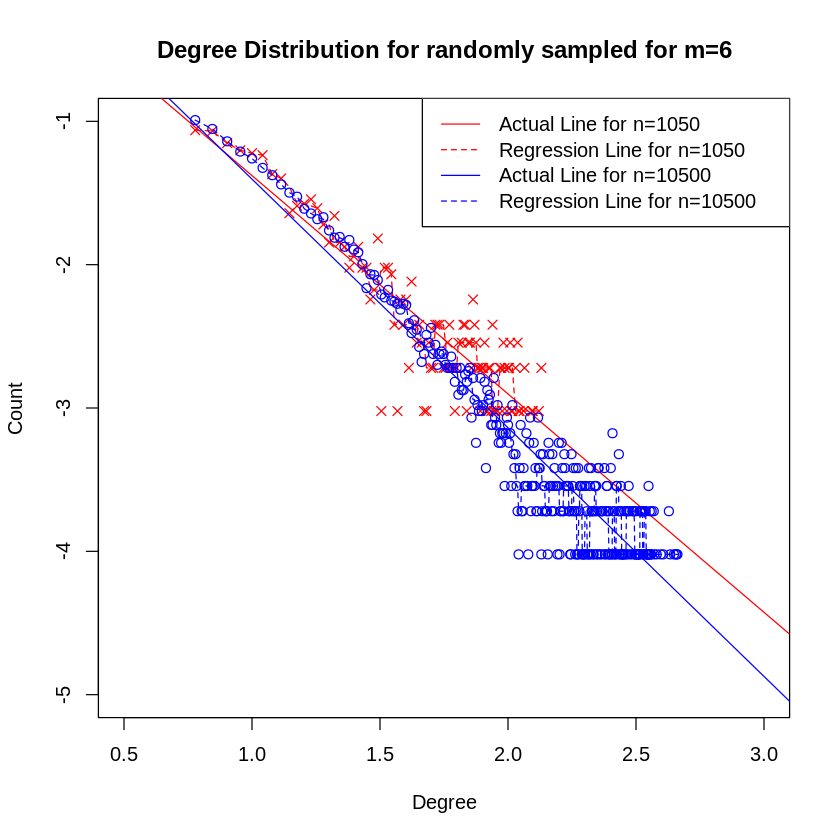

In [36]:
plot(x_axis_for_1050,log_frequencies,xlab="Degree",ylab="Count",ylim=c(-5,-1),xlim=c(0.5,3),main="Degree Distribution for randomly sampled for m=6",col='red',pch=4,lwd=1,)
abline(lm(log_frequencies~x_axis_for_1050),col='red',lty=1,lwd=1)
lines(x_axis_for_1050,smooth(log_frequencies,kind='3RSR'),lty=2,lwd=1,col='red')

points(x_axis_for_10500,log_frequencies_10500,col='blue',lwd=1)
abline(lm(log_frequencies_10500~x_axis_for_10500),col='blue',lty=1,lwd=1)
lines(x_axis_for_10500,smooth(log_frequencies_10500,kind='3RSR'),lty=2,lwd=1,col='blue')
legend('topright', legend = c("Actual Line for n=1050","Regression Line for n=1050","Actual Line for n=10500","Regression Line for n=10500"),lty = c(1, 2,1, 2), lwd = c(1,1,1,1),col = c('red','red','blue','blue'))

In [37]:
model_1050<-lm(log_frequencies~x_axis_for_1050)
model_10500<-lm(log_frequencies_10500~x_axis_for_10500)

print(model_1050)

print(model_10500)


Call:
lm(formula = log_frequencies ~ x_axis_for_1050)

Coefficients:
    (Intercept)  x_axis_for_1050  
         0.1448          -1.5234  


Call:
lm(formula = log_frequencies_10500 ~ x_axis_for_10500)

Coefficients:
     (Intercept)  x_axis_for_10500  
          0.3313           -1.7347  



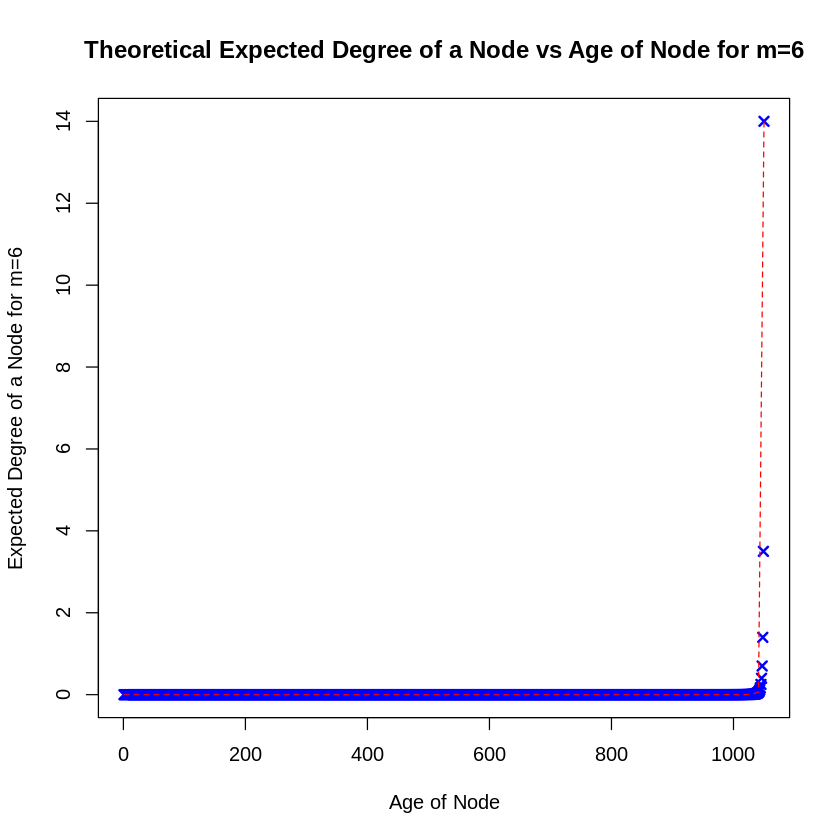

In [38]:
x_axis = c(1050:1)

results = matrix(data=0,nrow=1050,ncol=1)
for(i in x_axis)
{
  results[i]=calculate_degree(i,m=6)
}


plot(x_axis,results,col='blue',lwd=2,pch=4,xlab='Age of Node',ylab='Expected Degree of a Node for m=6',main="Theoretical Expected Degree of a Node vs Age of Node for m=6")
lines(lowess(x_axis,results,f=0.2),col='red',lty=2,lwd=1)

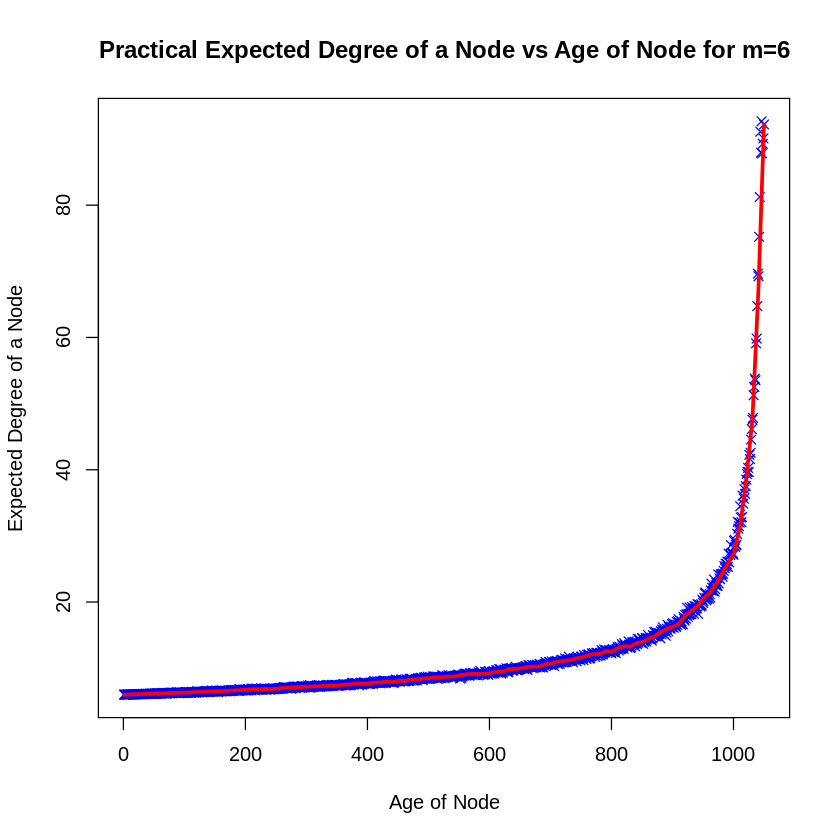

In [39]:
expected_degree = matrix(data=0,nrow=1050)
n_trials<-200
for(i in 1:n_trials)
{
  graph <-barabasi.game(n=1050,m=6,directed=FALSE)
  expected_degree<-expected_degree+degree(graph)
}
expected_degree<-expected_degree/n_trials
plot(c(1050:1),expected_degree,xlab='Age of Node',ylab='Expected Degree of a Node',main="Practical Expected Degree of a Node vs Age of Node for m=6",col='blue',pch=4,lwd=1)
lines(lowess(c(1050:1),expected_degree,f=0.01),col='red',lty=1,lwd=3)

**Question 2h**

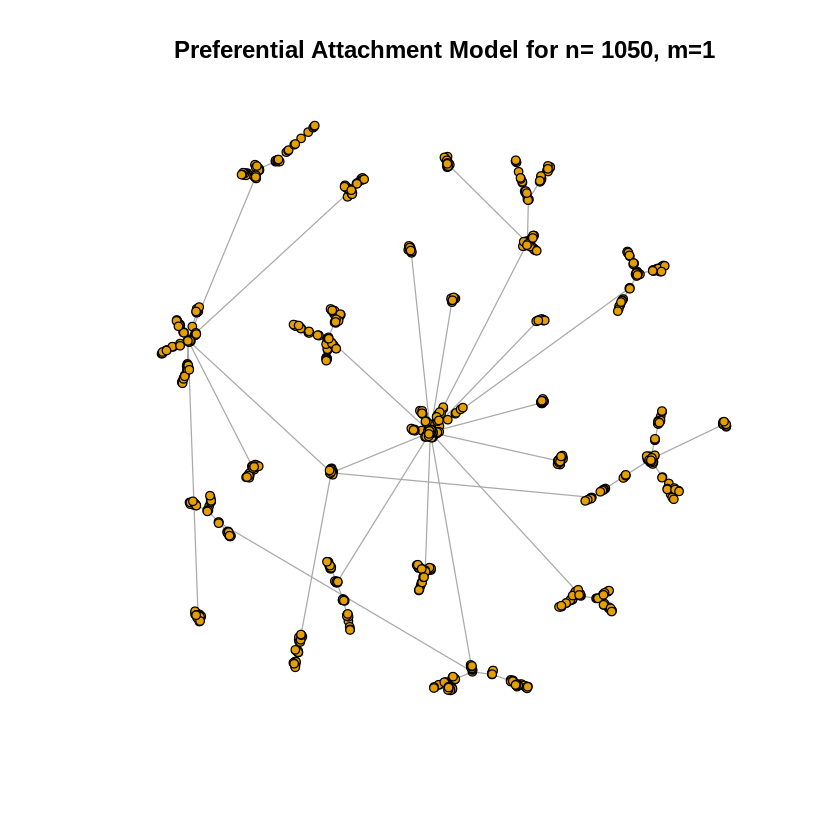

[1] "The modularity of the graph is 0.929855"


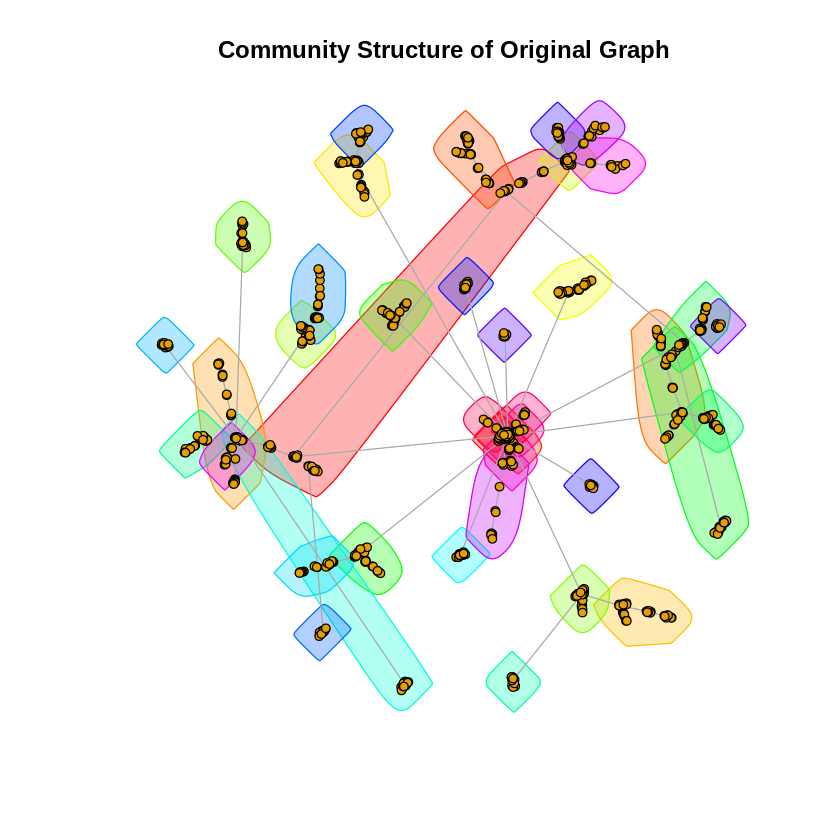

In [68]:
graph <-barabasi.game(n=1050,m=1,directed=FALSE)


community_structure = cluster_fast_greedy(graph)
plot(graph,vertex.label="",vertex.size=3)
title("Preferential Attachment Model for n= 1050, m=1")
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title("Community Structure of Original Graph")
print(sprintf("The modularity of the graph is %f",modularity(community_structure)))

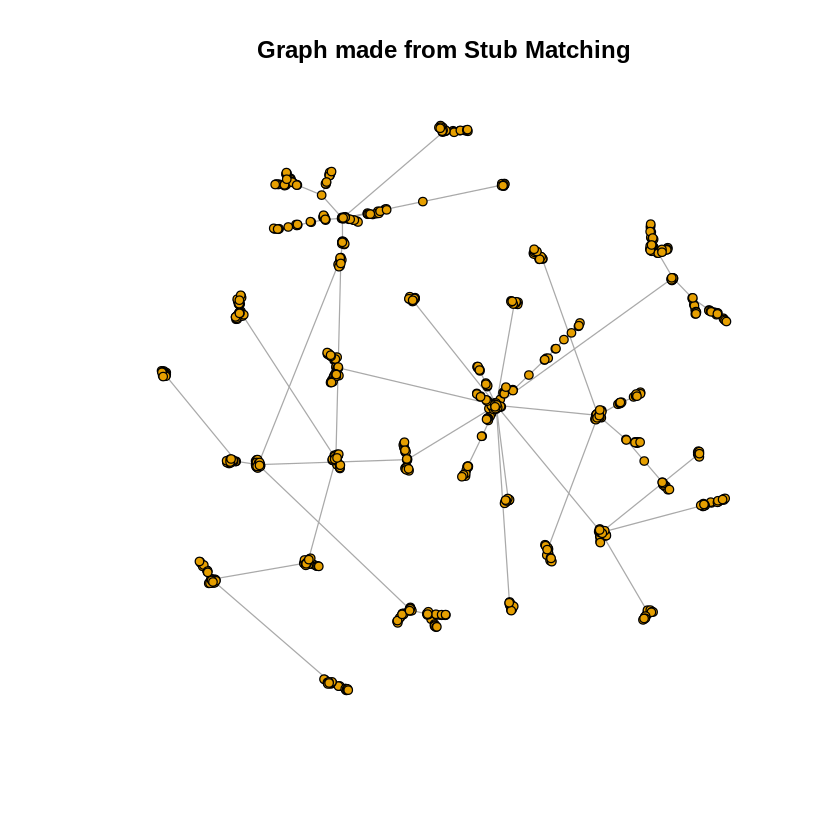

[1] "The modularity of the graph is 0.935078"


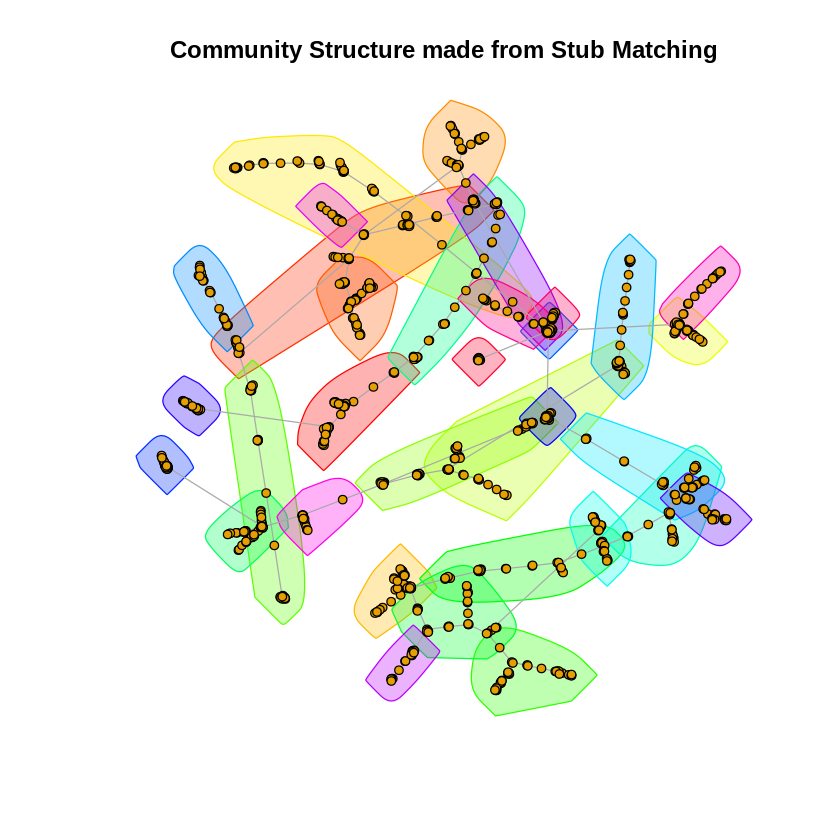

In [41]:
graph_generated_from_deg_seq <-sample_degseq(degree(graph),method='vl')
community_structure = cluster_fast_greedy(graph_generated_from_deg_seq)
plot(graph,vertex.label="",vertex.size=3)
title("Graph made from Stub Matching")
plot(graph_generated_from_deg_seq,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title("Community Structure made from Stub Matching")
print(sprintf("The modularity of the graph is %f",modularity(community_structure)))

**Question 3A**

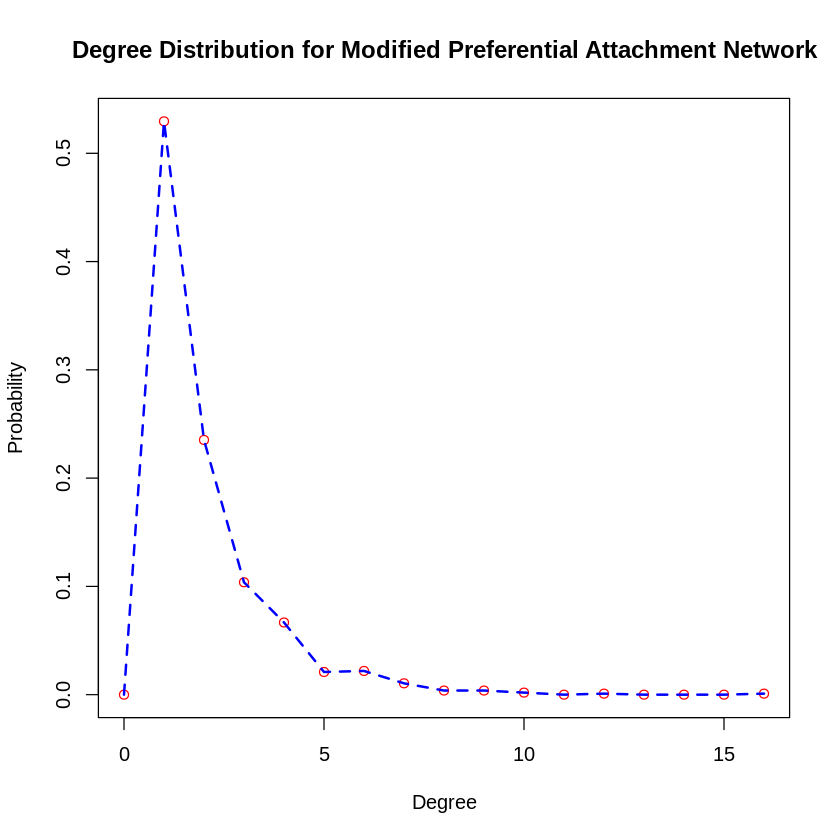


Call:
lm(formula = degree_for_log ~ log10(x_axis_))

Coefficients:
   (Intercept)  log10(x_axis_)  
        0.9428         -3.3479  



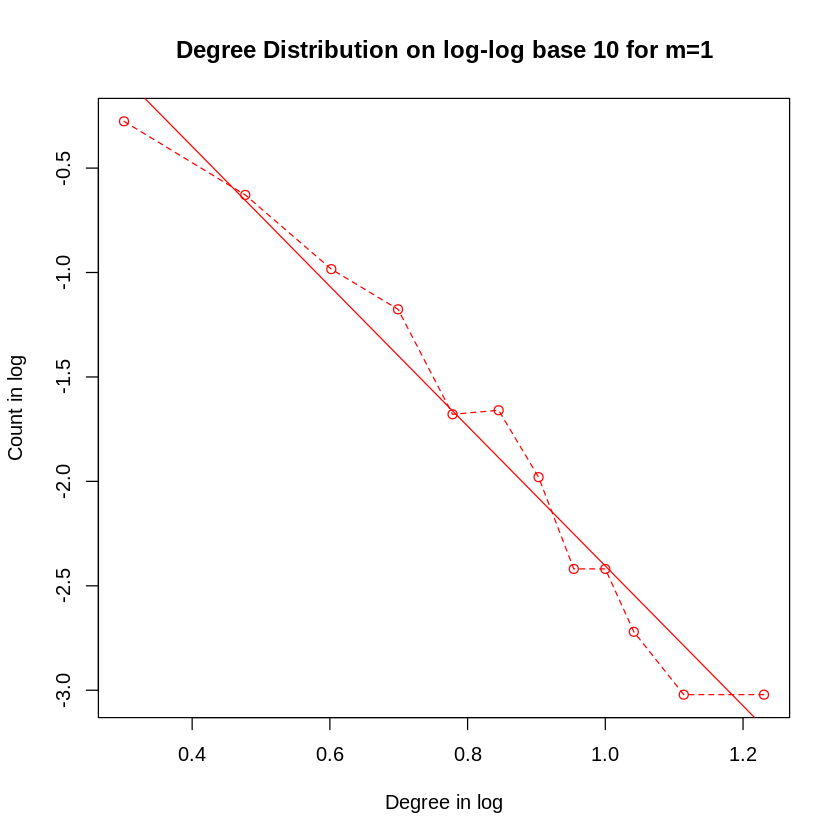

In [43]:
graph<- sample_pa_age(n=1050,m=1,aging.exp =-1,pa.exp=1,directed=FALSE)
plot(seq_along(degree.distribution(graph))-1,degree.distribution(graph),col='red',lwd=1,main='Degree Distribution for Modified Preferential Attachment Network',xlab='Degree',ylab='Probability')
lines(seq_along(degree.distribution(graph))-1,degree.distribution(graph),col='blue',lty=2,lwd=2)

degree_ <- degree.distribution(graph)

degree_for_log <-log10(degree_)[which(degree_!=0,arr.ind=TRUE)]
x_axis_ <-c(1:length(degree_))[which(degree_!=0,arr.ind = TRUE)]

plot(log10(x_axis_),degree_for_log,xlab="Degree in log",ylab="Count in log",main="Degree Distribution on log-log base 10 for m=1",col='red',lwd=1)
abline(lm(degree_for_log~log10(x_axis_)),col='red',lty=1,lwd=1)
lines(log10(x_axis_),degree_for_log,lty=2,lwd=1,col='red')

print(lm(degree_for_log~log10(x_axis_)))

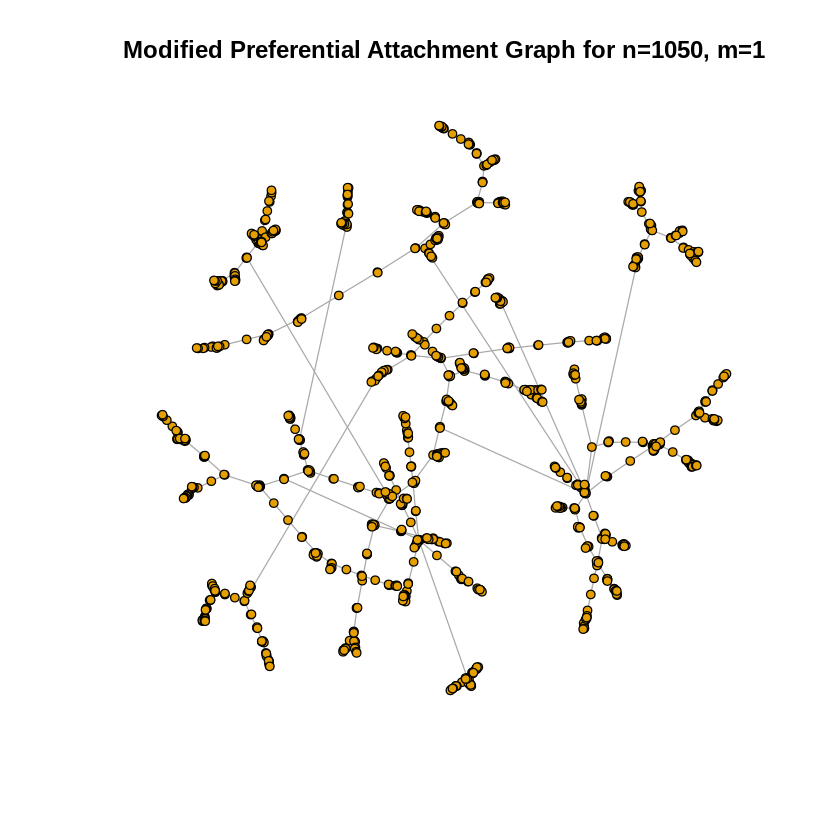

[1] "The modularity of the graph is 0.935960"


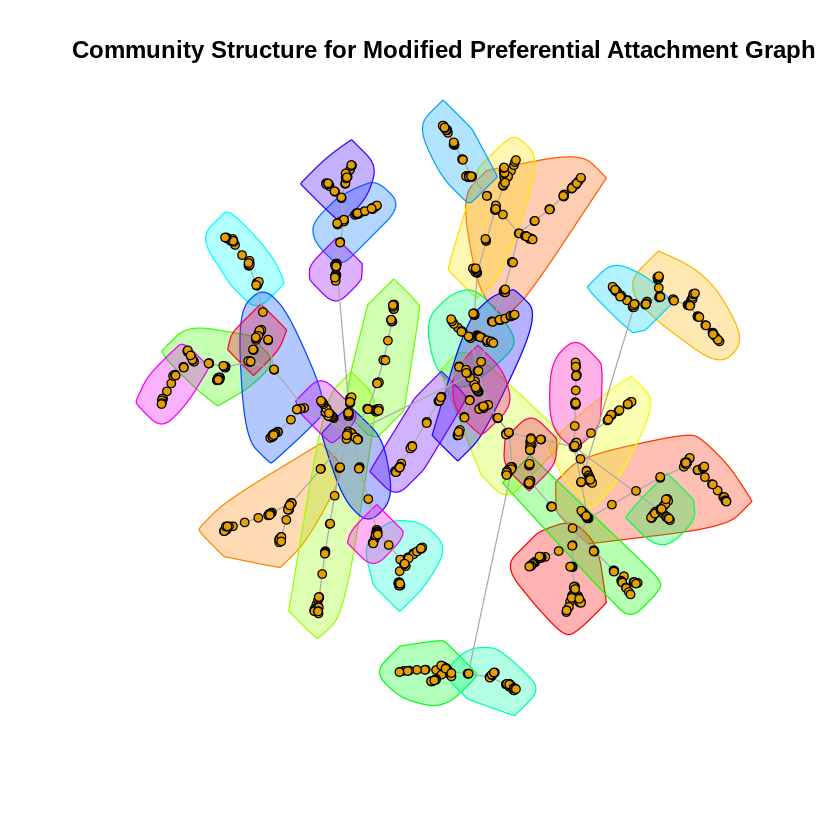

In [44]:
community_structure <- cluster_fast_greedy(graph)
plot(graph,vertex.label="",vertex.size=3)
title(main ="Modified Preferential Attachment Graph for n=1050, m=1")
plot(graph,vertex.label="",vertex.size=3,mark.groups=groups(community_structure))
title(main ="Community Structure for Modified Preferential Attachment Graph")
print(sprintf("The modularity of the graph is %f",modularity(community_structure)))

##Question 2 Random Walks

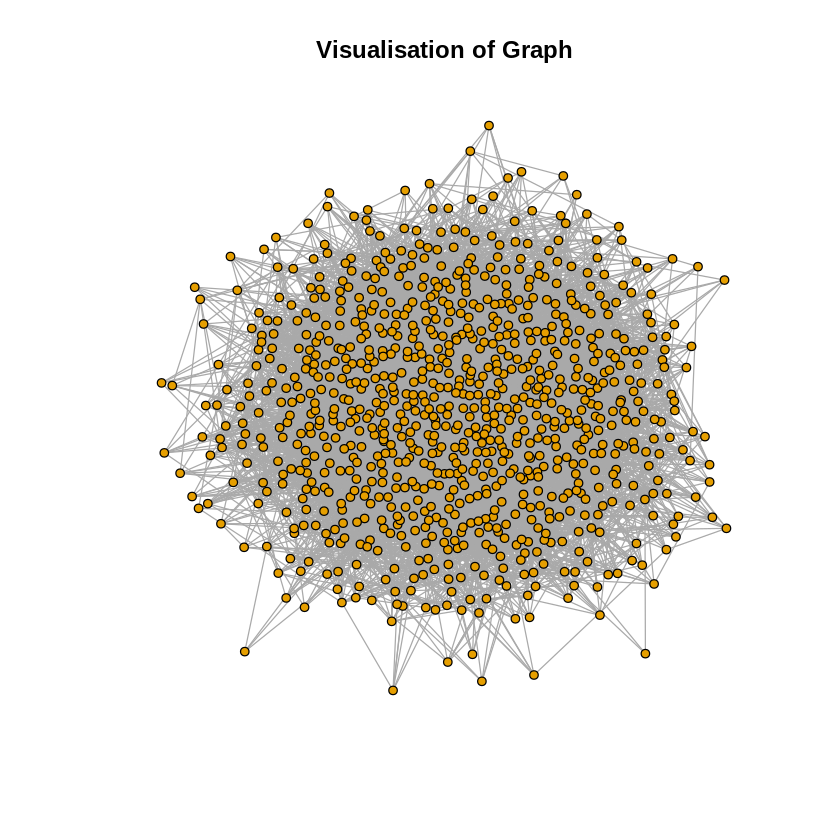

In [4]:
graph<-sample_gnp(n=900,p=0.015)
plot(graph,vertex.label="",vertex.size=3,main='Visualisation of Graph')

In [5]:
get_gcc_graph=function(graph)
{
      g_clusters<-clusters(graph)
      biggest_cluster_id <- which.max(g_clusters$csize)
      vert_ids <- V(graph)[g_clusters$membership == biggest_cluster_id] 
      gcc_graph = induced_subgraph(graph, vert_ids)
      return (gcc_graph)
}

**Question 1B and 1C For Random Walks** 

In [6]:
time_steps<-100
n_random_starting_points<-900
shortest_path_data<-matrix(data=0,ncol=n_random_starting_points,nrow = time_steps)
degree_distribution_data<-matrix(data=0,nrow=n_random_starting_points)
gcc_component = get_gcc_graph(graph)

distance_table = distances(gcc_component)


for (i in 1:n_random_starting_points)
{
  random_starting_point = sample(vcount(gcc_component),1)
  ending_point = random_walk(start = random_starting_point,steps=100,graph=gcc_component)
  shortest_path_data[,i] = distance_table[random_starting_point,ending_point]
  degree_distribution_data[i] = degree(gcc_component,ending_point[length(ending_point)])
}

In [7]:
mean_shortest_path =rowMeans(shortest_path_data)
print(mean_shortest_path)

variance_shortest_path = rowVars(shortest_path_data)
print(variance_shortest_path)
print(diameter(gcc_component))
print(is_connected(graph))
time_steps_taken = seq(1,time_steps)

  [1] 0.000000 1.000000 1.800000 2.468889 2.608889 2.777778 2.855556 2.855556
  [9] 2.841111 2.824444 2.823333 2.855556 2.834444 2.852222 2.847778 2.852222
 [17] 2.852222 2.826667 2.884444 2.861111 2.851111 2.838889 2.841111 2.817778
 [25] 2.820000 2.840000 2.836667 2.851111 2.834444 2.863333 2.830000 2.860000
 [33] 2.868889 2.822222 2.827778 2.828889 2.826667 2.827778 2.842222 2.838889
 [41] 2.842222 2.881111 2.860000 2.832222 2.833333 2.848889 2.846667 2.837778
 [49] 2.842222 2.848889 2.856667 2.835556 2.825556 2.802222 2.825556 2.841111
 [57] 2.852222 2.832222 2.836667 2.841111 2.831111 2.832222 2.823333 2.814444
 [65] 2.813333 2.823333 2.836667 2.813333 2.851111 2.832222 2.815556 2.870000
 [73] 2.837778 2.827778 2.846667 2.835556 2.840000 2.832222 2.822222 2.816667
 [81] 2.845556 2.840000 2.808889 2.810000 2.791111 2.848889 2.843333 2.813333
 [89] 2.826667 2.811111 2.830000 2.838889 2.865556 2.853333 2.828889 2.843333
 [97] 2.822222 2.821111 2.795556 2.797778
  [1] 0.0000000 0.0000

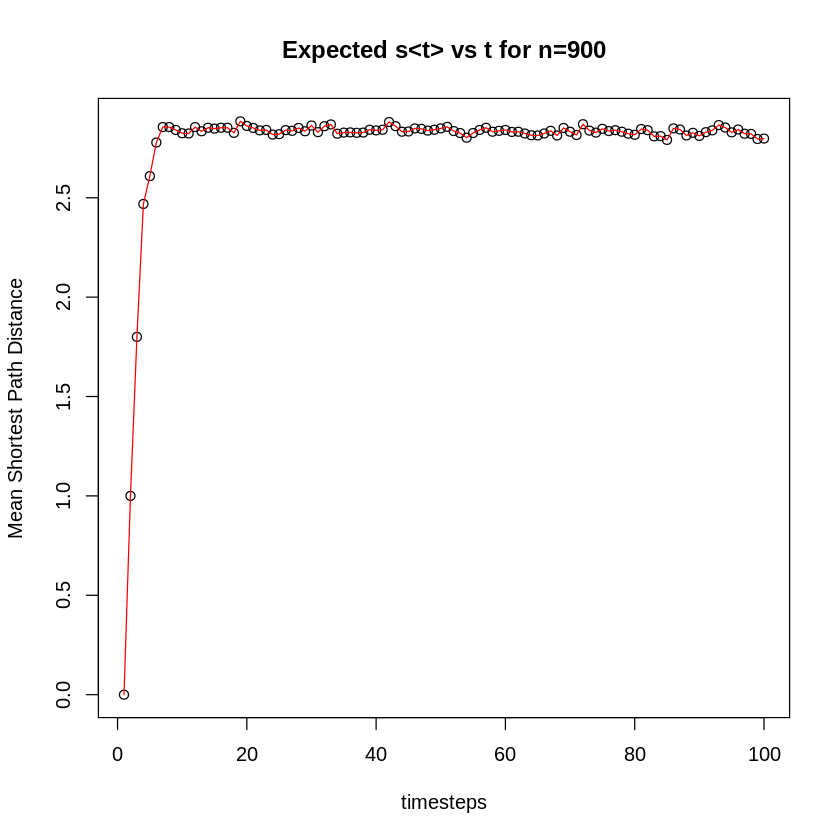

In [8]:
plot(time_steps_taken,mean_shortest_path,main='Expected s<t> vs t for n=900',xlab='timesteps',ylab='Mean Shortest Path Distance')
lines(time_steps_taken,mean_shortest_path,col='red')

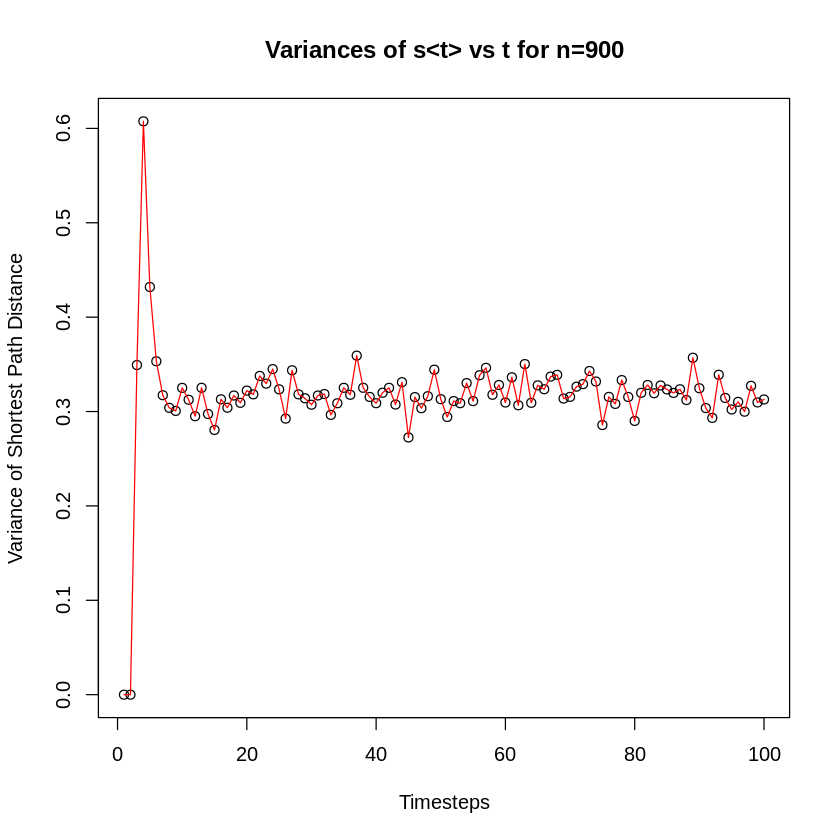

In [9]:
plot(time_steps_taken,variance_shortest_path,main='Variances of s<t> vs t for n=900',xlab='Timesteps',ylab='Variance of Shortest Path Distance')
lines(time_steps_taken,variance_shortest_path,col='red')

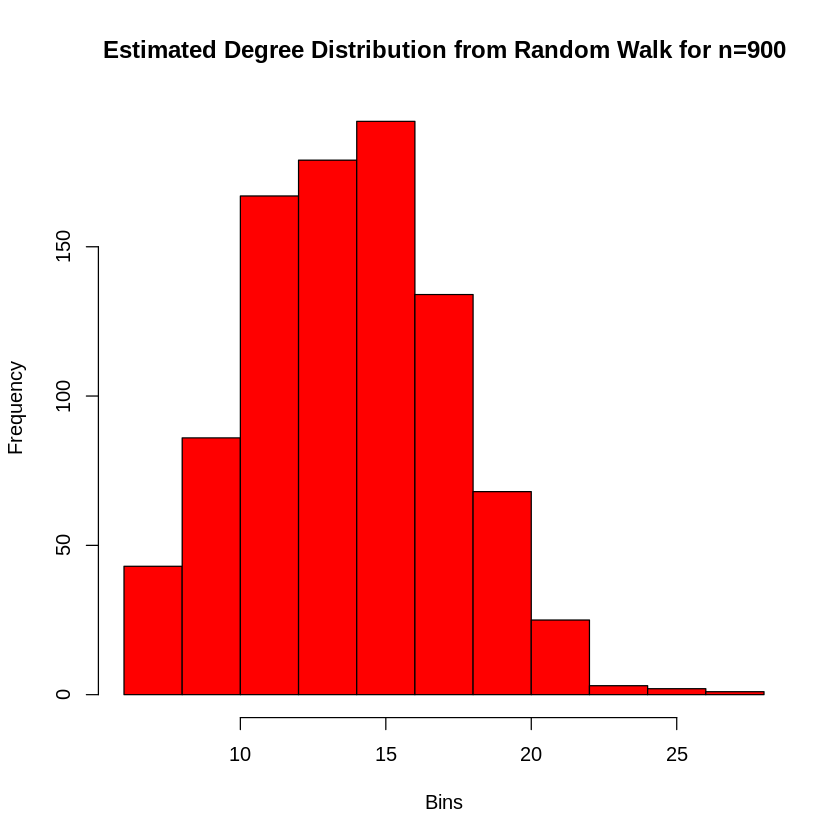

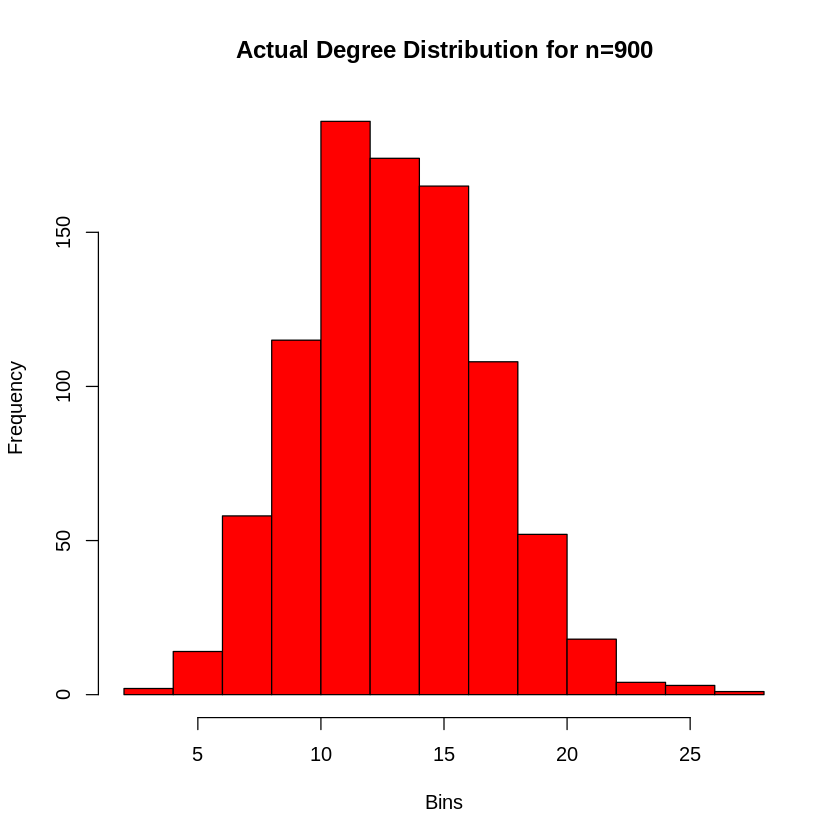

In [10]:
hist(degree_distribution_data,col='red',xlab='Bins',ylab='Frequency',main="Estimated Degree Distribution from Random Walk for n=900")
hist(degree(graph),col='red',xlab='Bins',ylab='Frequency',main="Actual Degree Distribution for n=900")

**Question 1D for Random Walks** 

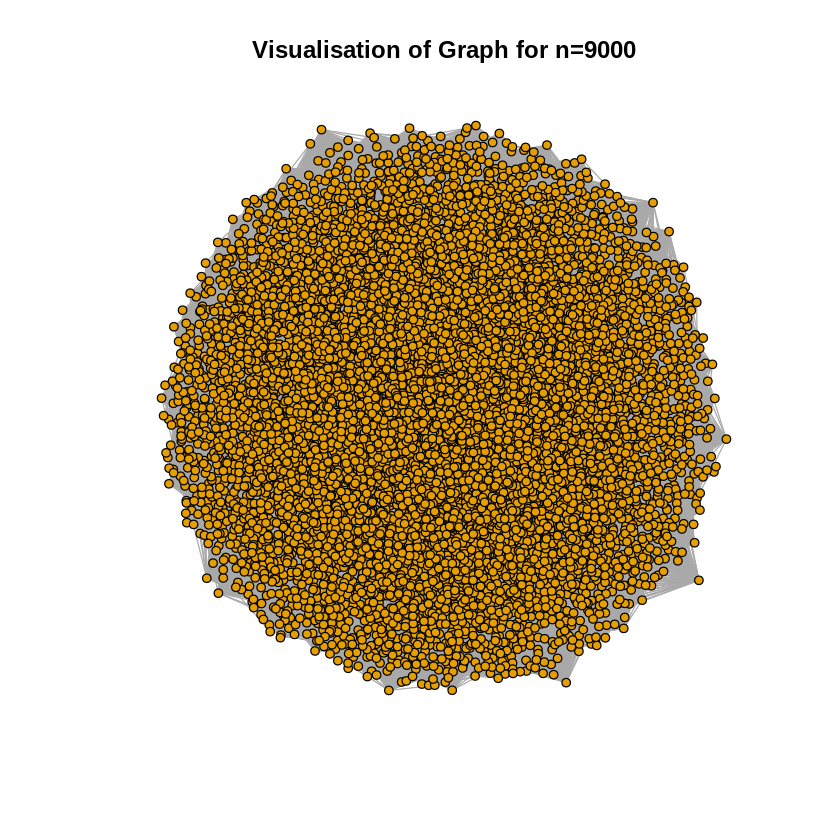

In [14]:
graph<-sample_gnp(n=9000,p=0.015)
plot(graph,vertex.label="",vertex.size=3,main='Visualisation of Graph for n=9000')

In [15]:
time_steps<-100
n_random_starting_points<-9000
shortest_path_data<-matrix(data=0,ncol=n_random_starting_points,nrow = time_steps)
degree_distribution_data<-matrix(data=0,nrow=n_random_starting_points)
gcc_component = get_gcc_graph(graph)

distance_table = distances(gcc_component)


for (i in 1:n_random_starting_points)
{
  random_starting_point = sample(vcount(gcc_component),1)
  ending_point = random_walk(start = random_starting_point,steps=100,graph=gcc_component)
  shortest_path_data[,i] = distance_table[random_starting_point,ending_point]
  degree_distribution_data[i] = degree(gcc_component,ending_point[length(ending_point)])
}

In [16]:
mean_shortest_path = rowMeans(shortest_path_data)
mean_degree_distribution = rowMeans(degree_distribution_data)

variance_shortest_path = rowVars(shortest_path_data)
print(mean_shortest_path)
print(variance_shortest_path)
print(diameter(gcc_component))

  [1] 0.000000 1.000000 1.971778 2.105000 2.108778 2.111889 2.114000 2.114889
  [9] 2.113000 2.114667 2.116667 2.107222 2.110111 2.108778 2.111000 2.117889
 [17] 2.114222 2.115222 2.107667 2.118444 2.109889 2.113556 2.108333 2.115556
 [25] 2.111222 2.115556 2.110444 2.114667 2.113333 2.114111 2.117778 2.115222
 [33] 2.118667 2.111333 2.106778 2.110778 2.112444 2.116222 2.119000 2.112667
 [41] 2.112667 2.111111 2.109556 2.111667 2.114111 2.114000 2.122778 2.112111
 [49] 2.107667 2.114667 2.113333 2.120778 2.118444 2.114667 2.117222 2.109889
 [57] 2.117111 2.118111 2.113778 2.115333 2.114111 2.107889 2.113444 2.112000
 [65] 2.107333 2.113556 2.111444 2.107333 2.120889 2.122556 2.113333 2.105889
 [73] 2.121000 2.112778 2.119333 2.110889 2.112444 2.105222 2.108111 2.107111
 [81] 2.108444 2.111778 2.114444 2.111000 2.110333 2.120444 2.114667 2.113222
 [89] 2.109444 2.114556 2.113444 2.115111 2.114000 2.108333 2.117889 2.117222
 [97] 2.115222 2.115333 2.112889 2.112000
  [1] 0.00000000 0.000

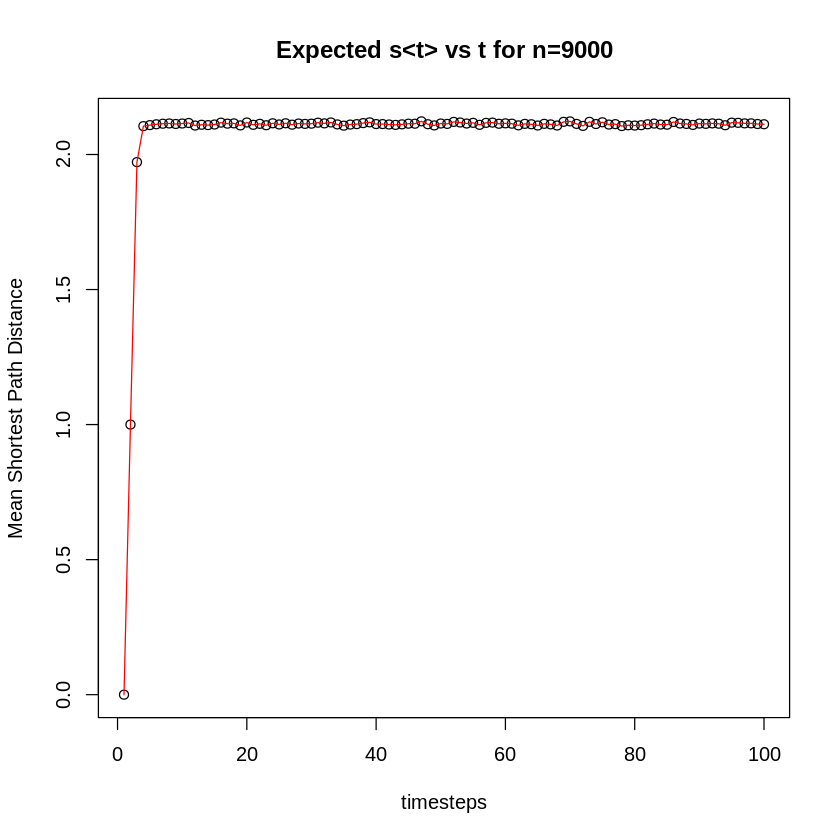

In [17]:
plot(time_steps_taken,mean_shortest_path,main='Expected s<t> vs t for n=9000',xlab='timesteps',ylab='Mean Shortest Path Distance')
lines(time_steps_taken,mean_shortest_path,col='red')

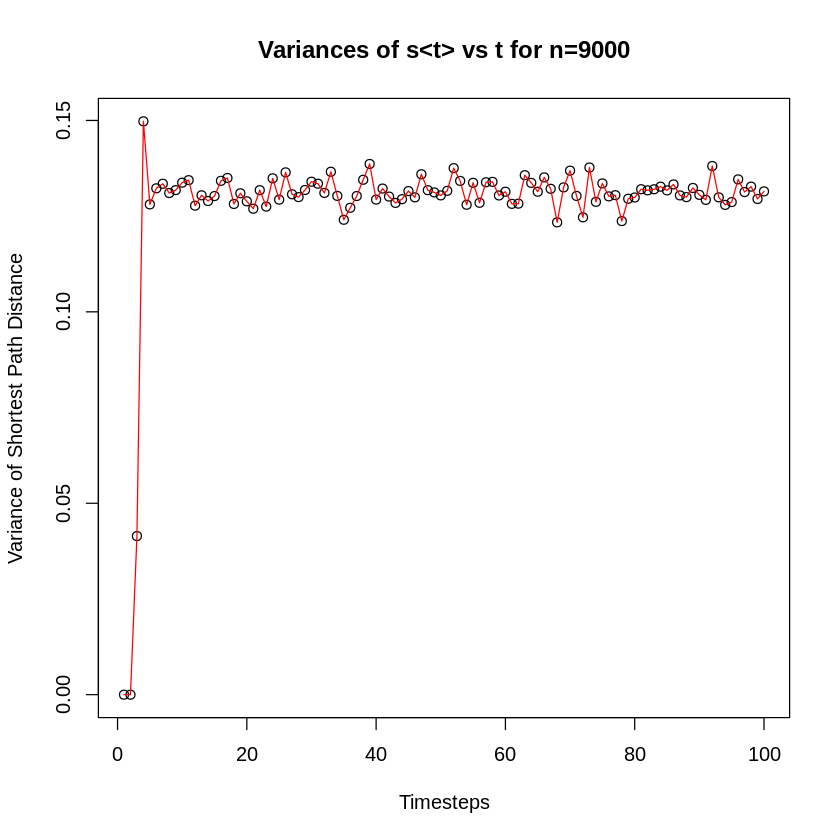

In [18]:
plot(time_steps_taken,variance_shortest_path,main='Variances of s<t> vs t for n=9000',xlab='Timesteps',ylab='Variance of Shortest Path Distance')
lines(time_steps_taken,variance_shortest_path,col='red')

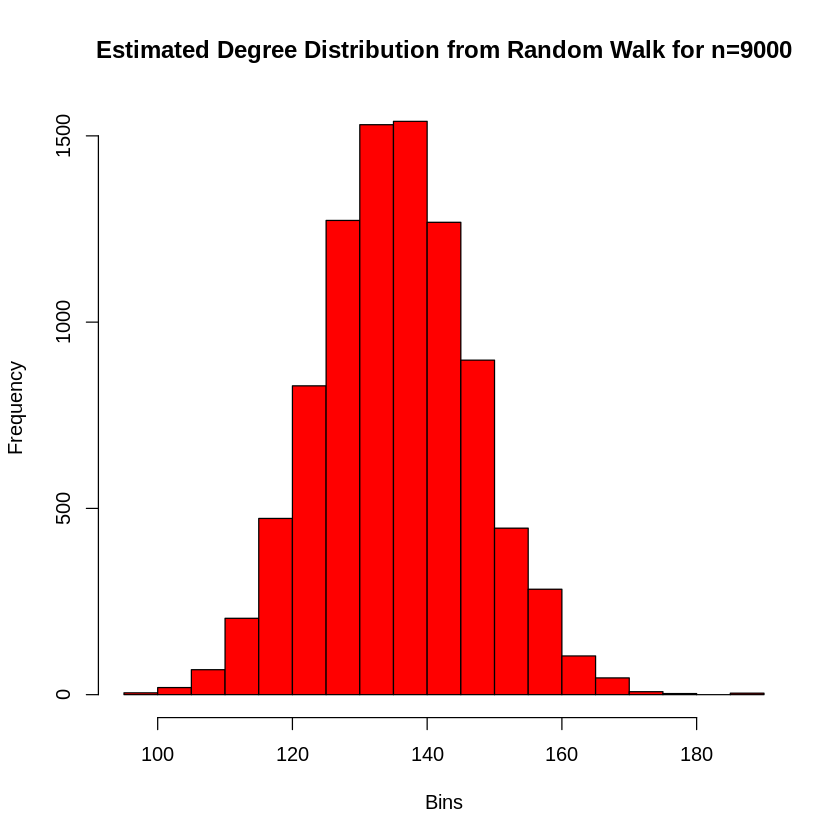

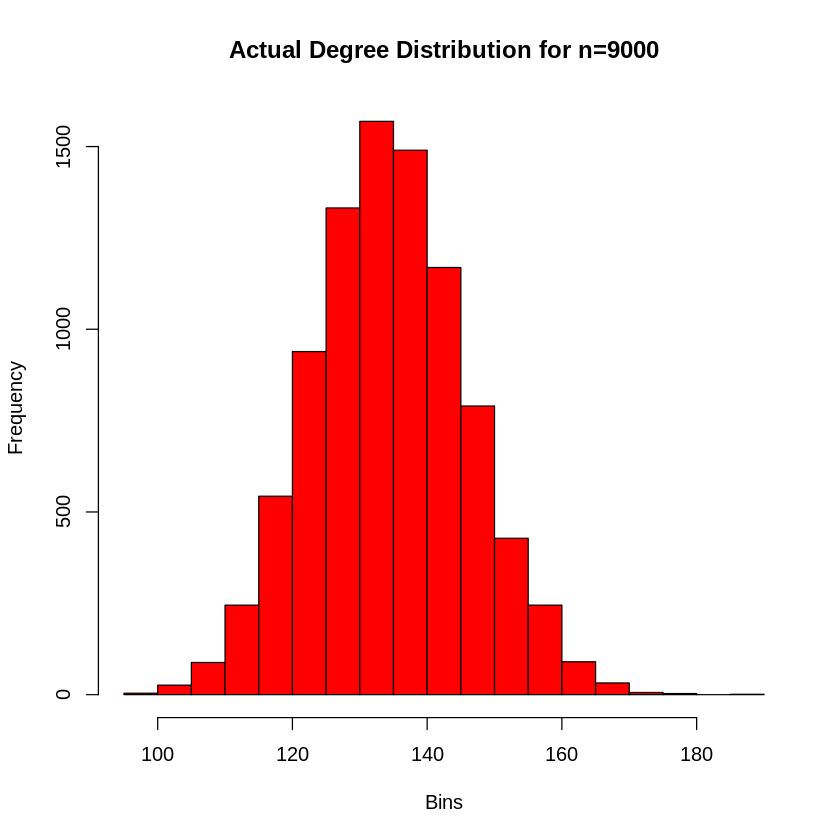

In [19]:
hist(degree_distribution_data,col='red',xlab='Bins',ylab='Frequency',main="Estimated Degree Distribution from Random Walk for n=9000")
hist(degree(graph),col='red',xlab='Bins',ylab='Frequency',main="Actual Degree Distribution for n=9000")

**Question 2 for Random Walk**

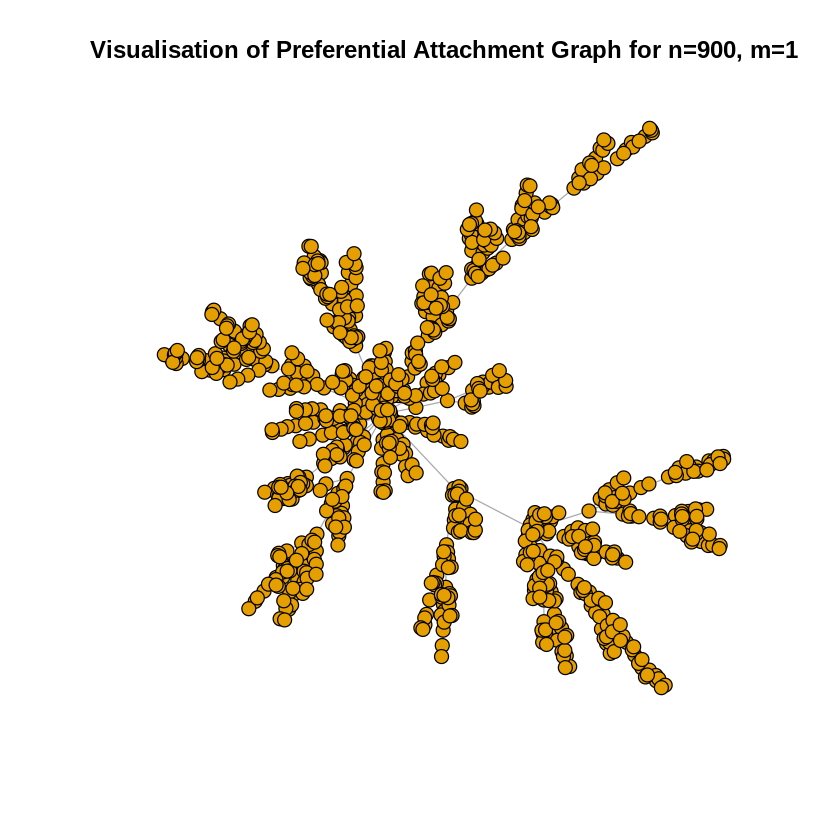

In [20]:
graph<-barabasi.game(n=900,m=1,directed=FALSE)
plot(graph,vertex.label="",vertex.size=5,main='Visualisation of Preferential Attachment Graph for n=900, m=1')

In [21]:
time_steps<-100
n_random_starting_points<-900
shortest_path_data<-matrix(data=0,ncol=n_random_starting_points,nrow = time_steps)
degree_distribution_data<-matrix(data=0,nrow=n_random_starting_points)
gcc_component = get_gcc_graph(graph)

distance_table = distances(gcc_component)


for (i in 1:n_random_starting_points)
{
  random_starting_point = sample(vcount(gcc_component),1)
  ending_point = random_walk(start = random_starting_point,steps=time_steps,graph=gcc_component)
  shortest_path_data[,i] = distance_table[random_starting_point,ending_point]
  degree_distribution_data[i] = degree(gcc_component,ending_point[length(ending_point)])
}

In [22]:
mean_shortest_path = rowMeans(shortest_path_data)
mean_degree_distribution = rowMeans(degree_distribution_data)

variance_shortest_path = rowVars(shortest_path_data)
print(mean_shortest_path)
print(variance_shortest_path)
print(diameter(gcc_component))

  [1] 0.000000 1.000000 1.182222 1.548889 1.588889 1.857778 1.942222 2.168889
  [9] 2.215556 2.340000 2.371111 2.506667 2.564444 2.662222 2.651111 2.780000
 [17] 2.784444 2.920000 2.955556 3.037778 3.064444 3.184444 3.171111 3.242222
 [25] 3.202222 3.268889 3.242222 3.353333 3.382222 3.500000 3.477778 3.602222
 [33] 3.584444 3.693333 3.673333 3.737778 3.753333 3.817778 3.811111 3.866667
 [41] 3.873333 3.864444 3.888889 3.891111 3.946667 3.997778 4.011111 4.077778
 [49] 4.008889 4.060000 4.037778 4.075556 4.068889 4.091111 4.166667 4.131111
 [57] 4.197778 4.193333 4.191111 4.231111 4.202222 4.195556 4.193333 4.211111
 [65] 4.224444 4.255556 4.315556 4.295556 4.380000 4.393333 4.433333 4.417778
 [73] 4.431111 4.451111 4.502222 4.482222 4.488889 4.533333 4.508889 4.540000
 [81] 4.553333 4.546667 4.604444 4.631111 4.642222 4.675556 4.642222 4.706667
 [89] 4.651111 4.644444 4.666667 4.693333 4.688889 4.675556 4.708889 4.737778
 [97] 4.713333 4.717778 4.753333 4.762222
  [1] 0.0000000 0.0000

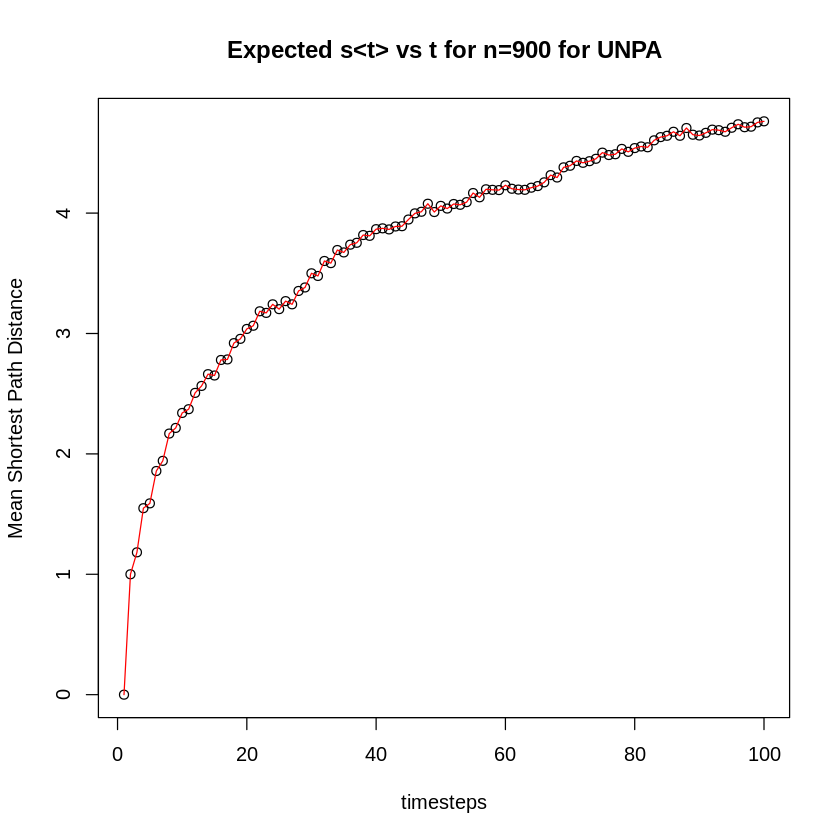

In [23]:
plot(time_steps_taken,mean_shortest_path,main='Expected s<t> vs t for n=900 for UNPA',xlab='timesteps',ylab='Mean Shortest Path Distance')
lines(time_steps_taken,mean_shortest_path,col='red')

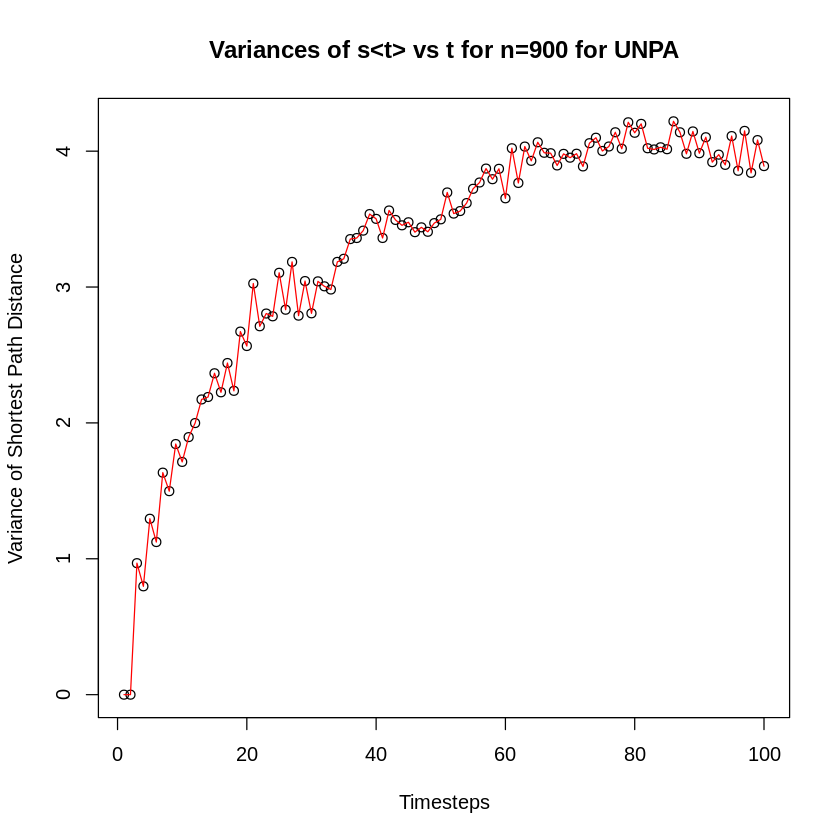

In [24]:
plot(time_steps_taken,variance_shortest_path,main='Variances of s<t> vs t for n=900 for UNPA',xlab='Timesteps',ylab='Variance of Shortest Path Distance')
lines(time_steps_taken,variance_shortest_path,col='red')

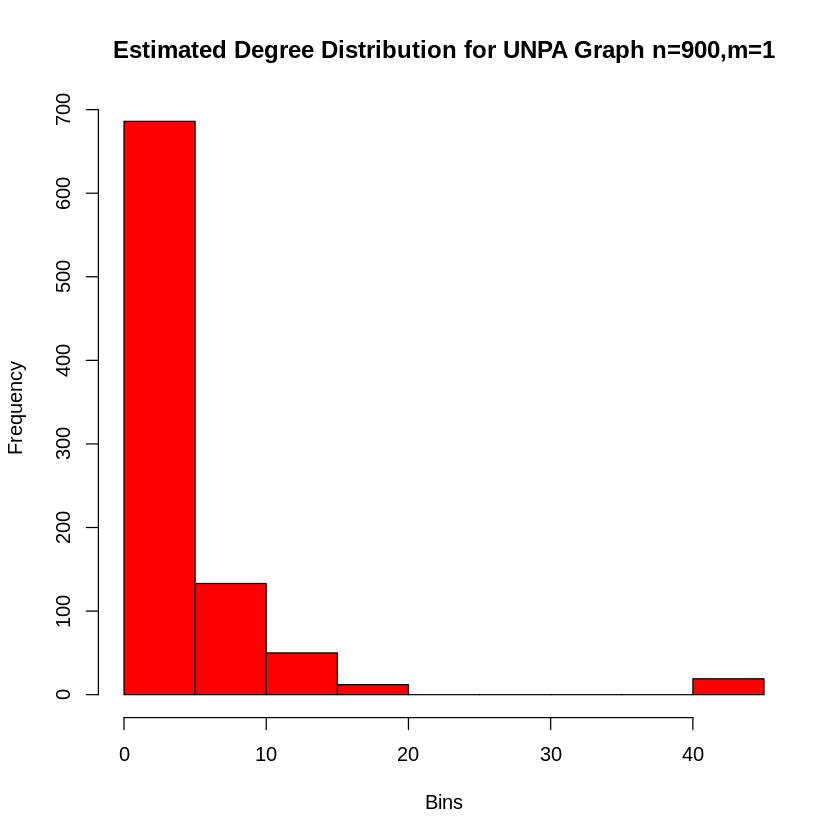

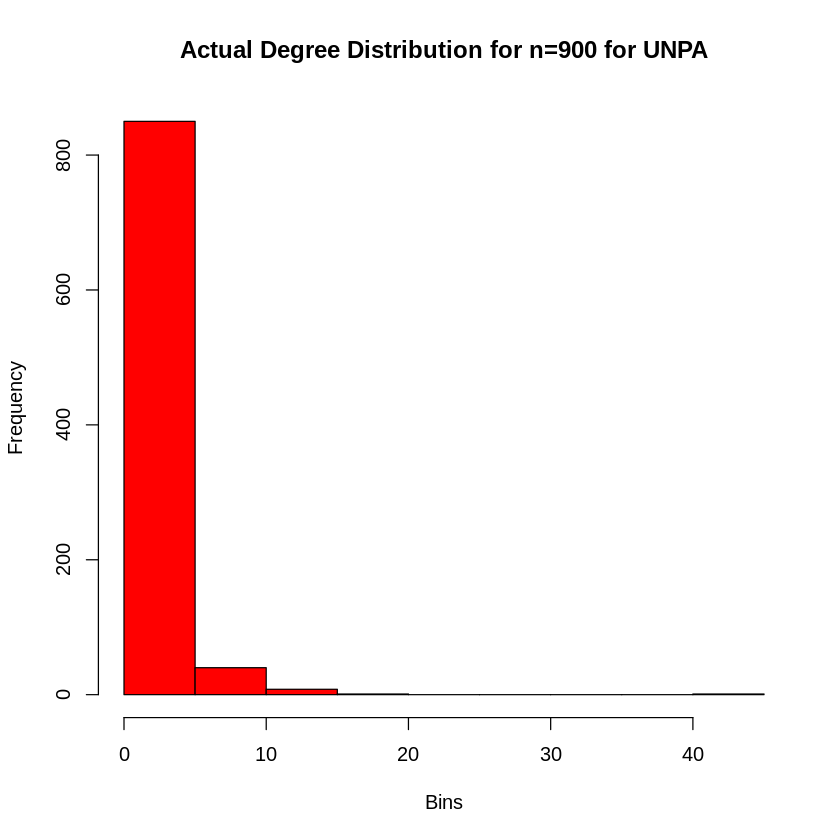

In [25]:
hist(degree_distribution_data,col='red',xlab='Bins',ylab='Frequency',main="Estimated Degree Distribution for UNPA Graph n=900,m=1")
hist(degree(graph),col='red',xlab='Bins',ylab='Frequency',main="Actual Degree Distribution for n=900 for UNPA")

**n = 90** 

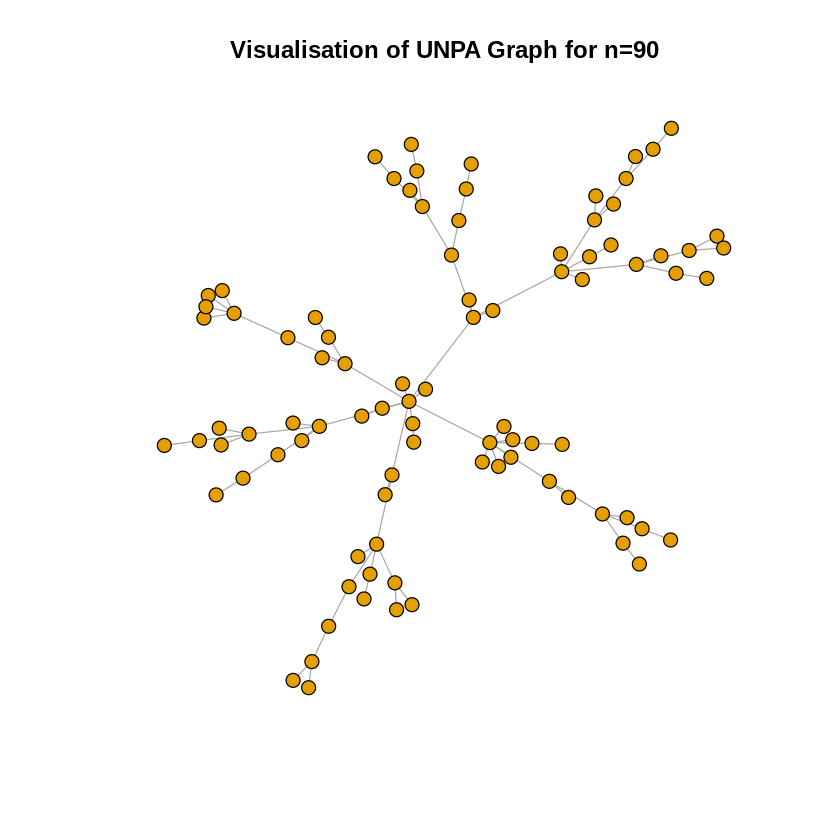

In [38]:
graph<-barabasi.game(n=90,m=1,directed=FALSE)
plot(graph,vertex.label="",vertex.size=5,main='Visualisation of UNPA Graph for n=90')

In [27]:
time_steps<-100
n_random_starting_points<-90
shortest_path_data<-matrix(data=0,ncol=n_random_starting_points,nrow = time_steps)
degree_distribution_data<-matrix(data=0,nrow=n_random_starting_points)
gcc_component = get_gcc_graph(graph)

distance_table = distances(gcc_component)


for (i in 1:n_random_starting_points)
{
  random_starting_point = sample(vcount(gcc_component),1)
  ending_point = random_walk(start = random_starting_point,steps=100,graph=gcc_component)
  shortest_path_data[,i] = distance_table[random_starting_point,ending_point]
  degree_distribution_data[i] = degree(gcc_component,ending_point[length(ending_point)])
}

In [28]:
mean_shortest_path = rowMeans(shortest_path_data)
mean_degree_distribution = rowMeans(degree_distribution_data)

variance_shortest_path = rowVars(shortest_path_data)

print(mean_shortest_path)
print(variance_shortest_path)
print(diameter(gcc_component))

  [1] 0.000000 1.000000 1.155556 1.377778 1.377778 1.866667 1.711111 2.066667
  [9] 2.177778 2.266667 2.244444 2.244444 2.333333 2.466667 2.666667 2.600000
 [17] 2.755556 2.844444 2.844444 2.977778 2.888889 2.933333 2.977778 3.088889
 [25] 3.066667 3.133333 3.200000 3.400000 3.333333 3.200000 3.355556 3.266667
 [33] 3.311111 3.422222 3.555556 3.333333 3.444444 3.377778 3.355556 3.444444
 [41] 3.511111 3.422222 3.466667 3.466667 3.422222 3.511111 3.466667 3.466667
 [49] 3.600000 3.577778 3.488889 3.600000 3.688889 3.622222 3.755556 3.755556
 [57] 3.533333 3.733333 3.666667 3.755556 3.622222 3.800000 3.755556 3.844444
 [65] 3.755556 3.800000 3.711111 3.533333 3.666667 3.533333 3.666667 3.600000
 [73] 3.555556 3.622222 3.666667 3.711111 3.600000 3.711111 3.733333 3.800000
 [81] 3.733333 3.688889 3.533333 3.644444 3.600000 3.644444 3.600000 3.555556
 [89] 3.622222 3.666667 3.777778 3.777778 3.733333 3.733333 3.711111 3.800000
 [97] 3.800000 3.800000 3.866667 3.911111
  [1] 0.0000000 0.0000

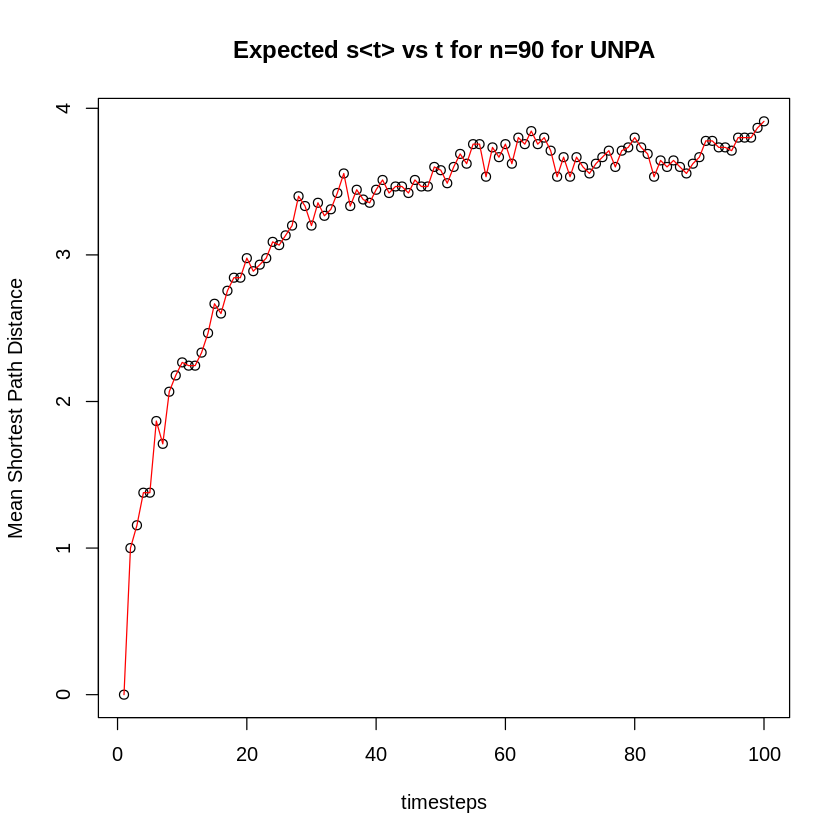

In [29]:
plot(time_steps_taken,mean_shortest_path,main='Expected s<t> vs t for n=90 for UNPA',xlab='timesteps',ylab='Mean Shortest Path Distance')
lines(time_steps_taken,mean_shortest_path,col='red')

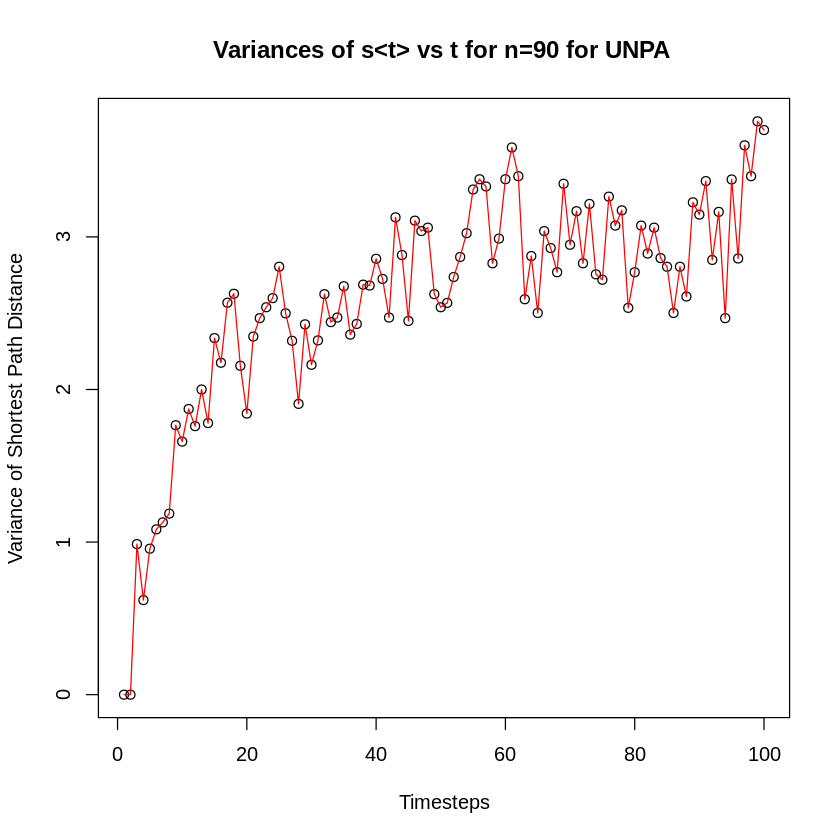

In [30]:
plot(time_steps_taken,variance_shortest_path,main='Variances of s<t> vs t for n=90 for UNPA ',xlab='Timesteps',ylab='Variance of Shortest Path Distance')
lines(time_steps_taken,variance_shortest_path,col='red')

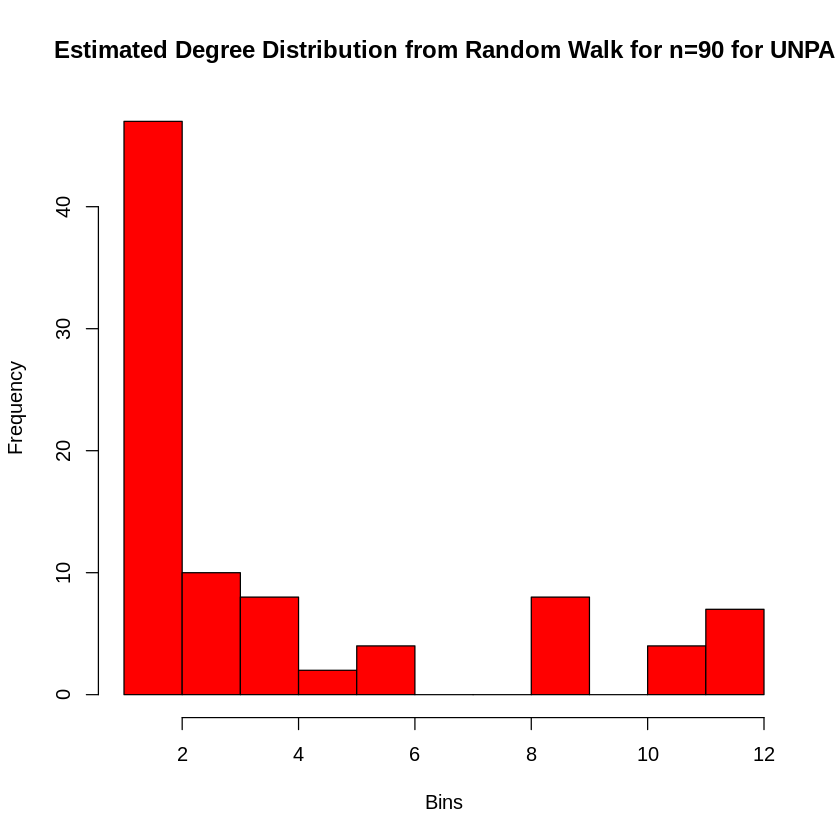

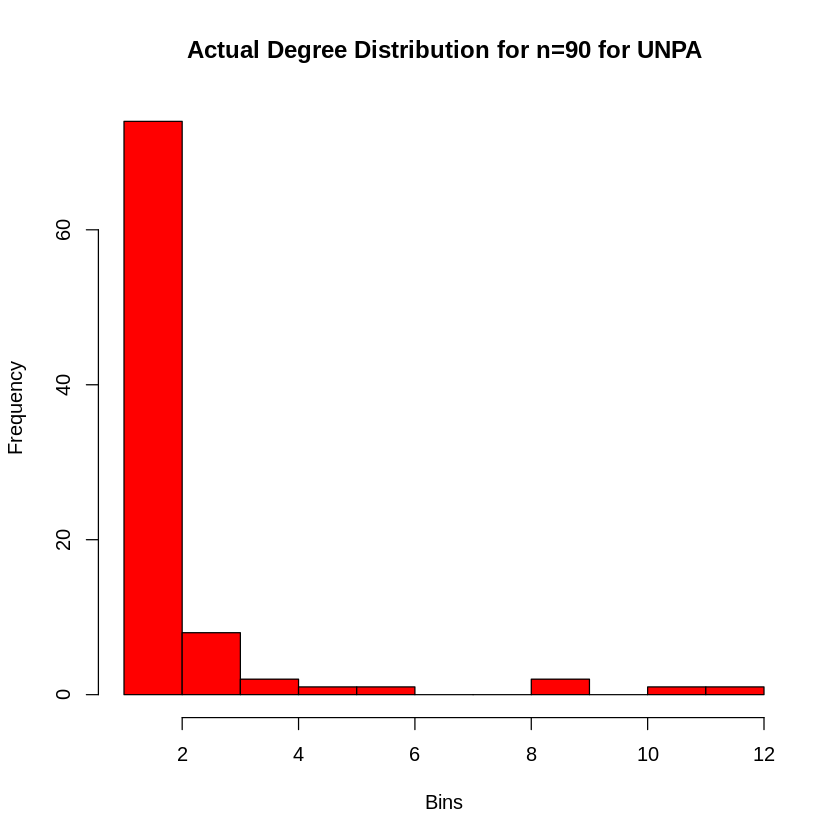

In [31]:
hist(degree_distribution_data,col='red',xlab='Bins',ylab='Frequency',main="Estimated Degree Distribution from Random Walk for n=90 for UNPA")
hist(degree(graph),col='red',xlab='Bins',ylab='Frequency',main="Actual Degree Distribution for n=90 for UNPA")

**n = 9000**

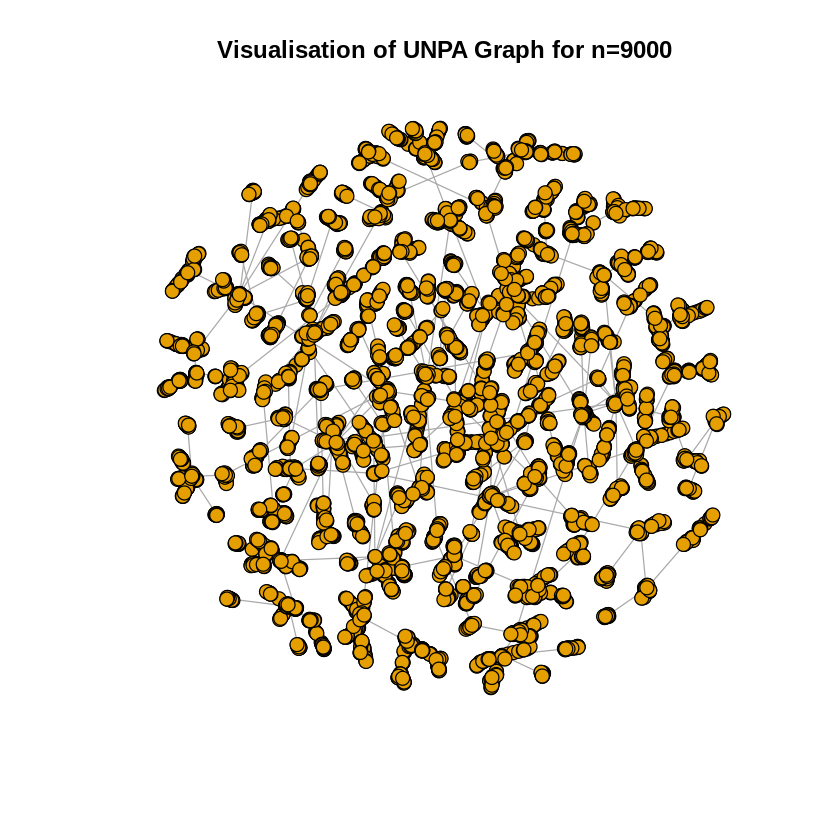

In [39]:
graph<-barabasi.game(n=9000,m=1,directed=FALSE)
plot(graph,vertex.label="",vertex.size=5,main='Visualisation of UNPA Graph for n=9000')

In [33]:
time_steps<-100
n_random_starting_points<-9000
shortest_path_data<-matrix(data=0,ncol=n_random_starting_points,nrow = time_steps)
degree_distribution_data<-matrix(data=0,nrow=n_random_starting_points)
gcc_component = get_gcc_graph(graph)

distance_table = distances(gcc_component)


for (i in 1:n_random_starting_points)
{
  random_starting_point = sample(vcount(gcc_component),1)
  ending_point = random_walk(start = random_starting_point,steps=100,graph=gcc_component)
  shortest_path_data[,i] = distance_table[random_starting_point,ending_point]
  degree_distribution_data[i] = degree(gcc_component,ending_point[length(ending_point)])
}

In [34]:
mean_shortest_path = rowMeans(shortest_path_data)
mean_degree_distribution = rowMeans(degree_distribution_data)

variance_shortest_path = rowVars(shortest_path_data)

print(mean_shortest_path)
print(variance_shortest_path)
print(diameter(gcc_component))

  [1] 0.000000 1.000000 1.198222 1.528000 1.632667 1.870889 1.932222 2.116444
  [9] 2.175333 2.332000 2.370444 2.497556 2.537333 2.651778 2.679556 2.778889
 [17] 2.816889 2.896889 2.929556 3.019111 3.042000 3.089111 3.117111 3.185333
 [25] 3.221333 3.278000 3.323333 3.381556 3.373778 3.445111 3.468000 3.516889
 [33] 3.520667 3.575333 3.579556 3.618444 3.642444 3.696222 3.714667 3.763111
 [41] 3.777111 3.804667 3.828667 3.865333 3.876000 3.905333 3.939556 3.968444
 [49] 3.988222 4.039778 4.035333 4.080222 4.073333 4.126222 4.136444 4.171778
 [57] 4.178222 4.221111 4.216222 4.250000 4.256889 4.270444 4.293556 4.316444
 [65] 4.325556 4.352667 4.356444 4.390667 4.393556 4.416889 4.411778 4.434667
 [73] 4.439778 4.470444 4.477778 4.507111 4.524222 4.548000 4.564667 4.591556
 [81] 4.589556 4.624000 4.625556 4.643333 4.662667 4.677333 4.678222 4.736444
 [89] 4.720889 4.751333 4.749778 4.784222 4.773556 4.804667 4.796000 4.834889
 [97] 4.829556 4.848222 4.846222 4.859333
  [1] 0.0000000 0.0000

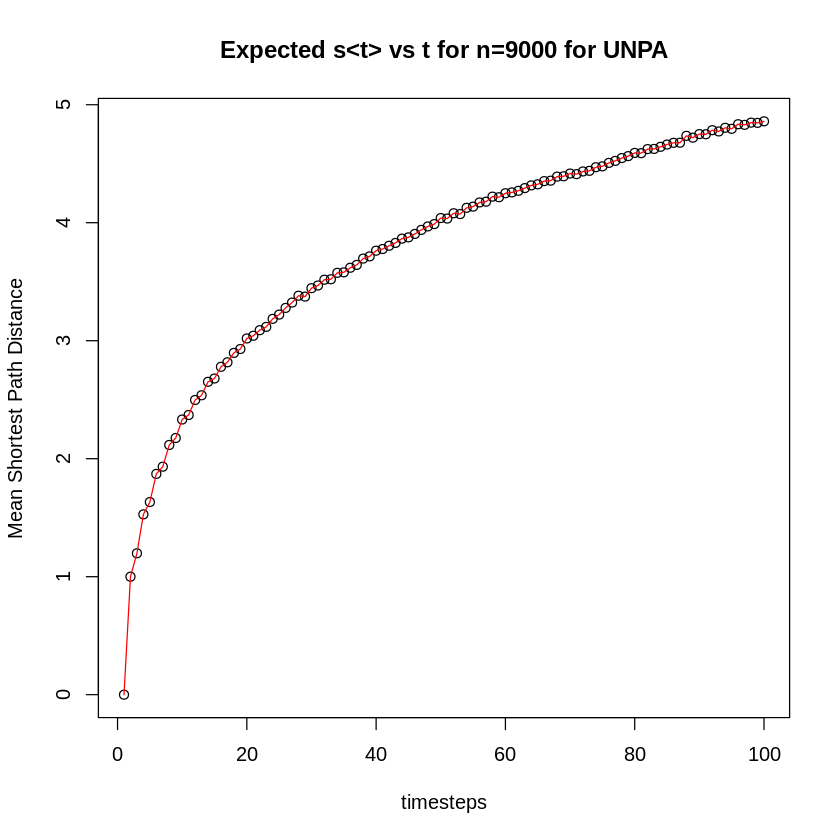

In [35]:
plot(time_steps_taken,mean_shortest_path,main='Expected s<t> vs t for n=9000 for UNPA',xlab='timesteps',ylab='Mean Shortest Path Distance')
lines(time_steps_taken,mean_shortest_path,col='red')

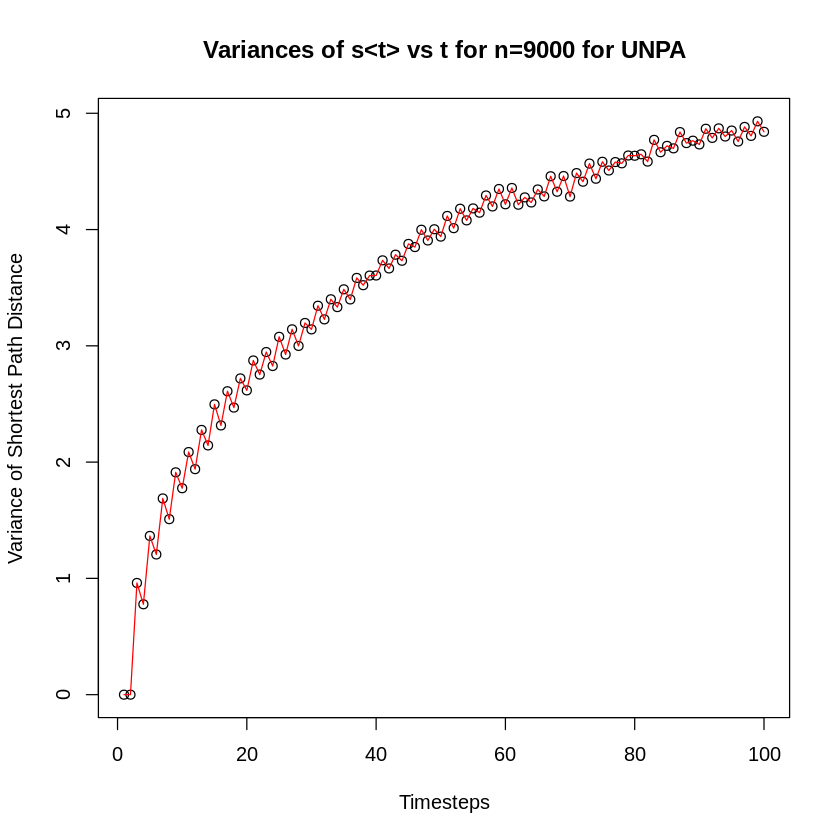

In [36]:
plot(time_steps_taken,variance_shortest_path,main='Variances of s<t> vs t for n=9000 for UNPA',xlab='Timesteps',ylab='Variance of Shortest Path Distance')
lines(time_steps_taken,variance_shortest_path,col='red')

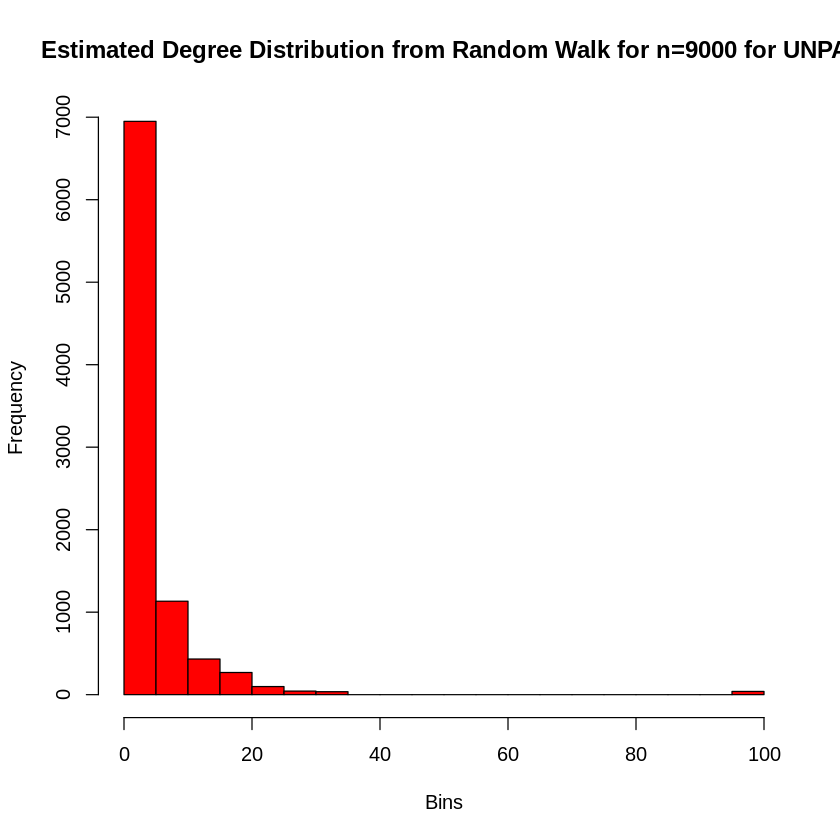

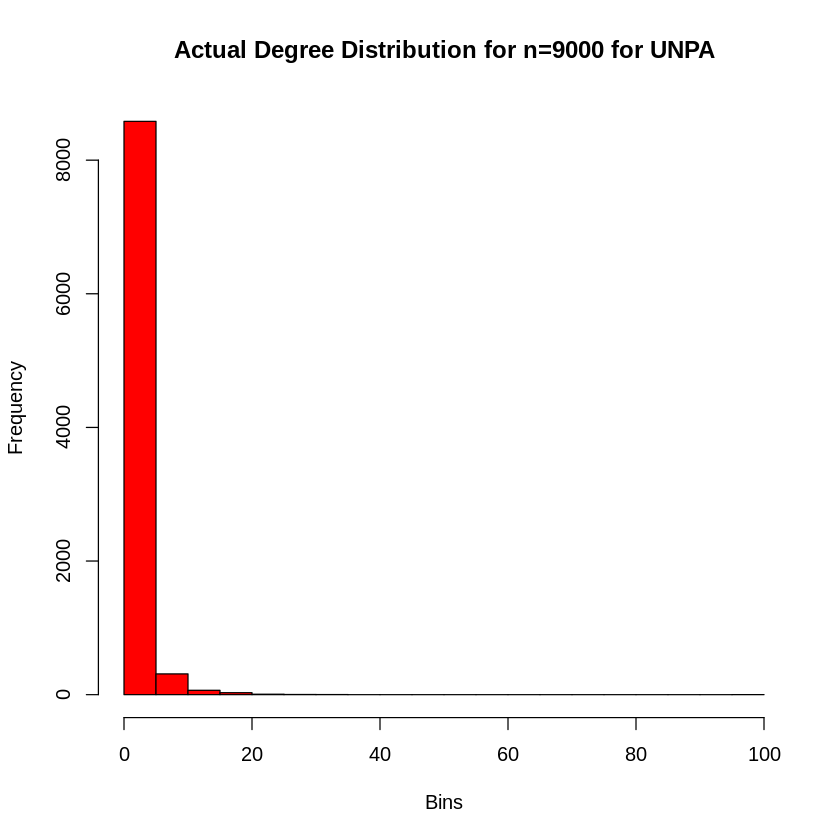

In [37]:
hist(degree_distribution_data,col='red',xlab='Bins',ylab='Frequency',main="Estimated Degree Distribution from Random Walk for n=9000 for UNPA")
hist(degree(graph),col='red',xlab='Bins',ylab='Frequency',main="Actual Degree Distribution for n=9000 for UNPA")

### Question 3 PageRank

**Question 3A**

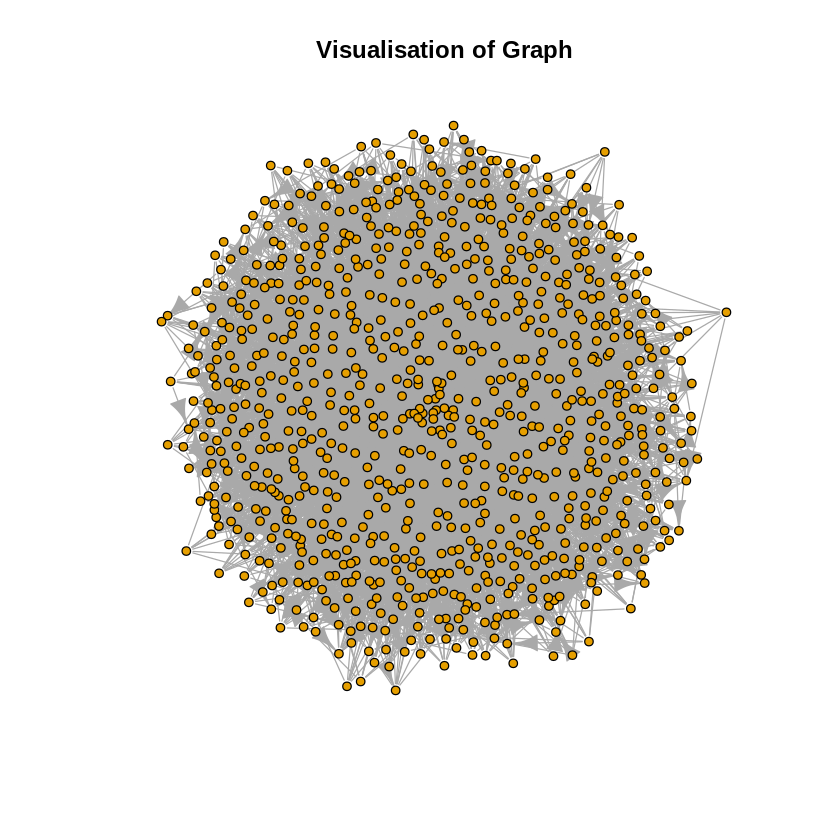

In [41]:
n<-900
m<-4
graph1 <- barabasi.game(n=n,m=m,directed=TRUE)
graph2 <-barabasi.game(n=n,m=m,directed=TRUE)

graph_from_both <- add_edges(graph1,c(t(as_edgelist(permute(graph2,sample(vcount(graph2))))))) ## c and t prevent a self -loop from forming at 1
plot(graph_from_both,vertex.label="",vertex.size=3,main='Visualisation of Graph')

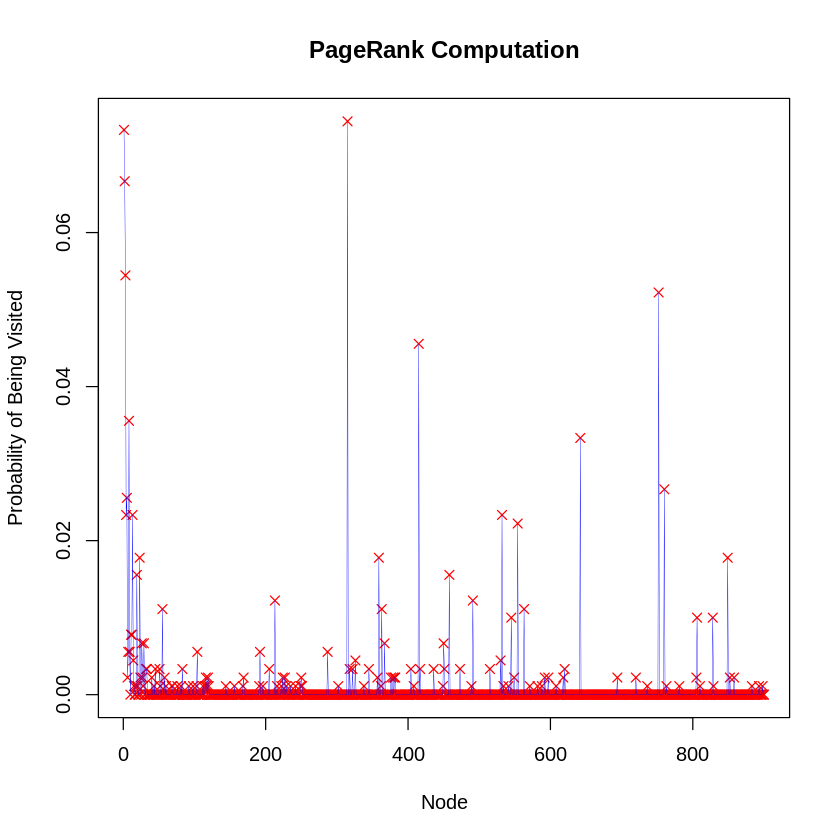

In [45]:
num_steps = 900
vertex_frequency = matrix(data=0,nrow=num_steps)
for(i in 1:num_steps)
{
  start_node = sample(vcount(graph_from_both),1)
  visited_nodes=  random_walk(graph=graph_from_both,start=start_node,steps=num_steps)
  visited<- visited_nodes[length(visited_nodes)]
  vertex_frequency[visited]<-vertex_frequency[visited]+1
}

normalised_vertex_frequency <-vertex_frequency/sum(vertex_frequency)
plot(seq(1:900),normalised_vertex_frequency,pch=4,col='red',xlab='Node',ylab='Probability of Being Visited',main='PageRank Computation')
lines(normalised_vertex_frequency,lwd=0.3,col="blue")

In [46]:
print("Nodes sorted by their popularity")
ordered <- order(normalised_vertex_frequency,decreasing=TRUE)
for(i in 1:length(ordered))
{
  print(sprintf("Node %d with probability %f",ordered[i],100*normalised_vertex_frequency[ordered[i]]))
}

[1] "Nodes sorted by their popularity"
[1] "Node 315 with probability 7.444444"
[1] "Node 1 with probability 7.333333"
[1] "Node 2 with probability 6.666667"
[1] "Node 3 with probability 5.444444"
[1] "Node 752 with probability 5.222222"
[1] "Node 415 with probability 4.555556"
[1] "Node 8 with probability 3.555556"
[1] "Node 642 with probability 3.333333"
[1] "Node 760 with probability 2.666667"
[1] "Node 5 with probability 2.555556"
[1] "Node 4 with probability 2.333333"
[1] "Node 13 with probability 2.333333"
[1] "Node 532 with probability 2.333333"
[1] "Node 554 with probability 2.222222"
[1] "Node 23 with probability 1.777778"
[1] "Node 359 with probability 1.777778"
[1] "Node 849 with probability 1.777778"
[1] "Node 19 with probability 1.555556"
[1] "Node 458 with probability 1.555556"
[1] "Node 213 with probability 1.222222"
[1] "Node 491 with probability 1.222222"
[1] "Node 55 with probability 1.111111"
[1] "Node 363 with probability 1.111111"
[1] "Node 563 with probability 1.1

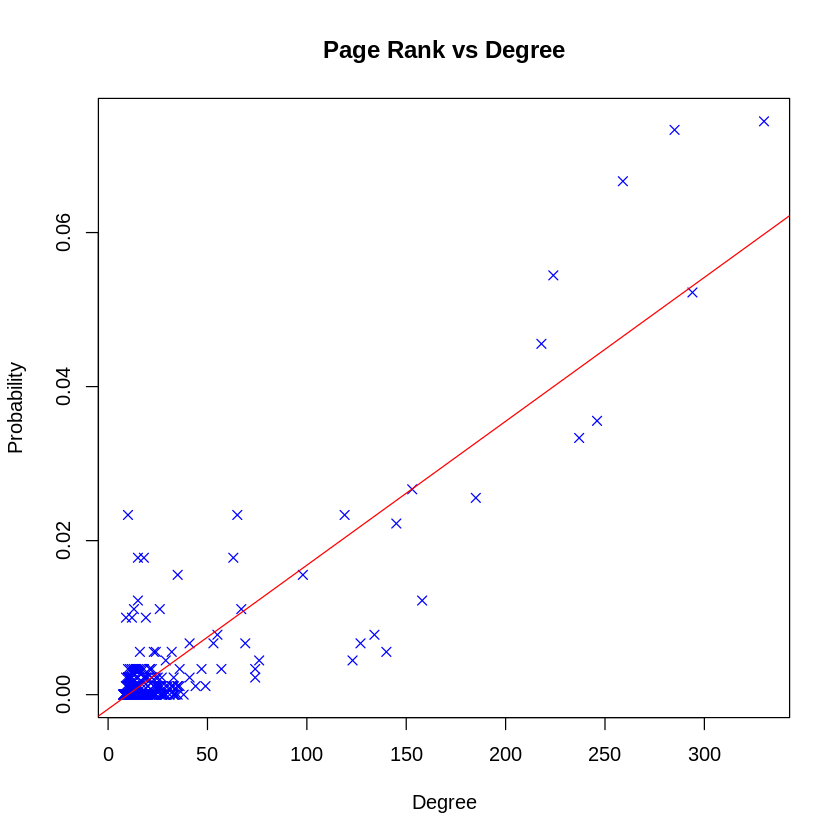

In [47]:
plot(degree(graph_from_both),normalised_vertex_frequency,pch=4,lwd=1,col='blue',xlab='Degree',ylab='Probability',main='Page Rank vs Degree')
abline(lm(normalised_vertex_frequency~degree(graph_from_both)),lty=1,lwd=1,col='red')


In [48]:
create_transition_matrix = function (g){
    
    # WARNING: make sure your graph is connected (you might input GCC of your graph)
    
    vs = V(g)
    n = vcount(g)
    adj = as_adjacency_matrix(g)
    #print(adj)
    adj[diag(rowSums(adj) == 0)] = 1  # handle if the user is using the function for networks with isolated nodes by creating self-edges
    z = matrix(rowSums(adj, , 1))
    #print(z)
    transition_matrix = adj / repmat(z, 1, n)  # normalize to get probabilities
    
    return(transition_matrix)
}

In [49]:
random_walk_with_teleportation = function (g, num_steps, start_node, transition_matrix = NULL,tp = 0.15){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        PMF = transition_matrix[v, ]
        rn = runif(min=0,max=1.0,n=1)
        if (rn < tp)
          {v = sample(1:vcount(g), 1)}    
        else
          {v = sample(1:vcount(g), 1, prob = PMF) }       
    }
    
    return(v)
}

**Question 3B**

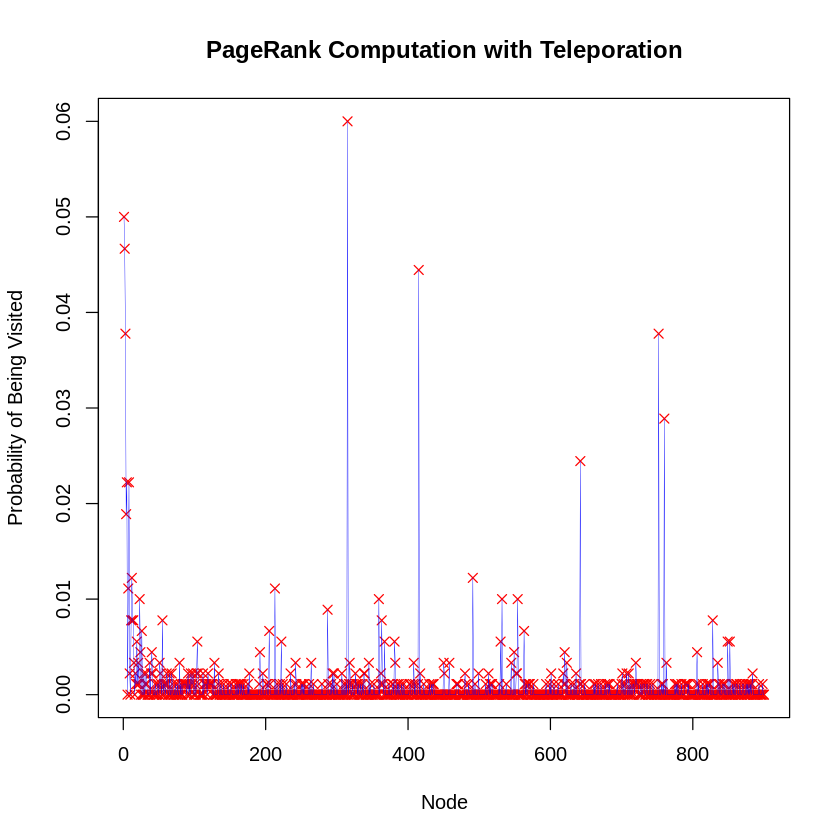

In [50]:
num_steps<-900
trn_matrix = create_transition_matrix(graph_from_both)

page_rank_scores = matrix(data=0,nrow=num_steps)

for(i in 1:num_steps)
{
  start_node = sample(vcount(graph_from_both),1)
  last_node_to_visit = random_walk_with_teleportation(graph_from_both,num_steps,start_node,trn_matrix,0.2)
  page_rank_scores[last_node_to_visit]<-page_rank_scores[last_node_to_visit]+1
}

normalised_page_rank_scores_with_teleportation <- page_rank_scores/sum(page_rank_scores)
plot(seq(1:900),normalised_page_rank_scores_with_teleportation,pch=4,col='red',xlab='Node',ylab='Probability of Being Visited',main='PageRank Computation with Teleporation')
lines(normalised_page_rank_scores_with_teleportation,lwd=0.3,col="blue")

In [51]:
print("Nodes sorted by their popularity")
ordered <- order(normalised_page_rank_scores_with_teleportation,decreasing=TRUE)
for(i in 1:length(ordered))
{
  print(sprintf("Node %d with probability %f",ordered[i],100*normalised_page_rank_scores_with_teleportation[ordered[i]]))
}

[1] "Nodes sorted by their popularity"
[1] "Node 315 with probability 6.000000"
[1] "Node 1 with probability 5.000000"
[1] "Node 2 with probability 4.666667"
[1] "Node 415 with probability 4.444444"
[1] "Node 3 with probability 3.777778"
[1] "Node 752 with probability 3.777778"
[1] "Node 760 with probability 2.888889"
[1] "Node 642 with probability 2.444444"
[1] "Node 5 with probability 2.222222"
[1] "Node 8 with probability 2.222222"
[1] "Node 4 with probability 1.888889"
[1] "Node 12 with probability 1.222222"
[1] "Node 491 with probability 1.222222"
[1] "Node 7 with probability 1.111111"
[1] "Node 213 with probability 1.111111"
[1] "Node 23 with probability 1.000000"
[1] "Node 359 with probability 1.000000"
[1] "Node 532 with probability 1.000000"
[1] "Node 554 with probability 1.000000"
[1] "Node 287 with probability 0.888889"
[1] "Node 11 with probability 0.777778"
[1] "Node 13 with probability 0.777778"
[1] "Node 14 with probability 0.777778"
[1] "Node 55 with probability 0.77777

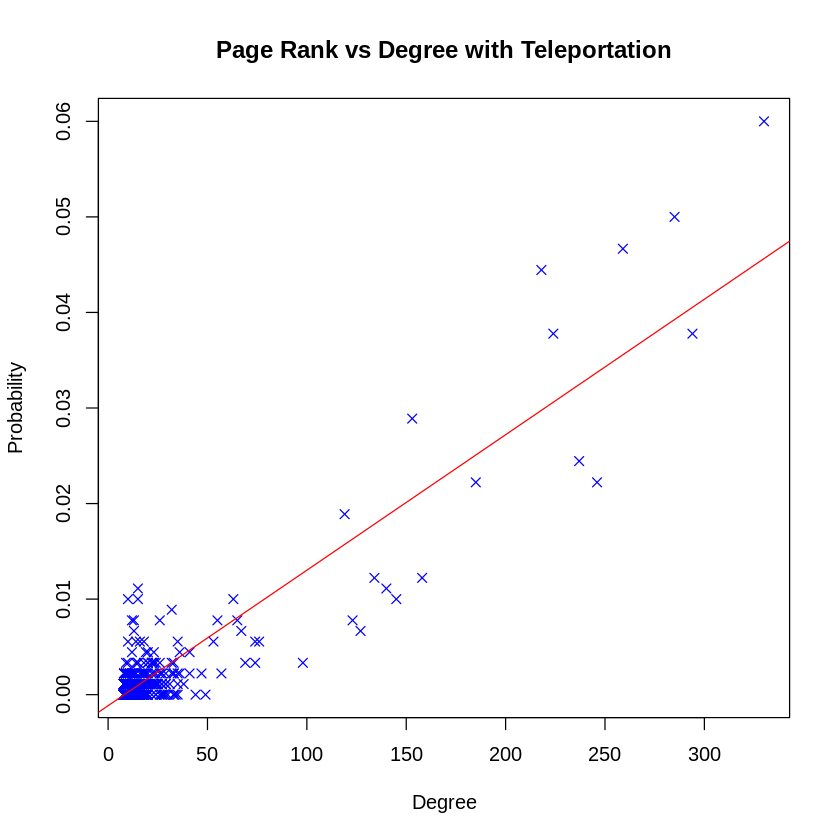

In [52]:
plot(degree(graph_from_both),normalised_page_rank_scores_with_teleportation,pch=4,lwd=1,col='blue',xlab='Degree',ylab='Probability',main='Page Rank vs Degree with Teleportation')
abline(lm(normalised_page_rank_scores_with_teleportation~degree(graph_from_both)),lty=1,lwd=1,col='red')


### Question 4 - Personalised Page Rank

**Question 4a** 

In [53]:
random_walk_with_teleportation_with_page_rank = function (g, num_steps, start_node, transition_matrix = NULL,tp = 0.15, pr = pr){ #pr = visited_frequncy/sum(visted_frequency)
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        PMF = transition_matrix[v, ]
        rn =  runif(min=0,max=1.0,n=1)
        if(rn < tp)
          {v = sample(1:vcount(g), 1, prob = pr)}    
        else
          {v = sample(1:vcount(g), 1, prob = PMF)}       
    }
    
    return(v)
}

In [54]:
page_rank_probabilities = page_rank(graph_from_both,directed=TRUE)$vector

In [55]:
num_steps<-900
trn_matrix = create_transition_matrix(graph_from_both)

visitation_frequency = matrix(data=0,nrow=num_steps)
for(i in 1:num_steps)
{
  starting_node = sample(vcount(graph_from_both),1)
  last_node = random_walk_with_teleportation_with_page_rank(graph_from_both,num_steps,starting_node,trn_matrix,tp=0.2,pr=page_rank_probabilities)
  visitation_frequency[last_node]<-visitation_frequency[last_node]+1
}

In [56]:
normalised_visitation_frequency = visitation_frequency/sum(visitation_frequency)

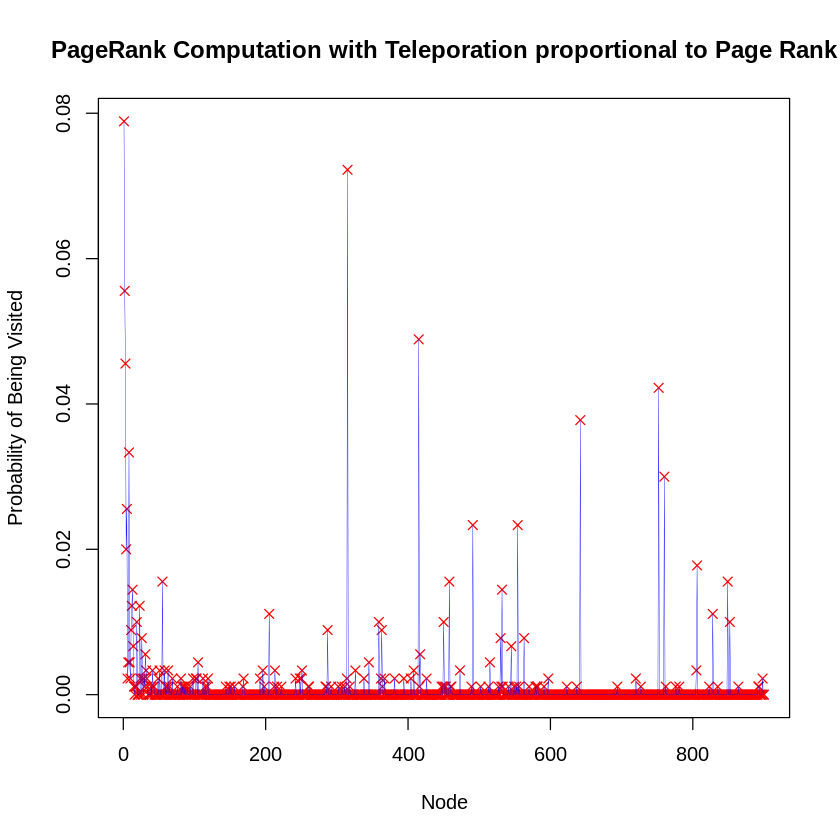

In [57]:
plot(seq(1:900),normalised_visitation_frequency,pch=4,col='red',xlab='Node',ylab='Probability of Being Visited',main='PageRank Computation with Teleporation proportional to Page Rank')
lines(normalised_visitation_frequency,lwd=0.3,col="blue")

In [58]:
print("Nodes sorted by their popularity")
ordered <- order(normalised_visitation_frequency,decreasing=TRUE)
for(i in 1:length(ordered))
{
  print(sprintf("Node %d with probability %f",ordered[i],100*normalised_visitation_frequency[ordered[i]]))
}

[1] "Nodes sorted by their popularity"
[1] "Node 1 with probability 7.888889"
[1] "Node 315 with probability 7.222222"
[1] "Node 2 with probability 5.555556"
[1] "Node 415 with probability 4.888889"
[1] "Node 3 with probability 4.555556"
[1] "Node 752 with probability 4.222222"
[1] "Node 642 with probability 3.777778"
[1] "Node 8 with probability 3.333333"
[1] "Node 760 with probability 3.000000"
[1] "Node 5 with probability 2.555556"
[1] "Node 491 with probability 2.333333"
[1] "Node 554 with probability 2.333333"
[1] "Node 4 with probability 2.000000"
[1] "Node 806 with probability 1.777778"
[1] "Node 55 with probability 1.555556"
[1] "Node 458 with probability 1.555556"
[1] "Node 849 with probability 1.555556"
[1] "Node 13 with probability 1.444444"
[1] "Node 532 with probability 1.444444"
[1] "Node 12 with probability 1.222222"
[1] "Node 23 with probability 1.222222"
[1] "Node 205 with probability 1.111111"
[1] "Node 828 with probability 1.111111"
[1] "Node 19 with probability 1.00

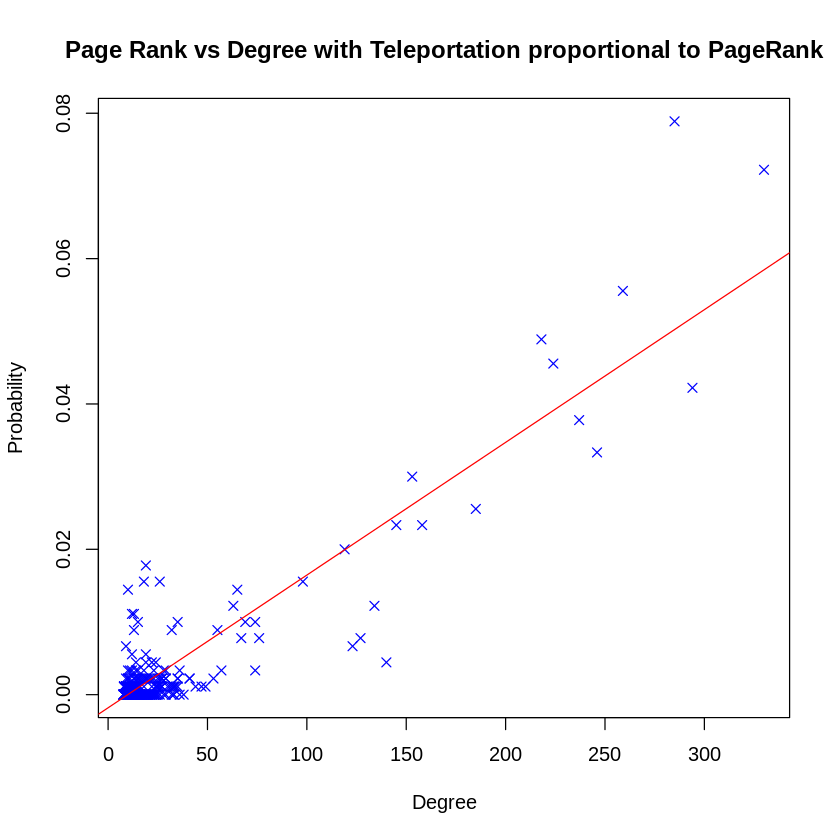

In [59]:
plot(degree(graph_from_both),normalised_visitation_frequency,pch=4,lwd=1,col='blue',xlab='Degree',ylab='Probability',main='Page Rank vs Degree with Teleportation proportional to PageRank')
abline(lm(normalised_visitation_frequency~degree(graph_from_both)),lty=1,lwd=1,col='red')


In [60]:
random_walk_median = function (g, num_steps, start_node, transition_matrix = NULL,tp = 0.15, pr = pr, medians = medians){ #first get median ranked pages  (2 medians)
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        
        PMF = transition_matrix[v, ]
        rn = runif(min=0,max=1,n=1)
        if (rn < tp)
          {v = sample(medians, 1)}    
        else
          {v = sample(1:vcount(g), 1, prob = PMF)}
    }
    
    return(v)
}

In [61]:
sorted_nodes = order(page_rank_probabilities)
median_page_ranks = c(sorted_nodes[449],sorted_nodes[450])
print(median_page_ranks)

[1] 143 395


In [62]:
num_steps<-900
trn_matrix = create_transition_matrix(graph_from_both)

visitation_frequency_w_median = matrix(data=0,nrow=num_steps)
for(i in 1:num_steps)
{
  starting_node = sample(vcount(graph_from_both),1)
  last_node = random_walk_median(graph_from_both,num_steps,starting_node,trn_matrix,tp=0.2,pr=page_rank_probabilities,medians = median_page_ranks)
  visitation_frequency_w_median[last_node]<-visitation_frequency_w_median[last_node]+1
}

In [63]:
normalised_visitation_frequency_w_median = visitation_frequency_w_median/sum(visitation_frequency_w_median)

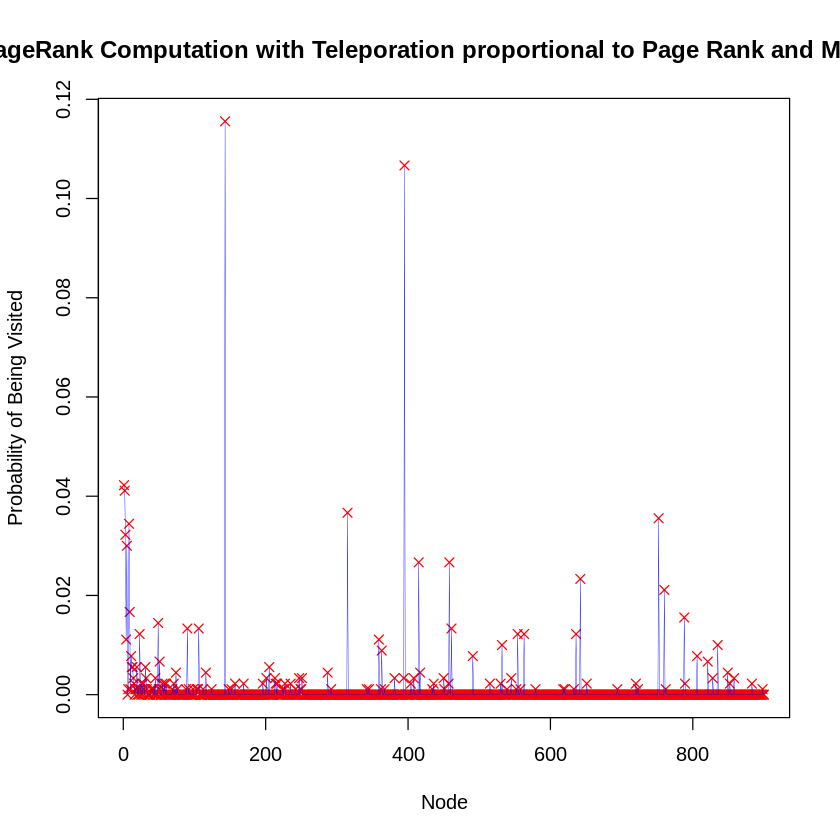

In [64]:
plot(seq(1:900),normalised_visitation_frequency_w_median,pch=4,col='red',xlab='Node',ylab='Probability of Being Visited',main='PageRank Computation with Teleporation proportional to Page Rank and Median ')
lines(normalised_visitation_frequency_w_median,lwd=0.3,col="blue")

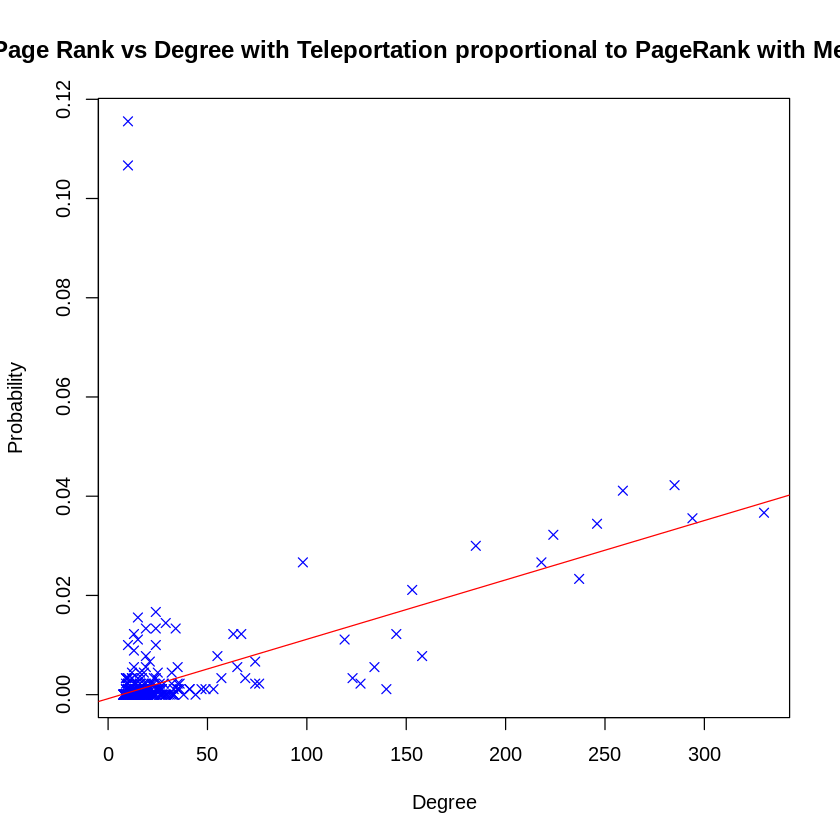

In [65]:
plot(degree(graph_from_both),normalised_visitation_frequency_w_median,pch=4,lwd=1,col='blue',xlab='Degree',ylab='Probability',main='Page Rank vs Degree with Teleportation proportional to PageRank with Median')
abline(lm(normalised_visitation_frequency_w_median~degree(graph_from_both)),lty=1,lwd=1,col='red')
